# Implementation of learning methods for the symmetric rendezvous problem on the line

Student : Stephane Liem Nguyen

Supervisor : Pierre Leone


---
Notations are inspired or taken from OpenAI Gym:
```python
import gym
env = gym.make("CartPole-v1")
observation = env.reset()
for _ in range(1000):
  action = env.action_space.sample() # your agent here (this takes random actions)
  observation, reward, done, info = env.step(action)

  if done:
    observation = env.reset()
env.close()
```

Minimal code (without update of probabilities, rewards are not saved too etc.):

```python
M = 1
d = 2  # initial distance between the two agents (in absolute value)
K = 1
n_episodes = int(1e6)

policy = BoundedDistancePreservingPolicyTree(np.array([]), np.array([-1, 0, 1]), K+M, M, K)
env = RDVOnLineEnvironmentV1(d, policy)  # (self, initial_distance : int, policyDataStructure : Policy)

agent1 = env.agents[0]
agent2 = env.agents[1]

for episode in range(n_episodes):
  observations = env.reset()  # reset trajectories
  dones = [False, False]
  tmpTime = 0
  while (not(dones[0])):
    old_observations = np.copy(observations)
    # stochastic policy
    p1, p2 = [agent1.policy(old_observations[0]), agent2.policy(old_observations[1])]

    actions = [agent1.sample_action(p1), agent2.sample_action(p2)]
    observations, rewards, dones, info = env.step(actions)  # info not used
    # save in the agents the obversations
    agent1.traj, agent2.traj = observations
    tmpTime += 1

    # we know with our policy that they came back at their original position at tmpTime <= K+m <= K+M but an agent does not know the trajectory of the other one
    if (tmpTime >= K+M):  # same done for both
      tmpTime = 0
      agent1.reset_traj()
      agent2.reset_traj()
      observations = [agent1.get_traj(), agent2.get_traj()]
      # cannot use env.reset() because it would change the initial position of agent 2
```

The code doesn't print anything, it's just to show the basic building blocks of the simulation.

# Setup

## Numpy, copy, random, matplotlib, pickle

In [ ]:
import numpy as np
import copy
import random
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)  # https://matplotlib.org/stable/gallery/ticks_and_spines/major_minor_demo.html

## Drive and pickle

In [ ]:
import pickle


# Codes from https://stackoverflow.com/questions/4529815/saving-an-object-data-persistence
def save_object(obj, filename):  # obj can be a list of objects
    with open(filename, 'wb') as output:  # Overwrites any existing file. b for binary
      pickle.dump(obj, output, pickle.HIGHEST_PROTOCOL)


def load_object(filename):
    """ Unpickle a file of pickled data. Returns the generator. Use a for loop to get each object for instance"""
    with open(filename, "rb") as f:
      return pickle.load(f)

# sample usage
# save_object(company1, 'company1.pkl')

In [ ]:
from google.colab import drive
# You will have to pass an authorization code after authentification to mount your drive.
drive.mount('/content/drive')

Mounted at /content/drive


Change this folder below in order to save outputs where you want

In [ ]:
# Change directory to the place where we'll save everything
%cd drive/MyDrive/ProjetBachelorCS/ProjetBachelorCS_Shared/Outputs

/content/drive/MyDrive/ProjetBachelorCS/ProjetBachelorCS_Shared/Outputs


## Savefig

In [ ]:
import os


def mysavefig(savepath):
    directory = os.path.split(savepath)[0]

    if not(os.path.exists(directory)) and directory != "":
        os.makedirs(directory)
    plt.savefig(savepath, dpi=300, bbox_inches='tight')

# Informations

A trajectory until meeting is defined as a repetition of sub-trajectories of length $N=K + M$.

For the strategies with two phases, in the sub-trajectories, agents can move as they want within the first $K$ actions (this is what we call the first phase) but agents are forced to go back to their initial absolute position afterwards (second phase). Although, they both might reach their initial absolute position before the last time step of the sub-trajectory, it's impossible to stop earlier the sub-trajectory and go to another one before because agents do not know if the other agent came back to its initial position.

For the strategies without the two phases, agents are just bounded by the idea that actions are allowed only if it's possible to go back to their initial position within the same sub-trajectory after taking the action. Note that $K=N$ and $M=0$ for strategies without the two phases and the meaning of $M$ is no longer the same.

Agents will always do $N=K+M$ actions. To recap, for each sub-trajectory/repetition (for all our strategies), agents go back to their initial position or meet within the sub-trajectory.

To simplify some notations, we use $traj$ in the code for sub-trajectory and as remark, we reinitialize the sub-trajectory/observations between each sub-trajectory.

An observation is defined as a list or array containing all the actions done in the sub-trajectory. Summing it gives the relative position of an agent (if we suppose that agents go back to their initial position everytime between sub-trajectories).

The whole state is unknown by agents and is defined by the absolute positions of the two agents. The environment checks at each time step if the agents met, if yes, the environment returns that information and a $\Delta t=meetingTime - lastTimeStep$.

## Diagram of all simulations with update of the policy
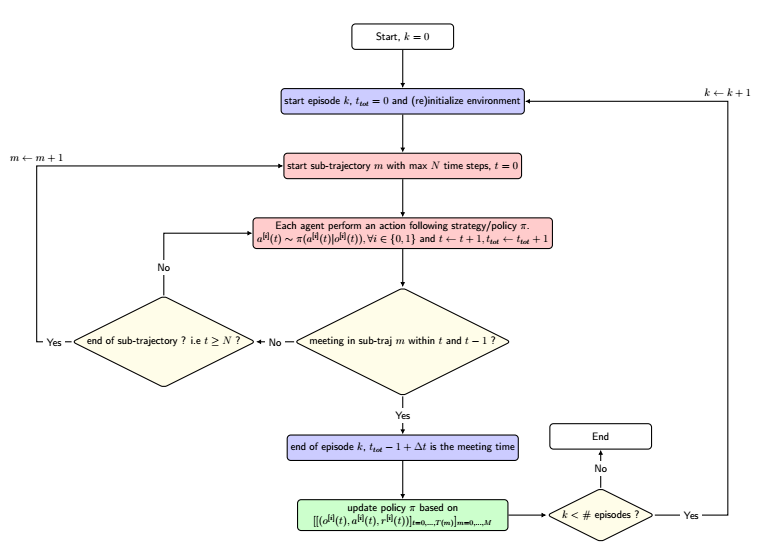

## Diagram of transitions within a sub-trajectory, without exploration rate $\epsilon$

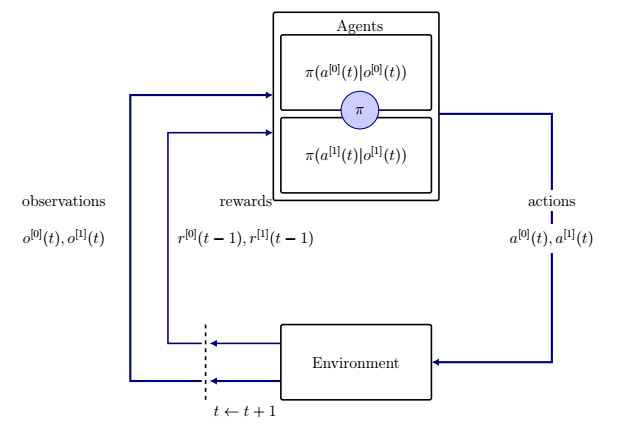

# Policy Tree

Observations are stored in the nodes of the tree. Each depth corresponds to `tmpTime` (see simulation functions later). For instance, for depth $0$, we have `tmpTime=0`.

We also have to stop the decision-making or stop the agents to take actions from the leaf nodes (**the last depth/layer of the tree have probabilities in the nodes but are never used and should never be used**) (`tmpTime=K+M` or depth of the tree for the sub-case without two phases) (see code for simulation functions to understand better `tmpTime`, it's the time only in a sub-trajectory.)

The tree has a branching factor corresponding to the number of actions, in our case we'll always use $3$ actions; left, do nothing, right for each time step.

Going through the entire tree can become extremely expensive and computing the exact meeting time even more.

---


`PolicyTree` is a class used to store the probabilities of the stochastic policy in a tree. The name does not come from existing articles but we might take inspiration of them later on.

[Example of article](https://www.google.com/url?sa=t&rct=j&q=&esrc=s&source=web&cd=&ved=2ahUKEwiJ4LmEi7DvAhWwxYUKHRIYDgQQFjACegQIARAD&url=https%3A%2F%2Fwww.aaai.org%2Focs%2Findex.php%2FAAAI%2FAAAI15%2Fpaper%2Fdownload%2F9781%2F9908&usg=AOvVaw2sz-Sq7tAThM9uX84t6ZZv).

`observation_space` and `action_space` are 1D `ndarray`

## Policy

In [ ]:
class Policy:  # for a particular agent and only discrete action space and discrete observation space
  """
  Policy class is the parent class for all stochastic policies with discrete action and observation spaces.

  From all subclasses, we must be able to get a probability vector over actions given a state or observation.

  Moreover, they must have a default initial policy and must be able to update their policies.
  """
  def __init__(self, observation_space, action_space):
    self.observation_space = observation_space
    self.action_space = action_space
    self.n_observations = observation_space.size
    self.n_actions = action_space.size

  def pi_a_obs(self, observation):
    # probability vector should be 1D with shape (n_actions, )
    # by default it's uniform
    return np.ones((self.n_actions,))/self.n_actions  # probability vector over actions

  def update_policy(self):
    pass

## NodePolicyTree

In [ ]:
class NodePolicyTree():
  """
  NodePolicyTree class is used as a node for the PolicyTree class

  A node A contains:
  - an observation (history of actions) (the numpy array changes
    its size depending on the depth in the tree in PolicyTree class) (2D array)

  - a parent node (None for root node)

  - a list of children (updated each time we instantiate
    a new node B with the parent A)

  - a probability vector over actions given the observation
    for node A (1D array).

  - updates: numpy array of flags saying if the probabilities associated
    with the actions can be modified by update_policy (1D array)

  - nbA : numpy array counting the number of times the agent went
    through the actions/links to the children. (1D array)

    Example: self.nbA[idx] with idx=0 counts the number of times
      the agent took first action from the node self
  """
  def __init__(self, observation, parent, depth, probability_vector_over_actions, updates=None):
    self.observation = observation
    self.parent = parent  # None for root node
    if self.parent is not(None):
      parent.add_child(self)
    # children
    self.children = []
    self.depth = depth  # = time

    # given the observation
    self.probability_vector_over_actions = probability_vector_over_actions
    self.reset_nbA()

    # flag for each actions telling if the proba can be updated or not in the policy update phase
    if isinstance(updates, type(None)):
      self.updates = np.array([True]*self.probability_vector_over_actions.size)  # True for all actions
    elif isinstance(updates, type([])):
      self.updates = np.array(updates)  # convert into array
    elif isinstance(updates, type(np.array([]))):
      self.updates = updates
    assert self.updates.ndim == 1, "updates should be a 1d numpy array"

  def add_child(self, child):
    self.children += [child]

  def increment_nbA(self, idx):
    self.nbA[idx] += 1

  def reset_nbA(self):
    self.nbA = np.zeros(self.probability_vector_over_actions.shape)

## PolicyTree (with policy update)

If we want to create a policy `PolicyTree` but with different probabilities (and/or block modifications of some probabilities in the update `update_policy`), we can add a new function taking an instance of the class `PolicyTree` and modify the attributes `updates` and/or `probability_vector_over_actions` of the nodes. The list or array `updates` is normally of the same length or size as the branching factor (number of actions).

Moreover, if we want to use it, we have to give it to the initialization of the environment (the corresponding class).

In [ ]:
class PolicyTree(Policy):  # Bounded in time
  """
  PolicyTree class is a subclass of Policy and arranges all the observations such that at depth t
  of the tree contains all possible observations at time t. Children of an observation follows the same
  order as the action space.

  The depth t is limited by tree_depth.

  Each observation is a numpy array containing all the history of the actions (we also know
  with probability 1 what observation we will get after taking an action : p(obs' | obs, action)=1)

  Each link between observations in the tree has a probability and action associated with it.

  From all subclasses, we must be able to get a probability vector over actions given a state or observation
  by looking at the links going out of the node/observation.

  ---------------------------------------------------------------------------------------------------------------------------------------
  Example of a tree with branching factor 3 due to 3 actions -1, 0 and 1.

    test = PolicyTree(np.array([1,2,3]),np.array([-1,0,1]),3)

    print(test.tree)  # get the list of rows : each row is a list of nodes NodePolicyTree
    print(len(test.tree[2]))  # get the number of elements in the depth 2
    print(test.get_row_tree(1)[0])  # get first node in the row/depth 1

    print(test.pi_a_obs(np.array([[-1,-1,0]]) )) # get the probability vector for that particular observation

  """
  def __init__(self, observation_space, action_space, tree_depth):
    super().__init__(observation_space, action_space)
    # branching factor : n_actions
    self.b = self.n_actions  # branching factor
    self.tree_depth = tree_depth  # maximum time steps T
    # Example: For rdv problem, it's K steps + boundary M
    # Initial policy : uniform
    # probability vector should be 1D with shape (n_actions, )
    probability_vector_over_actions = np.ones((self.n_actions,))/self.n_actions  # or a list of values with a sum of 1

    self.root = NodePolicyTree(np.array([[]]), None, 0, probability_vector_over_actions, updates=[True]*self.n_actions)  # observation is the history of actions!

    self.tree = [[self.root]]  # contains list of nodes, each list is one depth
    # Extremely slow for bigger tree_depth
    for time in range(1, tree_depth+1):
      # parent : self.tree[time-1] , append action at the end of parent for the new observation : np.hstack((parent.observation.reshape(1,), action)) then change it into 2D array
      row = [NodePolicyTree(np.array([np.hstack((parent.observation.reshape(-1,), action))]), parent, time, probability_vector_over_actions, updates=[True]*self.n_actions) for parent in self.tree[time-1] for action in self.action_space]
      self.tree += [row]  # add one depth to the tree

  def get_row_tree(self, time):
    """
    Return a list of nodes NodePolicyTree for the depth=time

    This function is equivalent to self.tree[time]
    """
    return self.tree[time]

  def print_tree(self):
    """
    Print the tree
    """
    for row in self.tree:
      print("row", row)
      for node in row:
        print(node.observation, node.probability_vector_over_actions)

  @staticmethod
  def static_plot_tree(policy, d):
    """
    Plot the policy (only with actions {-1,0,1}) only one side because the other one should be symmetric (+-1 forward direction). Only plot for the first "K+M"/sub-trajectory
    """
    fig = plt.figure(figsize=((len(policy.tree)-1)*4, 8*policy.b))  # width, height
    plt.xlabel("t")
    plt.ylabel("x")
    # policy.b**(len(policy.tree)-1))
    for x, row in enumerate(policy.tree):
      position_plotted_dot = np.full((len(row), ), fill_value=float("inf"))  # y axis position of already plotted dot for agent 1, false if not plotted
      if x > 0:
        eps = 1e-15  # 0.098 for REINFORCE-like just to see strategies can be close to what we want
        zero_prob_action_from_parent = np.hstack([(node.parent.probability_vector_over_actions[int(node.observation[0, -1]+1)] < eps) for node in row])  # between this time step and just before
        # node.parent.probability_vector_over_actions[int(node.observation[0, -1]+1)] is the probability of the action taken between the node and the parent.
        # parent_path, between previous time steps : if zero probability, set to True, otherwise False. Is used by children to check if path has non zero proba, if yes plot, if no, do not plot
        zero_prob_of_parent_path = np.repeat(zero_prob_of_parent_path, policy.b) + zero_prob_action_from_parent  # adding : gives True if some probability were 0.. also adding True with True gives True
      else:
        zero_prob_of_parent_path = np.zeros((len(row), ), dtype="bool")
      for node_idx, node in enumerate(row):
        # node.parent.probability_vector_over_actions[int(node.observation[0, -1]+1)] > 0)
        if ((node.parent is not None) and not(zero_prob_of_parent_path[node_idx])):  # node.observation[0, -1]+1 is a mapping from the actions -1, 0, 1 to the indexes 0 1 2
          # agent 1
          if (node.observation[0, 0] in [-1, 0]):  # only look at sub-tree on the left starting by -1 or 0 (bottom)
            plt.plot([x-1, x], [np.sum(node.parent.observation), np.sum(node.observation)], color='k', marker='o', markersize=4, linewidth=2, zorder=1)
            position_plotted_dot[node_idx] = np.sum(node.observation)

          # agent 2
          plt.plot([x-1, x], [np.sum(node.parent.observation) - d, np.sum(node.observation) - d], color='r', marker='o', markersize=4, linewidth=2, linestyle='--', dashes=(1, 2), zorder=2)
          plt.plot([x-1, x], [np.sum(node.parent.observation) + d, np.sum(node.observation) + d], color='b', marker='o', markersize=4, linewidth=2, linestyle='--', dashes=(1, 3), zorder=3)
          # meeting
          if ((np.sum(node.observation) - d) in position_plotted_dot):
            plt.plot(x, np.sum(node.observation) - d, 'ro', markersize=15, markeredgewidth=1, fillstyle='none')
          if ((np.sum(node.observation) + d) in position_plotted_dot):
            plt.plot(x, np.sum(node.observation) + d, 'ro', markersize=15, markeredgewidth=1, fillstyle='none')

  def plot_tree(self, d):
    PolicyTree.static_plot_tree(self, d)

  def get_node_tree_from_observation(self, observation):
    """
    observation should be a 2d array of shape 1 x N (N=depth in the code)

    Return node NodePolicyTree
    """
    # Search for the observation in the tree

    ## First find the depth in the tree:
    depth = observation.size  # if size of observation is bigger than the max depth -1 of the tree, we will get an error
    assert observation.shape[0] == 1, "observation shape is not (1,else)"
    assert depth <= len(self.tree)-1, "observation is not in the tree, length of observation is too big"
    ## Go from root to the depth
    parent = self.root
    # Faster
    for row in range(depth):  # row + 1 = time , row from 0 to  len(self.tree)-1
      assert observation[0, row] in self.action_space, "unknown action at this time in observation"
      idx = int(np.where(self.action_space == observation[0, row])[0])  # get index to know which child to choose based on the action at time t for the observation
      parent = parent.children[idx]  # the tree children are in the same order as the action space
    node = parent
    return node

  def pi_a_obs(self, observation):
    """
    observation should be a 2d array of shape 1 x N (N=depth in the code)

    Return Pi(action | observation) (probability_vector_over_actions given observation)
    """
    node = self.get_node_tree_from_observation(observation)
    return node.probability_vector_over_actions

  def update_policy_reinforcing_last_sub_trajs(self, K, M, list_traj1, list_traj2):
    """
    Update using the last "K+M" (sub-trajectory)

    We suppose we update ONLY at the end of each episode.

    list_traj is a list containing tuples (node, action, reward)
    """
    last1 = list_traj1[-1]  # last (node, action, reward)
    last2 = list_traj2[-1]
    list_observations = [last1[0].children[last1[1] + 1].observation, -last1[0].children[last1[1] + 1].observation, last2[0].children[last2[1] + 1].observation, -last2[0].children[last2[1] + 1].observation]
    for observation in list_observations:
      ## Go from root to the max depth
      parent = self.root
      # Modification of probabilities
      for row in range(observation.size):
        assert observation[0, row] in self.action_space, "unknown action at this time in observation"
        idx = int(np.where(self.action_space == observation[0, row])[0])  # get index to know which child to choose based on the action at time t for the observation
        parent = parent.children[idx]  # the tree children are in the same order as the action space
        p = np.copy(parent.parent.probability_vector_over_actions)  # update the probability between parent and the child

        alpha = np.zeros(parent.parent.probability_vector_over_actions.shape)
        alpha[idx] = 1/(20 + parent.parent.nbA[idx])

        # mask for probabilities we do not want to modify
        mask = parent.parent.updates
        epsilon = 1e-16
        # Makes sure that we never update the "0" probability or the "1" probability of taking an action, (p < epsilon) a bit like p == 0 and (p >= 1 - epsilon) a bit like p == 1
        mask = np.bitwise_and(mask, 1 - ((p < epsilon)*((alpha - np.mean(alpha)) < 0) + (p >= 1 - epsilon)*((alpha - np.mean(alpha)) > 0)))  # 0 for probabilities we do not want to modify (for example prob=0 and we want to decrease it further).

        if np.sum(mask) > 0:
          # "Projection" in equal or less dimensions: only with the probabiltiies we want to modify instead of all with: delta = alpha - np.mean(alpha) (if we want to modify all, we get the same)
          delta = (mask*alpha - np.sum(mask*alpha)/np.sum(mask))*mask  # as if we do the projection using less dimensions and keeping some probabilities intact

          # parent.parent.probability_vector_over_actions + delta can have negative values but sums to 1, delta sums to 0
          # find step such that still on the hyperplane but also a probability vector (elements positive and <= 1)
          # p <- p + step*delta
          step = 1  # positive

          for k in range(delta.size):
            if (mask[k]) & (np.absolute(delta[k]) > 0):  # only the probabilities we modify + we'll divide by delta[k]
              if (delta[k] < 0):  # if decreasing p[k], we want p[k] + step*delta[k] >= 0
                step = np.minimum(step, -p[k]/delta[k])
              elif (delta[k] > 0):  # if increasing  p[k], we want p[k] + step*delta[k] <= 1
                step = np.minimum(step, (1-p[k])/delta[k])

          parent.parent.probability_vector_over_actions = parent.parent.probability_vector_over_actions + step*delta
          parent.parent.probability_vector_over_actions -= np.any(parent.parent.probability_vector_over_actions < 0)*np.min(parent.parent.probability_vector_over_actions)  # because there's some issues with negative numbers really close to 0..
          parent.parent.probability_vector_over_actions /= np.sum(parent.parent.probability_vector_over_actions)  # do it because of rounding errors

  def update_policy_reinforce_gradient_projection_like(self, K, M, list_traj1, list_traj2):
    """
    Policy gradient - REINFORCE-like/inspired combined with Gradient Projection Method-like update, updating directly on probabilities. Only for policyTrees with actions {-1, 0, 1}

    We suppose we update ONLY at the end of each episode.

    list_traj is a list containing tuples (node, action, reward)
    """
    lr = 0.5*1e-5  # learning rate
    #lr = 1e-4 # 1e-4

    # cumulative sum of rewards but from reversed time because G_t = R_{t+1} + G_{t+1}. Like doing cumulative sum backward
    # Compute return G_t, no discount factor gamma
    G1_vector = np.flip(np.cumsum(list(zip(*reversed(list_traj1)))[-1]))  # -1 or 2 to get the list of rewards.
    G2_vector = np.flip(np.cumsum(list(zip(*reversed(list_traj2)))[-1]))
    for (time, (node_1, action_1, reward_1),  (node_2, action_2, reward_2)) in zip(np.arange(len(list_traj1)), list_traj1, list_traj2):  # go forward
      # Retrieve the return G_t, no discount factor gamma
      G1 = G1_vector[time]
      G2 = G2_vector[time]

      idx_1 = int(action_1 + 1)  # maps actions to index
      idx_2 = int(action_2 + 1)

      p_1 = node_1.probability_vector_over_actions
      p_2 = node_2.probability_vector_over_actions
      alpha_1 = np.zeros(p_1.shape)
      alpha_2 = np.zeros(p_2.shape)

      # grad = G/node_1.probability_vector_over_actions[idx]  # if small probability, changes too much all the rest..
      # 1e-2/(1 + node_1.nbA[idx_1])*G1/np.maximum(node_1.probability_vector_over_actions[idx_1], 0.1) can give around 7 for first strat but it moves too much at the beginning.
      alpha_1[idx_1] = lr*G1/np.maximum(p_1[idx_1], 0.1)
      alpha_2[idx_2] = lr*G2/np.maximum(p_2[idx_2], 0.1)
      # mask for probabilities we do not want to modify
      mask_1 = node_1.updates
      mask_2 = node_2.updates

      epsilon = 1e-16
      # Makes sure that we never update the "0" probability or the "1" probability of taking an action, (p < epsilon) a bit like p == 0 and (p >= 1 - epsilon) a bit like p == 1
      mask_1 = np.bitwise_and(mask_1, 1 - ((p_1 < epsilon)*((alpha_1 - np.mean(alpha_1)) < 0) + (p_1 >= 1 - epsilon)*((alpha_1 - np.mean(alpha_1)) > 0)))  # 0 for probabilities we do not want to modify (for example prob=0 and we want to decrease it further).
      mask_2 = np.bitwise_and(mask_2, 1 - ((p_2 < epsilon)*((alpha_2 - np.mean(alpha_2)) < 0) + (p_2 >= 1 - epsilon)*((alpha_2 - np.mean(alpha_2)) > 0)))

      # Update and normalize. Tries to maximize the cumulative reward
      #  "Projection" in equal or less dimensions: only with the probabiltiies we want to modify instead of all with: delta = alpha - np.mean(alpha) (if we want to modify all, we get the same)
      if np.any(mask_1):
        step_1 = 1
        delta_1 = (mask_1*alpha_1 - np.sum(mask_1*alpha_1)/np.sum(mask_1))*mask_1
        # Find step such that each element of p + step*delta lies in [0, 1] range
        while not(np.all(0 <= (node_1.probability_vector_over_actions + step_1*delta_1)) and np.all((node_1.probability_vector_over_actions + step_1*delta_1) <= 1)):
          step_1 /= 2

        node_1.probability_vector_over_actions += step_1*delta_1
        node_1.probability_vector_over_actions -= np.any(node_1.probability_vector_over_actions < 0)*np.min(node_1.probability_vector_over_actions)
        node_1.probability_vector_over_actions /= np.sum(node_1.probability_vector_over_actions)  # do it because of rounding errors

        assert np.all(node_1.probability_vector_over_actions >= 0), f"Something negative in {node_1.probability_vector_over_actions}. Signs : {np.sign(node_1.probability_vector_over_actions)}"

      if np.any(mask_2):
        step_2 = 1
        delta_2 = (mask_2*alpha_2 - np.sum(mask_2*alpha_2)/np.sum(mask_2))*mask_2
        # Find step such that each element of p + step*delta lies in [0, 1] range
        while not(np.all(0 <= (node_2.probability_vector_over_actions + step_2*delta_2)) and np.all((node_2.probability_vector_over_actions + step_2*delta_2) <= 1)):
          step_2 /= 2

        node_2.probability_vector_over_actions += step_2*delta_2
        node_2.probability_vector_over_actions -= np.any(node_2.probability_vector_over_actions < 0)*np.min(node_2.probability_vector_over_actions)
        node_2.probability_vector_over_actions /= np.sum(node_2.probability_vector_over_actions)  # do it because of rounding errors

        assert np.all(node_2.probability_vector_over_actions >= 0), f"Something negative in {node_2.probability_vector_over_actions}. Signs : {np.sign(node_2.probability_vector_over_actions)}"

  def update_policy(self, K, M, list_traj1, list_traj2, method="reinforcing_last_sub_trajs"):
    """
    Update probabilities in the tree
    """
    assert len(list_traj1) == len(list_traj2), "list_traj1 should be of same length as list_traj2."

    if method == "reinforce_gradient_projection_like":
      self.update_policy_reinforce_gradient_projection_like(K, M, list_traj1, list_traj2)
    elif method == "reinforcing_last_sub_trajs":  # hardcoded..
      self.update_policy_reinforcing_last_sub_trajs(K, M, list_traj1, list_traj2)
    else:
      raise Exception(f"Policy update method not found: {method}.\n Available methods:\n {['reinforcing_last_sub_trajs', 'reinforce_gradient_projection_like']}")

In [ ]:
list(zip([1, 2, 3], reversed([(1, 2), (3, 4), (6, 7)])))

[(1, (6, 7)), (2, (3, 4)), (3, (1, 2))]

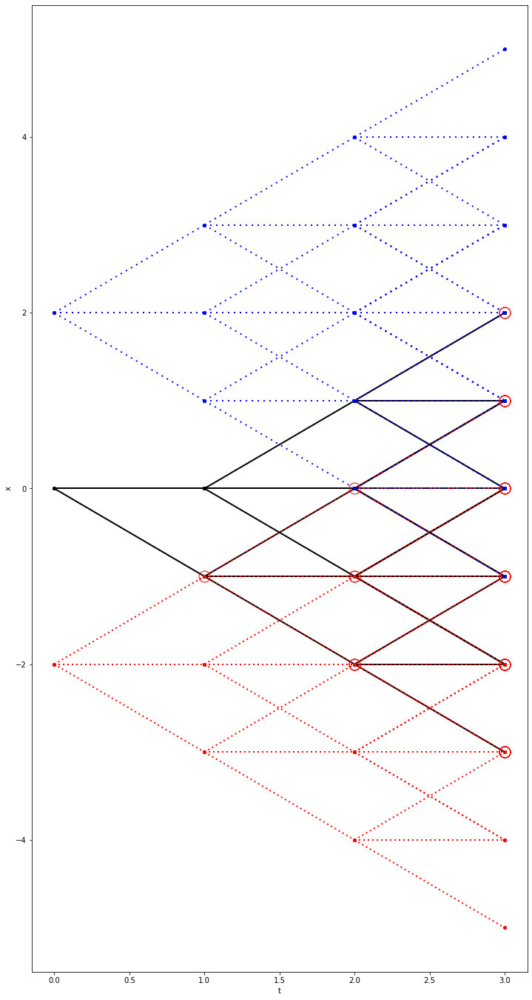

In [ ]:
PolicyTree(np.array([1, 2, 3]), np.array([-1, 0, 1]), 3).plot_tree(d=2)

## BoundedPolicyTree and BoundedDistancePreservingPolicyTree
Instances returned by `BoundedPolicyTree` and `BoundedDistancePreservingPolicyTree` are examples of `PolicyTree` with probabilities and `updates` modified. We'll use the last one for the two phases.

In [ ]:
def BoundedPolicyTree(observation_space, action_space, tree_depth, boundary):
  """
  One of the assumptions: actions {-1,0,1}

  BoundedPolicyTree function is there to initialize differently PolicyTree (change some probabilities)

  The depth t is limited by T or tree_depth. (See PolicyTree class for more information about
  the nodes and the links).

  This function adds constraints on the probabilities where the agent cannot go further than M
  steps away from the original/initial position (the sum of all actions taken must lie between -M
  and M). To do so, the probabilities of choosing actions going away from the original position become 0.
  We distribute the probability of going away to the probabilities of going towards original position and
  to the probabilities of not moving in one time step such that the sum stays at 1.

  Remark :
  - we still store the whole tree.
  - we do not need to change the probabilities for the leaf nodes of the tree
  so the range(M,tree_depth+1) can also become range(M,tree_depth). In the examples,
  the probabilities for leaf nodes are changed

  ---------------------------------------------------------------------------------------------------------------------------------------
  Example of a tree with branching factor 3 due to 3 actions -1, 0 and 1 and boundary=M=2.

    test = BoundedPolicyTree(np.array([1,2,3]),np.array([-1,0,1]),10, 2) # 13 is already taking some time
    print(len(test.tree[3])) # get the number of elements in the depth 3

    # Check the probabilities of going further away
    print(test.pi_a_obs(np.array([[1,-1]*4+[-1,-1]]) ))
    print(test.pi_a_obs(np.array([[1,-1]*4+[1,1]]) ))
    # 27
    # [0.  0.5 0.5]
    # [0.5 0.5 0. ]

    # bottom right of the tree (already outside the boundary..)
    print(test.pi_a_obs(np.array([[1]*10]) ))  # same number of iterations as print(test.pi_a_obs(np.array([[-1]*10]) )) (the bottom left of the tree)

    # output : [0.5 0.5 0. ] because we want with proba 0 of not going further away.

  Example for M=1:
    print(test.pi_a_obs(np.array([[1,-1]*4 + [1]]) ))  # go right first then go left. Repeat that then go right
    print(test.pi_a_obs(np.array([[-1,1]*4 + [-1]]) ))  # same idea but inverted

   # [0.5 0.5 0. ]  # go left or stay
   # [0.  0.5 0.5]  # go right or stay
  """
  assert np.array_equal(action_space, np.array([-1, 0, 1])), "action space should be np.array([-1,0,1]) for Bounded Policy Tree"
  M = boundary
  assert M >= 1, "M should be >= 1"

  # Recall tree_depth is the time limit
  policyTreeDataStructure = PolicyTree(observation_space, action_space, tree_depth)

  # Go through the tree : policyTreeDataStructure.tree and modify probabilities for boundaries

  # Start with depth M (probabilities for depth < M are left untouched)
  # Slow
  for time in range(M, tree_depth+1):  # for each depth starting by M
    for node in policyTreeDataStructure.get_row_tree(time):
      # compute relative position
      relative_pos = np.sum(node.observation)
      p = node.probability_vector_over_actions
      # Need to change this part if want generalization for any trees
      if relative_pos <= -M:  # change the probability of going left to 0
        node.updates = [False, True, True]  # can only modify the proba for the two last actions
        node.probability_vector_over_actions = np.array([0, p[1]+p[0]/2, p[2]+p[0]/2])
      elif relative_pos >= M:  # change the probability of going right to 0
        node.updates = [True, True, False]  # can only modify the proba for the two first actions
        node.probability_vector_over_actions = np.array([p[0]+p[2]/2, p[1]+p[2]/2, 0])
      # else, do not change anything

  return policyTreeDataStructure

Distance preserving/with "second phase"

In [ ]:
def BoundedDistancePreservingPolicyTree(observation_space, action_space, tree_depth, boundary, K):  # Bounded in time and space
  """
  Two of the assumptions: actions {-1,0,1}, 1<= M <= K. M is the boundary and K is the number of time steps
  before going back to original position

  BoundedDistancePreservingPolicyTree function is there to initialize differently PolicyTree (See BoundedPolicyTree function and PolicyTree class for more informations)

  The depth t is limited by T or tree_depth. (See BoundedPolicyTree function and PolicyTree class
  for more information about the nodes and the links).

  This function, similarly to BoundedPolicyTree function has constraints on probabilities for the boundaries
  but this function also has constraints after time step K. We want the agent to go back to the original position
  so we can repeat the process multiple times.

  We still store the whole tree.
  ---------------------------------------------------------------------------------------------------------------------------------------
  Example of a tree with branching factor 3 due to 3 actions -1, 0 and 1 and boundary=M=1.

      test=BoundedDistancePreservingPolicyTree(np.array([1,2,3]),np.array([-1,0,1]),2, 1, 1) # last param is K

      print(test.pi_a_obs(np.array([[]]) ))

      print(test.pi_a_obs(np.array([[0]]) ))
      print(test.pi_a_obs(np.array([[-1]]) ))
      print(test.pi_a_obs(np.array([[1]]) ))
  """
  assert np.array_equal(action_space, np.array([-1, 0, 1])), "action space should be np.array([-1,0,1]) for Bounded Distance Preserving Policy Tree"
  M = boundary
  assert K >= M >= 1, "M should be >= 1 and M should be <= K"
  assert K <= tree_depth, "K should not be higher than the tree_depth"
  assert tree_depth == (K+M), "tree_depth should be the same as (K+M), otherwise, useless actions"

  # Recall tree_depth is the time limit
  policyTreeDataStructure = PolicyTree(observation_space, action_space, tree_depth)

  # Slow
  # Start with depth M (probabilities for depth < M are left untouched)
  # ---------------------------------------------------------------------------
  # Change the probabilities for the boundaries
  # Go through the tree : policyTreeDataStructure.tree and modify probabilities for boundaries
  # ---------------------------------------------------------------------------
  for time in range(M, K):  # it was tree_depth+1 in BoundedPolicyTree
    for node in policyTreeDataStructure.get_row_tree(time):
      # compute relative position
      relative_pos = np.sum(node.observation)
      p = node.probability_vector_over_actions
      # Need to change this part if want generalization for any trees
      if relative_pos <= -M:  # change the probability of going left to 0
        node.updates = [False, True, True]  # can only modify the proba for the two last actions
        node.probability_vector_over_actions = np.array([0, p[1]+p[0]/2, p[2]+p[0]/2])
      elif relative_pos >= M:  # change the probability of going right to 0
        node.updates = [True, True, False]  # can only modify the proba for the two first actions
        node.probability_vector_over_actions = np.array([p[0]+p[2]/2, p[1]+p[2]/2, 0])

  # ---------------------------------------------------------------------------
  # Change the probabilities after K steps to go back to original position
  # ---------------------------------------------------------------------------
  for time in range(K, tree_depth+1):  # no need to tree_depth+1, we can have tree_depth
    for node in policyTreeDataStructure.get_row_tree(time):
      # compute relative position
      relative_pos = np.sum(node.observation)
      p = node.probability_vector_over_actions
      # Need to change this part if want generalization for any trees
      # Maybe try to avoid if statements?
      if relative_pos < 0:  # go to the right
        node.updates = [False, False, False]  # cannot modify probabilities in the update policy
        node.probability_vector_over_actions = np.array([0, 0, 1])
      elif relative_pos > 0:  # go to the left
        node.updates = [False, False, False]  # cannot modify probabilities in the update policy
        node.probability_vector_over_actions = np.array([1, 0, 0])
      else:  # else go to mid because relative_pos is 0
        node.updates = [False, False, False]  # cannot modify probabilities in the update policy
        node.probability_vector_over_actions = np.array([0, 1, 0])

  return policyTreeDataStructure

## BoundedDistancePreservingPolicyTreeNoPhases : without two phases

 Bounded on the line by $floor(N/2)$ where $N$ is the tree-depth or the length of the "string"

In [ ]:
def BoundedDistancePreservingPolicyTreeNoPhases(observation_space, action_space, tree_depth):  # Bounded in time and space
  """
  If enough time to go anywhere then come back to original position in the time left, then we can do it.

  np.abs(relative_pos) == N - time defines a triangular shape bounding the movements and we can still move inside the triangular shape.

  BoundedDistancePreservingPolicyTree blocked movements inside the triangle in the second phase..
  """
  N = tree_depth
  assert np.array_equal(action_space, np.array([-1, 0, 1])), "action space should be np.array([-1,0,1]) for Bounded Distance Preserving Policy Tree without two phases"
  assert tree_depth >= 1, "tree_depth should be >= 1"

  # Recall tree_depth is the time limit
  policyTreeDataStructure = PolicyTree(observation_space, action_space, tree_depth)

  # ---------------------------------------------------------------------------
  # Change the probabilities for the boundaries
  # Go through the tree : policyTreeDataStructure.tree and modify probabilities for boundaries
  # ---------------------------------------------------------------------------
  for time in range(N):  # it was tree_depth+1 in BoundedPolicyTree
    for node in policyTreeDataStructure.get_row_tree(time):
      # compute relative position
      relative_pos = np.sum(node.observation)

      # exactly on the "border" or max one step left, need to go back to original position with probability 1, "N - time : time left"
      if (np.abs(relative_pos) == N - time) or (N - time <= 1):  # np.abs(relative_pos) == N - time is a triangle
        node.updates = [False, False, False]
        z  = np.zeros(node.probability_vector_over_actions.shape)
        z[2 - (1 + int(np.sign(relative_pos)))] = 1
        node.probability_vector_over_actions = z
      else:  # not on the border AND strictly more than 1 time step left
        if (np.abs(relative_pos) + 1 == N - time):  # if one more step, we're on the "border"
          if relative_pos < 0:  # at the left
            node.updates = [False, True, True]
            node.probability_vector_over_actions = np.array([0, 1/2, 1/2])
          else:
            node.updates = [True, True, False]
            node.probability_vector_over_actions = np.array([1/2, 1/2, 0])
        # otherwise : default random choices.

  return policyTreeDataStructure

In [ ]:
PolicyTree(np.array([]), np.array([-1, 0, 1]), 1).print_tree()

row [<__main__.NodePolicyTree object at 0x7ff27a73c850>]
[] [0.33333333 0.33333333 0.33333333]
row [<__main__.NodePolicyTree object at 0x7ff27a73c790>, <__main__.NodePolicyTree object at 0x7ff27a73c1d0>, <__main__.NodePolicyTree object at 0x7ff27a73c590>]
[[-1.]] [0.33333333 0.33333333 0.33333333]
[[0.]] [0.33333333 0.33333333 0.33333333]
[[1.]] [0.33333333 0.33333333 0.33333333]


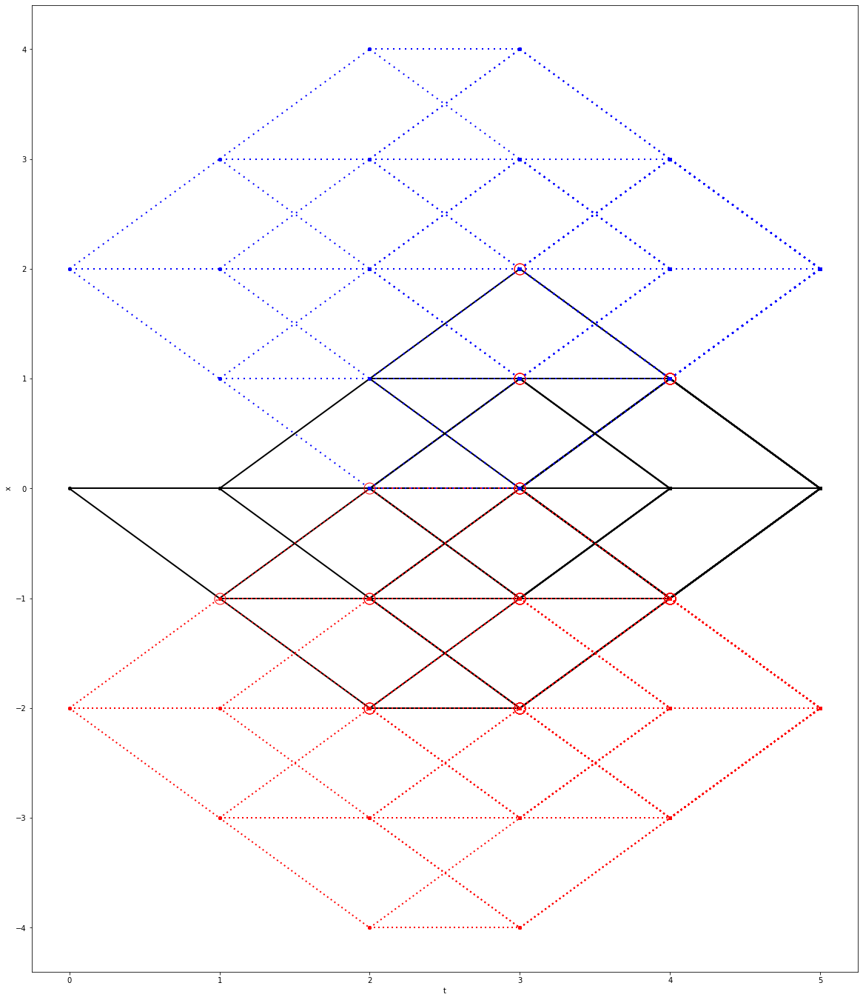

In [ ]:
BoundedDistancePreservingPolicyTreeNoPhases(np.array([]), np.array([-1, 0, 1]), 5).plot_tree(d=2)

# Environment and Agent

In [ ]:
class RDVOnLineEnvironmentV1:
  def __init__(self, initial_distance: int, policyDataStructure: Policy):
    """
    Initialize the agents on the line and the environment.
    - initial_distance : d=2 for instance where the two agents are at distance 2 apart at time t=0 but do not know if left/right.
    - policyDataStructure

    Example of policyDataStructure:
      - BoundedDistancePreservingPolicyTree(np.array([]),self.single_agent_action_space, K+M, M, K  ) # we do not use observation space..

    Informations:
    - (single agent) action space (state space is not defined because it's defined by the transitions) : 1D (if modify this, need to be sure we need the appropriate policyDataStructure)
        example : np.array([-1,0, 1]) # left and right

    - policyDataStructure :  need actions {-1,0,1}

    to match what we want.
    """
    self.d = initial_distance
    # ------------------------------------------------------------------------------------------------------------------------------------
    # should stay 1D
    assert policyDataStructure.action_space.ndim == 1, "policyDataStructure.action_space should a 1 dimensional numpy array"

    # Imagine it like the cross product of two sets, it is because we have two agents
    self.action_space = (policyDataStructure.action_space, policyDataStructure.action_space)

    # ------------------------------------------------------------------------------------------------------------------------------------
    # Initialize agents (agent 2 is either at -d or d and agent 1 is always at 0 at time t=0)
    # An agent only observe his position relative to his initial position
    self.agents = [Agent(initial_distance, policyDataStructure), Agent(initial_distance, policyDataStructure)]  # same policy for both (same instance too)
    # cannot do [el]*2 because otherwise points towards same structure

    # Absolute position on the line not known from agents
    self.init_agents_positions = [0, np.random.choice([self.d, -self.d], p=[1/2, 1/2])]  # only changes when resets
    # is only used with get_pos() to check if the two agents meet or not.

  def reset(self):
    """
    Resets environment and returns the initial observations (list of observations)
    """
    self.agents[0].reset_traj()
    self.agents[1].reset_traj()

    self.init_agents_positions = [0, np.random.choice([self.d, -self.d], p=[1/2, 1/2])]   # !!

    observations = [self.agents[0].get_traj(), self.agents[1].get_traj()]   # get_traj() gives the relative trajectory on the line
    return observations  # initial observation.

  @staticmethod
  def met(init_pos1, parent_relative_pos1, last_action1, init_pos2, parent_relative_pos2, last_action2):
    # also verify if meet in non integer times (between parents and nodes) ! verify this by checking if one is above (absolute position) the other when previously opposite.
    parent_abs_pos1 = init_pos1 + parent_relative_pos1
    parent_abs_pos2 = init_pos2 + parent_relative_pos2  # the np.sum(parent_relative_traj2) gives the relative position of agent 2 relative to initial position (before taking the last action)
    abs_pos1 = parent_abs_pos1 + last_action1
    abs_pos2 = parent_abs_pos2 + last_action2
    return (np.sign(parent_abs_pos1-parent_abs_pos2) != np.sign(abs_pos1 - abs_pos2))  # (abs_pos1 == abs_pos2) is included in it because sign(0)=0

  def step(self, actions: list):
    """
    Take one step per agent. The relative trajectory that the agent knows is not updated here but outside.
    However, his real trajectory on the line is used and "the observation" of his relative trajectory is returned.

    The position in the list of actions is for a particular agent

    Returns : list of observations, list of rewards, list of done, info (dict)
    """
    done = False

    traj1 = np.copy(self.agents[0].get_traj())
    traj2 = np.copy(self.agents[1].get_traj())

    # concatenate horizontally new actions
    traj1 = np.hstack((traj1, np.array([[actions[0]]])))
    traj2 = np.hstack((traj2, np.array([[actions[1]]])))

    observations = [traj1, traj2]

    info = {"delta_time_intersection":  float("inf")}  # by default no intersection of actions. Never use this info in the middle of the episode !

    # Done and reward function..
    if RDVOnLineEnvironmentV1.met(self.init_agents_positions[0], self.agents[0].get_relative_pos(), actions[0], self.init_agents_positions[1], self.agents[1].get_relative_pos(), actions[1]):
      done = True
      reward = -1  # 1
      # Info, this computation only work if there's meeting
      info = {"delta_time_intersection":  (self.init_agents_positions[0] + self.agents[0].get_relative_pos() - self.init_agents_positions[1] - self.agents[1].get_relative_pos())/(actions[1] - actions[0])}  # intersection between the two actions. Should only be used at the end of episode
    else:
      reward = -1

    # same feedback reward for both agents and same dones
    return observations, [reward, reward], [done, done], info

In [ ]:
# the agent only has a policy and acts depending on observations
class Agent:
  def __init__(self, init_distance: int, policyDataStructure):
    self.d = init_distance
    self.policyDataStructure = policyDataStructure
    self.action_space = policyDataStructure.action_space  # action space for single agent

    # initial trajectory (2D) (row vector)
    self.traj = np.array([[]])  # trajectory relative to his initial position
    # "the matrix grows in size" because we horizontally stack new actions..
    # we do this because the tree is defined like that.

    # also save the relative position
    self.relative_pos = 0

  def get_time(self, observation):
    # observation should be a 2d matrix (row vector)
    return observation.size

  # Behavior policy, policy used in the learning
  def policy(self, observation):  # stochastic policy, gives the probability of an action given the state/observation
    """
    Returns the probability vector over actions given the observation (trajectory)
    """
    assert observation.shape[0] == 1 and observation.ndim == 2, "observation is not 2D and not of shape (1,else)"
    # the policyDataStructure takes care of boundary M..
    return self.policyDataStructure.pi_a_obs(observation)  # proba vector over action given observation

  def sample_action(self, p):
    return np.random.choice(self.action_space, p=p)  # return action

  def reset_traj(self):
     self.traj = np.array([[]])  # trajectory relative to his initial position
     self.relative_pos = 0

  def get_traj(self):
    return self.traj

  def get_relative_pos(self):
    return self.relative_pos

# Computing the exact expected meeting time






In [ ]:
def expected_meeting_time_helper(prob_traj1, node_1, relative_pos1, prob_traj2, node_2, relative_pos2, init_pos2, K, M, output: dict):
  """
  Only work for "distance-preserving" strategies with actions -1 0 1 and on policyTrees

  prob_traj1, prob_traj2 : probability of the trajectory until node_1, node_2 respectively.
  node_1, node_2 : NodePolicyTree
  output is a dictionary. Need to have this structure below:
   {"E_1_given_init_pos2": some value, "E_2_given_init_pos2": some value}
  """
  list_actions = np.arange(0, len(node_1.children))
  action_space = np.array([-1, 0, 1])

  # given relative trajectories of both agents and the initial position of agent2
  time = node_1.observation.size
  if time > 0:
    last_action1 = node_1.observation[0, -1]
    last_action2 = node_2.observation[0, -1]
  else:
    last_action1 = 0
    last_action2 = 0

  parent_relative_pos1 = relative_pos1 - last_action1
  parent_relative_pos2 = relative_pos2 - last_action2

  # if rdv
  if time > 0 and RDVOnLineEnvironmentV1.met(0, parent_relative_pos1, last_action1, init_pos2, parent_relative_pos2, last_action2):  # also verify if meet in non integer times !
    parent_abs_pos1 = parent_relative_pos1  # initial position of agent 1 is 0
    parent_abs_pos2 = init_pos2 + parent_relative_pos2

    output["E_1_given_init_pos2"] += prob_traj1*prob_traj2*(time-1 + (parent_abs_pos1 - parent_abs_pos2)/(last_action2 - last_action1))  # both last actions are different !
    # (abs_pos1 - abs_pos2)/(last_action2 - last_action1) comes from intersection of lines
    # (last_action2 - last_action1) is never 0 and this computation only work if there's meeting.

  # if no rdv or time = 0, call the function again if time < K
  else:
    # if time < K, call with children
    if time < K:
      # prob_action_given_traj1 : pr_a_traj1, prob_action_given_traj2 : pr_a_traj2
      [expected_meeting_time_helper(prob_traj1*pr_a_traj1, node_1.children[idx_child1], relative_pos1 + action_space[idx_child1], prob_traj2*pr_a_traj2, node_2.children[idx_child2], relative_pos2  + action_space[idx_child2], init_pos2, K, M, output)
       for (pr_a_traj1, idx_child1) in zip(node_1.probability_vector_over_actions, list_actions) if pr_a_traj1 != 0
       for (pr_a_traj2, idx_child2) in zip(node_2.probability_vector_over_actions, list_actions) if pr_a_traj2 != 0]
    else:
      # means meet after time K+M
      output["E_1_given_init_pos2"] += prob_traj1*prob_traj2*(K+M)  # without this part, it's E_1_prime
      output["E_2_given_init_pos2"] += prob_traj1*prob_traj2
      # for intuition : that part looks like prob(...) * (E[T]+K+M) and prob(...)=E_2 is used to keep the proba
      # to throw it on the left of : E[T] = ... + E_2*(E[T]+K+M) <=> E[T]*(1-E_2) = ... + E_2*(K+M) = E_1

def expected_meeting_time(policy, K, M, returnE1prime=False):
  """
  Return expected meeting time of a policy. Computationally expensive.

  E[T]=E_1+E_2*E[T] (See article Improved Bounds for Symmetric Rdv on Line for some explanation, the idea is similar but we go through a tree)
  E[T]=E_1/(1-E_2)

  E_1 is not a probability while E_2 is a probability. E1prime is an expectation.

  If returnE1prime=True, return also E1prime (E_1=E1prime + E_2*(K+M))

  where:
  E[T] = (expected_meeting_time for time t <= K) + E_2*(E[T]+K+M)
  <=>
  E[T]*(1-E_2) = (expected_meeting_time for time t <= K) + E_2*(K+M) = E_1
  # two different initial pos of agent 2
  E[T]= 1/2*(E_1(-2) + E_2(-2)*E[T]) + 1/2*(E_1(2) + E_2(2)*E[T])

  E_1=1/2*E_1(-2) +1/2*E_1(2)
  E_2=1/2*E_2(-2) +1/2*E_2(2)
  """
  output_Minus2 = {"E_1_given_init_pos2": 0, "E_2_given_init_pos2": 0}
  output_Plus2 = {"E_1_given_init_pos2": 0, "E_2_given_init_pos2": 0}

  tree1 = policy
  tree2 = policy  # copy.deepcopy(policy)
  # agent 2 at pos -2
  expected_meeting_time_helper(1, tree1.root, 0, 1, tree2.root, 0, -2, K, M, output_Minus2)
  expected_meeting_time_helper(1, tree1.root, 0, 1, tree2.root, 0, 2, K, M, output_Plus2)
  # combine the expectation with init pos -2 and 2
  E_1 = 1/2*output_Minus2["E_1_given_init_pos2"] + 1/2*output_Plus2["E_1_given_init_pos2"]
  E_2 = 1/2*output_Minus2["E_2_given_init_pos2"] + 1/2*output_Plus2["E_2_given_init_pos2"]
  E = E_1/(1-E_2)

  E1prime = E_1-E_2*(K+M)  # because E_1=E1prime + E_2*(K+M)
  if returnE1prime:
    return E, E1prime
  else:
    return E

In [ ]:
K = 1
M = 1
policyTest = BoundedDistancePreservingPolicyTree(np.array([]), np.array([-1, 0, 1]), K+M, M, K)
E = expected_meeting_time(policyTest, K, M)
print(f"Expected meeting time for policyTest : {E}")
# for pr in policyTest.root.probability_vector_over_actions:
#   print(pr, pr.shape)

Expected meeting time for policyTest : 17.00000000000003


We obtain
```
Expected meeting time for policyTest : 17.00000000000003
```
That is the same as in the simulation

In [ ]:
test = BoundedDistancePreservingPolicyTreeNoPhases(np.array([]), np.array([-1, 0, 1]), 4)
expected_meeting_time(test, 4, 0)

13.400000000000091

We obtain
```
13.400000000000091
```


# Simulation functions with and without update of policy

The code can be improved to be more efficient (for instance use node.probability_vector_over_actions instead
                                               of searching for the node in the tree from the observation.. )

The functions can be used for the Improved Bounds Article by setting the length of the generators in K and M=0 (same for the "no two phases" strategies).

Only the sum : K+M is used in simulate functions to stop a sub-trajectory (K+M).

The `expected_meeting_time` only gives the exact expected meeting time for "distance preserving" strategies
(in "" because the number of actions can be different compared to the Improved Bounds Article)

For us, "distance preserving" means : we suppose that both agents came back at the same initial distance apart between sub-trajectories or they meet within a sub-trajectory.

We have to be careful to reset the trajectory each time we finish $K+M$ steps. Even if both Agents come back at their original position after `tmpTime`$=K+m \leq K+M$, we cannot reset after $K+m$ steps because an agent do not know the trajectory of the other agent.
```python
 if (tmpTime >= K) and np.sum(agent1.traj)==0 and np.sum(agent2.traj)==0:
```
is not possible, we replace it with :
```python
 if (tmpTime >= K + M ):
```

## Simulation without update


In [ ]:
def start_episode_no_update(env, policy, K, M, dictionary_for_iteration, episode, verbose=False):
  # estimated_meeting_time is in dictionary_for_iteration["estimated_meeting_time"]
  if verbose: print(f"-------------------------------Episode \t {episode+1} \t started -------------------------------")

  agent1 = env.agents[0]
  agent2 = env.agents[1]

  # To keep track of the relative position, incremental sum
  relative_pos1 = 0
  relative_pos2 = 0

  # reset
  episode_reward = 0  # init reward for the episode
  time = 0
  observations = env.reset()
  dones = [False, False]

  tmpTime = 0  # for "nMarkovian"
  while (not(dones[0])):  # for time_step in range(10)
    old_observations = np.copy(observations)

    # stochastic policy
    p1, p2 = [agent1.policy(old_observations[0]), agent2.policy(old_observations[1])]

    if verbose:
      print(f"\t Agent 0: p1: \t {p1} ")
      print(f"\t Agent 1 : p2: \t {p2}")

    actions = [agent1.sample_action(p1), agent2.sample_action(p2)]  # sample using the probability vectors
    observations, rewards, dones, info = env.step(actions)
    # save in the agents the obversations : IMPORTANT
    agent1.traj, agent2.traj = observations
    relative_pos1 += actions[0]
    relative_pos2 += actions[1]
    agent1.relative_pos, agent2.relative_pos = relative_pos1, relative_pos2

    if verbose:
      print(f"\t Agent 0: transition (with relative positions): \t {old_observations[0]} --  action : \t{actions[0]} \t----->  {observations[0]}.")
      print(f"\t Agent 1 : transition (with relative positions): \t {old_observations[1]} --  action : \t{actions[1]} \t----->  {observations[1]}.")

    episode_reward += rewards[0]
    time += 1
    tmpTime += 1  # for "nMarkovian", repeat the pi/strategy

    if dones[0]:  # same done for both
      observations = env.reset()
      # meeting_time = time
      meeting_time = (time - 1) + info["delta_time_intersection"]  # previous time + time between previous position and meeting

      alpha_episode = 1/(episode+1)
      # estimated_meeting_time = estimated_meeting_time + 1/(episode+1)*(meeting_time  - estimated_meeting_time) # Robbins Monro algorithm
      if episode == 0:
        dictionary_for_iteration["estimated_meeting_time"] = meeting_time
      else:
        dictionary_for_iteration["estimated_meeting_time"] = (1-alpha_episode)*dictionary_for_iteration["estimated_meeting_time"] + alpha_episode*meeting_time

      if episode % 10000 == 0:
        print(f"Meeting_time {meeting_time} for episode: {episode}")
        print(f"Estimated meeting time: {dictionary_for_iteration['estimated_meeting_time']} for episode: {episode}")

    # if both came back at original position (after K steps otherwise they would be stuck at their original position)
    elif (tmpTime >= K + M):
      # reset trajectories
      if verbose: print("reset")
      tmpTime = 0  # important
      agent1.reset_traj()
      agent2.reset_traj()
      relative_pos1 = 0
      relative_pos2 = 0

      observations = [agent1.get_traj(), agent2.get_traj()]
      # cannot use env.reset() because it would change the initial position of agent 2
  return episode_reward, meeting_time, dictionary_for_iteration["estimated_meeting_time"]

In [ ]:
def simulate_no_update_helper(policy, d=2, K=1, M=1, n_episodes=int(1e6), verbose=False):
  """
  Always print/show the estimated meeting time for some episodes even if verbose=False

  d : initial distance between the two agents (in absolute value)
  K : number of steps for Phase 1
  M : boundary and number of steps for Phase 2
  n_episodes : number of episodes

  verbose : if True, shows informations about what agent takes what action, the transitions and the
  probabilities.

  Return:
    episodes_rewards : list
    meeting_times : list
    estimated_meeting_times : list

  The code can be improved to be more efficient (for instance by using node.probability_vector_over_actions instead
                                               of searching for the node in the tree from the observation.. )
  """
  env = RDVOnLineEnvironmentV1(d, policy)  # (self, initial_distance : int, policyDataStructure : Policy)

  dictionary_for_iteration = {"estimated_meeting_time": 0}

  # episodes_rewards, meeting_times, estimated_meeting_times
  return zip(*[start_episode_no_update(env, policy, K, M, dictionary_for_iteration, episode, verbose) for episode in range(n_episodes)])

#### Simulate without update

In [ ]:
def simulate_no_update(K, M, n_episodes=10001):
  epsilon = 0

  policyTest = BoundedDistancePreservingPolicyTree(np.array([]), np.array([-1, 0, 1]), K+M, M, K)

  initial_expected_meeting_time = expected_meeting_time(policyTest, K, M)
  print(f"expected meeting time of the initial policy: {initial_expected_meeting_time}")

  output = simulate_no_update_helper(policyTest, K=K, M=M, n_episodes=n_episodes)
  episodes_rewards, meeting_times, estimated_expected_meeting_times = output  # unpack

  # plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes)
  return policyTest, (initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes)

In [ ]:
def simulate_no_update_and_plot(K, M, n_episodes=10001):
  # with plot !
  policyTest, params_plot = simulate_no_update(K, M, n_episodes=n_episodes)
  initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes = params_plot  # unpack
  plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon=epsilon, n_episodes=n_episodes)
  return policyTest, params_plot

## Simulation with policy update

In [ ]:
def start_episode_basic_update(env, policy, K, M, dictionary_for_iteration, episode, verbose=False, compute_expected_meeting_time=False, method="reinforcing_last_sub_trajs"):
  # Need to take care of the initial epsilon decreasing !!
  # estimated_meeting_time is in dictionary_for_iteration["estimated_meeting_time"]
  # offpolicy_random_actions_epsilon is dictionary_for_iteration["offpolicy_random_actions_epsilon"]
  if verbose: print(f"-------------------------------Episode \t {episode+1} \t started -------------------------------")
  single_agent_action_space = policy.action_space
  action_indexes = np.arange(len(single_agent_action_space))

  agent1 = env.agents[0]
  agent2 = env.agents[1]

  # reset
  episode_reward = 0  # init reward for the episode
  time = 0
  observations = env.reset()
  dones = [False, False]

  # To keep track of which current node for the agents. Due to that, no need to even go through the tree to search for the observation..
  current_node1 = policy.root
  current_node2 = policy.root
  # Keep track of relative positions to avoid computing  the sum each time. Incremental sum.
  relative_pos1 = 0
  relative_pos2 = 0

  # Lists to save the "sub-trajectories" for an episode for each agent.
  trajectories1 = []
  trajectories2 = []
  # Reset nbA or not ? here we do not reset nbA

  # Decrease exploration rate
  # https://stackoverflow.com/questions/53198503/epsilon-and-learning-rate-decay-in-epsilon-greedy-q-learning we do not use this..
  dictionary_for_iteration["offpolicy_random_actions_epsilon"] /= 2  # decrease the rate
  # offpolicy_random_actions_epsilon is dictionary_for_iteration["offpolicy_random_actions_epsilon"]

  # This below is only for reading, otherwise we have to use the dictionary above..
  offpolicy_random_actions_epsilon = dictionary_for_iteration["offpolicy_random_actions_epsilon"]

  tmpTime = 0  # for "nMarkovian"
  while (not(dones[0])):  # for time_step in range(10)
      old_observations = np.copy(observations)

      # stochastic policy
      # p1, p2=[agent1.policy(old_observations[0]), agent2.policy(old_observations[1])]
      p1, p2 = current_node1.probability_vector_over_actions, current_node2.probability_vector_over_actions

      # -----------------------------------------------------------------------------------
      # off-policy to increase exploration if convergence is too fast.. towards a suboptimal strategy
      # a bit like epsilon greedy but not really epsilon greedy because no greedy actions
      # change probabilities that we can update to uniform between them
      do_random_action = (random.uniform(0, 1) <= offpolicy_random_actions_epsilon)
      if (np.sum(current_node1.updates) > 0) and (np.sum(current_node2.updates) > 0):
        p1 = (1-do_random_action)*p1 + do_random_action/np.sum(current_node1.updates)*np.array(current_node1.updates).reshape(p1.shape)
        p2 = (1-do_random_action)*p2 + do_random_action/np.sum(current_node2.updates)*np.array(current_node2.updates).reshape(p2.shape)
      # we decrease the rate after each episode !
      # -----------------------------------------------------------------------------------

      if verbose:
        print(f"\t Agent 0: p1: \t {p1} ")
        print(f"\t Agent 1 : p2: \t {p2}")

      # Instead of sampling directly the actions using probability vectors, we sample the indexes of the actions
      idxActions = [np.random.choice(action_indexes, p=p1), np.random.choice(action_indexes, p=p2)]
      actions = [single_agent_action_space[idxActions[0]], single_agent_action_space[idxActions[1]]]

      observations, rewards, dones, info = env.step(actions)  # info : used to get the time between before the action and meeting if meeting happens

      # state, action, reward
      trajectories1 += [(current_node1, actions[0], rewards[0])]
      trajectories2 += [(current_node2, actions[1], rewards[1])]

      # update current nodes
      current_node1, current_node2 = [current_node1.children[idxActions[0]], current_node2.children[idxActions[1]]]

      # save in the agents the observations : IMPORTANT
      agent1.traj, agent2.traj = observations
      relative_pos1 += actions[0]
      relative_pos2 += actions[1]
      agent1.relative_pos, agent2.relative_pos = relative_pos1, relative_pos2

      # update the number of times took action from node
      current_node1.parent.increment_nbA(idxActions[0])
      current_node2.parent.increment_nbA(idxActions[1])

      if verbose:
        print(f"\t Agent 0: transition (with relative positions): \t {old_observations[0]} --  action : \t{actions[0]} \t----->  {observations[0]}.")
        print(f"\t Agent 1 : transition (with relative positions): \t {old_observations[1]} --  action : \t{actions[1]} \t----->  {observations[1]}.")

      episode_reward += rewards[0]
      time += 1
      tmpTime += 1  # for "nMarkovian", repeat the pi/strategy

      if dones[0]:  # same done for both
        # Update policy
        policy.update_policy(K, M, trajectories1, trajectories2, method=method)  # tmpTime is the time within the last "K+M"

        observations = env.reset()
        meeting_time = (time - 1) + info["delta_time_intersection"]  # previous time + time between previous position and meeting

        # alpha_episode = 1/(episode+1) # not decreasing anymore because we modify each time the policy..
        alpha = 1e-3  # impact of past is more important
        # estimated_meeting_time = estimated_meeting_time + 1/(episode+1)*(meeting_time  - estimated_meeting_time) # Robbins Monro algorithm

        # Unbiased constant step size trick to remove initial bias for exponential weighted moving average in Chap 2 of Sutton's book, Intro to RL
        dictionary_for_iteration["bar_o_n"] += alpha*(1-dictionary_for_iteration["bar_o_n"])   # need a better name
        beta_episode = alpha/dictionary_for_iteration["bar_o_n"]
        dictionary_for_iteration["estimated_meeting_time"] = (1-beta_episode)*dictionary_for_iteration["estimated_meeting_time"] + beta_episode*meeting_time  # exponential recency-weighted moving average with trick from Sutton

        if episode % 10000 == 0:
          print(f"Meeting_time {meeting_time} for episode: {episode}")
          print(f"Estimated meeting time: {dictionary_for_iteration['estimated_meeting_time']} for episode: {episode}")  # https://stackoverflow.com/questions/53449308/why-dont-f-strings-play-nicely-with-dictionaries
          print(f"Computed expected meeting time (not tractable): {expected_meeting_time(policy, K, M)}")

      # if both came back at original position (after K steps otherwise they would be stuck at their original position)
      elif (tmpTime >= K + M):
        # reset trajectories
        if verbose: print("reset")
        tmpTime = 0  # important
        # Save trajectories
        current_node1 = policy.root
        current_node2 = policy.root
        relative_pos1 = 0
        relative_pos2 = 0

        agent1.reset_traj()
        agent2.reset_traj()
        observations = [agent1.get_traj(), agent2.get_traj()]
        # cannot use env.reset() because it would change the initial position of agent 2
  if compute_expected_meeting_time:
    return episode_reward, meeting_time, dictionary_for_iteration["estimated_meeting_time"], expected_meeting_time(policy, K, M)
  else:
    return episode_reward, meeting_time, dictionary_for_iteration["estimated_meeting_time"]

In [ ]:
def simulate_basic_update_helper(policy, d=2, K=1, M=1, n_episodes=int(1e6), verbose=False, offpolicy_random_actions_epsilon=0, compute_expected_meeting_times=False, method="reinforcing_last_sub_trajs"):
  """
  Always print/show the estimated meeting time for some episodes even if verbose=False

  d : initial distance between the two agents (in absolute value)
  K : number of steps for Phase 1
  M : boundary and number of steps for Phase 2
  n_episodes : number of episodes

  verbose : if True, shows informations about what agent takes what action, the transitions and the
  probabilities.

  offpolicy_random_actions_epsilon : probability of doing random actions in the behavior policy to help exploration a bit

  Return:
    episodes_rewards : list
    meeting_times : list
    estimated_meeting_times: list
    (optional) expected_meeting_times : list

  Note : Code is similar to simulate_no_update but we also keep track of the two nodes so that we can do
      - current_node1.parent.increment_nbA(idxActions[0])
      - current_node2.parent.increment_nbA(idxActions[1])

  The code can be improved to be more efficient
  """
  env = RDVOnLineEnvironmentV1(d, policy)  # (self, initial_distance : int, policyDataStructure : Policy)

  # initial_eps = offpolicy_random_actions_epsilon  # initial "exploration" rate
  dictionary_for_iteration = {"estimated_meeting_time": 0, "bar_o_n": 0, "offpolicy_random_actions_epsilon": offpolicy_random_actions_epsilon}
  # bar_o_n from : Unbiased constant step size trick to remove initial bias for exponential weighted moving average in Chap 2 of Sutton's book, Intro to RL

  # for episode in range(n_episodes):
  if compute_expected_meeting_times:
    # episodes_rewards, meeting_times, estimated_meeting_times, expected_meeting_times
    return zip(*[start_episode_basic_update(env, policy, K, M, dictionary_for_iteration, episode, verbose, compute_expected_meeting_times, method=method) for episode in range(n_episodes)])  # https://docs.python.org/3/tutorial/controlflow.html#unpacking-argument-lists
  else:
    # episodes_rewards, meeting_times, estimated_meeting_times
    return zip(*[start_episode_basic_update(env, policy, K, M, dictionary_for_iteration, episode, verbose, method=method) for episode in range(n_episodes)])

### Simulate with update

In [ ]:
def simulate_basic_update(K, M, epsilon=0, n_episodes=10001, compute_expected_meeting_times=False, no_two_phases=False, method="reinforcing_last_sub_trajs"):
  """
  no_two_phase : if true, will use  BoundedDistancePreservingPolicyTreeNoPhases instead of  BoundedDistancePreservingPolicyTree
  Return a tuple containing : policyTest, parameters for plots (can contain expected meeting times or not)
  """
  print(f"K={K}, M={M}, epsilon={epsilon}, n_episodes={n_episodes} + version with compute_expected_meeting_times={compute_expected_meeting_times}\n")
  if no_two_phases:
    assert M == 0, "M should be 0 so that the expected meeting times are computed correctly"
    policyTest = BoundedDistancePreservingPolicyTreeNoPhases(np.array([]), np.array([-1, 0, 1]), K+M)
  else:
    policyTest = BoundedDistancePreservingPolicyTree(np.array([]), np.array([-1, 0, 1]), K+M, M, K)

  initial_expected_meeting_time = expected_meeting_time(policyTest, K, M)
  print(f"expected meeting time of the initial policy: {initial_expected_meeting_time}")

  # episodes_rewards, meeting_times, estimated_expected_meeting_times, expected_meeting_times = simulate_basic_update_helper(policyTest, K=K, M=M, offpolicy_random_actions_epsilon=epsilon, n_episodes=20001, compute_expected_meeting_times=True)
  output = simulate_basic_update_helper(policyTest, K=K, M=M, offpolicy_random_actions_epsilon=epsilon, n_episodes=n_episodes, compute_expected_meeting_times=compute_expected_meeting_times, method=method)  # compute_expected_meeting_times=True

  if not(compute_expected_meeting_times):
    episodes_rewards, meeting_times, estimated_expected_meeting_times = output  # unpack
    return policyTest, (initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes)
  else:
    episodes_rewards, meeting_times, estimated_expected_meeting_times, expected_meeting_times = output  # unpack
    return policyTest, (initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, expected_meeting_times, epsilon, n_episodes)

In [ ]:
def simulate_and_plot(K, M, epsilon=0, n_episodes=10001, compute_expected_meeting_times=False, no_two_phases=False, method="reinforcing_last_sub_trajs"):
  """
  Simulate with update + plot (with expected meeting time or not)
  """
  # with update !
  policyTest, params_plot = simulate_basic_update(K, M, epsilon=epsilon, n_episodes=n_episodes, compute_expected_meeting_times=compute_expected_meeting_times, no_two_phases=no_two_phases, method=method)
  if not(compute_expected_meeting_times):
    initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes = params_plot  # unpack
    plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon=epsilon, n_episodes=n_episodes)
  else:
    initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, expected_meeting_times, epsilon, n_episodes = params_plot  # unpack
    plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, expected_meeting_times=expected_meeting_times, epsilon=epsilon, n_episodes=n_episodes)

  return policyTest, params_plot

In [ ]:
def simulation_multiple_runs(K, M, epsilon=0, n_episodes=2501, n_runs=20, compute_expected_meeting_times=False, no_two_phases=False, method="reinforcing_last_sub_trajs"):
  policyTests, outputs = zip(*[simulate_basic_update(K, M, epsilon=epsilon, n_episodes=n_episodes, compute_expected_meeting_times=compute_expected_meeting_times, no_two_phases=no_two_phases, method=method) for _ in range(n_runs)])
  return policyTests, outputs  # outputs depends on if compute_expected_meeting_times=True or not

In [ ]:
test = (*(1, 2, 3), 4), 5
test

((1, 2, 3, 4), 5)

In [ ]:
tuple(zip((1, 2, 6), (3, 4, 7)))

((1, 3), (2, 4), (6, 7))

## Plot function to plot rewards and meeting time for each episode
```python
import matplotlib.pyplot as plt
def plot_informations(episodes_rewards: list, meeting_times: list, n_episodes=int(1e6)):
  assert len(episodes_rewards) == len(meeting_times) == n_episodes, "lengths of episodes_rewards, meeting_times not matching or not equal to the number of episodes"
  t = np.arange(20001)
  plt.subplot(1, 2, 1)
  plt.plot(t, episodes_rewards, 'r', linewidth=0.2)
  plt.subplot(1, 2, 2)
  plt.plot(t, meeting_times, 'r', linewidth=0.2)
```


### Single run



In [ ]:
def plot_informations(initial_expected_meeting_time, episodes_rewards: list, meeting_times: list, K, M, estimated_meeting_times=None, expected_meeting_times=None, epsilon=0, n_episodes=int(1e6), logplot=False, rewardsplot=False, meeting_timesplot=True, newfigure=True, subplots_n_col=1):
  assert len(episodes_rewards) == len(meeting_times) == n_episodes, "lengths of episodes_rewards, meeting_times not matching or not equal to the number of episodes"
  if isinstance(estimated_meeting_times, type(())):  # tuple
    assert len(episodes_rewards) == len(estimated_meeting_times), "lengths of estimated_meeting_times not matching episodes_rewards and meeting_times (and not equal to the number of episodes)"
    if isinstance(expected_meeting_times, type(())):  # tuple
      assert len(episodes_rewards) == len(expected_meeting_times), "lengths of expected_meeting_times not matching episodes_rewards and meeting_times (and not equal to the number of episodes)"

  t = np.arange(n_episodes)
  if newfigure:
    fig = plt.figure(figsize=(15+15*rewardsplot, 13))  # width, height

  if rewardsplot:
    plt.subplot(1, 2, 1)
    plt.plot(t, episodes_rewards, 'r', linewidth=0.2)
    plt.title(f"Rewards for each episode with K={K}, M={M} and " + r"$\epsilon$="+str(epsilon))
    plt.xlabel("episode")
    plt.ylabel("reward")

    plt.subplot(1, 2, 2)
  if meeting_timesplot:
    plt.scatter(t, meeting_times, c="r", s=15/subplots_n_col, alpha=0.3, zorder=1, label="meeting time for each episode")  # linewidth=0.2
  plt.plot(t, np.ones(t.shape)*initial_expected_meeting_time, 'g--', linewidth=2, zorder=2, label=f"expected meeting time of initial policy: {initial_expected_meeting_time}")

  ax1 = plt.gca()

  if logplot:
    # plt.title(f"Log scale (base 2) of Meeting time for each episode with K={K}, M={M} and " + r"$\epsilon$="+str(epsilon))
    plt.title(f"K={K}, M={M} and " + r"$\epsilon$="+str(epsilon))
    plt.ylabel("meeting time in log scale")
    ax1.set_yscale('log', basey=2)

    ax1.yaxis.set_minor_locator(MultipleLocator(1))  # each minor tick : 1 unit
    ax1.yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())

    # https://stackoverflow.com/questions/14530113/set-ticks-with-logarithmic-scale
    # https://matplotlib.org/stable/gallery/subplots_axes_and_figures/two_scales.html#sphx-glr-gallery-subplots-axes-and-figures-two-scales-
    # ax2 = ax1.twinx()
    # ax2.set_yticks(np.arange(1,max(meeting_times)+1,0.5))
    # ax2.set_yscale('log', basey=2)
    # ax2.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
  else:
    plt.title(f"Meeting time for each episode with K={K}, M={M} and " + r"$\epsilon$="+str(epsilon))
    plt.ylabel("meeting time")

  ax1.set_xlabel("episode")

  if isinstance(estimated_meeting_times, type(())):
    ax1.plot(t, estimated_meeting_times, 'b', zorder=3, label="estimated expected meeting time for each episode")
    if isinstance(expected_meeting_times, type(())):
      ax1.plot(t, expected_meeting_times, 'k', linewidth=1.5, zorder=4, label="expected meeting time for each episode")

  ax1.tick_params(which="major", size=10, direction="inout")
  ax1.tick_params(which="minor", size=5, direction="in")

  ax1.grid("on", which="major", linestyle="--", linewidth=1)
  # ax1.grid("on", which="minor", linestyle="--", linewidth=0.5)
  if logplot:
    ax1.legend(loc="lower right", prop={'size': 15//subplots_n_col + 0.5*(subplots_n_col-1)})  # title=fr"$K=${K}, $M=${M}, $\epsilon=${epsilon}, n_episodes={n_episodes}" combine f-strings and r-strings , fontsize="small"
  else:
    ax1.legend(loc="upper right", prop={'size': 15//subplots_n_col + 0.5*(subplots_n_col-1)})
  ax1.set_ylim(bottom=1)

In [ ]:
# plot using subplots multiple of "plot_informations"
def multiple_plots_one_run(params_plot):
  """
  Nearly the same parameters as "plot_informations" but for each simulation done. For instance, we have a list of initial expected meeting time instead of just one.

  No rewards plots
  """
  fig = plt.figure(figsize=(15, 13))  # width, height

  for idx, params_plot_tmp in enumerate(params_plot):
    # unpack
    if len(params_plot_tmp) == 8:
      initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes = params_plot_tmp

      plt.subplot(np.ceil(len(params_plot)/3), 3, idx + 1)
      plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, n_episodes=n_episodes, logplot=True, rewardsplot=False, meeting_timesplot=True, newfigure=False, subplots_n_col=3)

      fig.subplots_adjust(hspace=0.4)
      plt.tight_layout()
    elif len(params_plot_tmp) == 9:  # with expected meeting times
      initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, expected_meeting_times, epsilon, n_episodes = params_plot_tmp

      plt.subplot(np.ceil(len(params_plot)/3), 3, idx + 1)
      plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, expected_meeting_times, n_episodes=n_episodes, logplot=True, rewardsplot=False, meeting_timesplot=True, newfigure=False, subplots_n_col=3)

      fig.subplots_adjust(hspace=0.4)
      plt.tight_layout()

    else:
      raise Exception("cannot unpack an element of params_plot because not correct number of elements in tuple.")

### Multiple runs

In [ ]:
def plot_multiple_runs(n_runs, K, M, epsilon, y, logplot=False, newfigure=True, subplots_n_col=1):
  # y is a matrix of shape # episodes  x # runs

  if newfigure:
    plt.figure(figsize=(15, 15))
  plt.plot(y, zorder=1, label="_nolegend_")  #
  plt.plot(np.mean(y, axis=1), 'k--', linewidth=2, zorder=2, label="mean")  # input a matrix !. Axis 1 because average over different runs.

  plt.gca().yaxis.set_minor_locator(MultipleLocator(1))  # each minor tick : 1 unit
  plt.gca().yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())

  plt.xlabel("episode")
  plt.ylabel("meeting time")
  plt.title(fr"Estimated meeting times for ${n_runs}$ runs, K={K}, M={M}, $\epsilon=${epsilon}")
  plt.legend(loc="upper right")
  plt.savefig(f"multiple_runs/all_policies_update_except_K7M1_iter_2501_runs_{n_runs}_K{K}M{M}.png")

In [ ]:
# plot using subplots multiple of "plot_informations"
def multiple_plots_multiple_runs(params_plot):
  """
  Nearly the same parameters as "plot_informations" but for each multiple runs. For instance, we have a list of initial expected meeting time instead of just one.

  No rewards plots
  """
  fig = plt.figure(figsize=(15, 13))  # width, height

  for idx, tmp in enumerate(params_plot):
    params_plot_tmp = list(zip(*tmp))  # "put" together each run instead of having tmp of length # runs
    # unpack
    if len(params_plot_tmp) == 8:
      # initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes = params_plot_tmp
      multiple_initial_expected_meeting_time, multiple_episodes_rewards, multiple_meeting_times, multiple_K, multiple_M, multiple_estimated_expected_meeting_times, multiple_epsilon, multiple_n_episodes = params_plot_tmp
      plt.subplot(np.ceil(len(params_plot)/3), 3, idx + 1)
      plot_multiple_runs(n_runs=len(multiple_K), K=multiple_K[0], M=multiple_M[0], epsilon=multiple_epsilon[0], y=np.array(multiple_estimated_expected_meeting_times).T, logplot=False, newfigure=False, subplots_n_col=3)

      fig.subplots_adjust(hspace=0.4)
      plt.tight_layout()
    # elif len(params_plot_tmp) == 9:  # with expected meeting times
    else:
      raise Exception("cannot unpack an element of params_plot because not correct number of elements in tuple. This function also does not handle plots with expected meeting times")

# Simulation with update

We can compare with  {1,-1,-1}, {-1,1,1} strategy or  {1,-1}, {-1,1} or {1,1,-1,-1}, {1,-1,-1,1}  etc.

## One run : All at once except $K=7, M=1$

### $\epsilon=0$
Here we use $\epsilon=0$. Recall that $K \geq M$

#### Simulate with the two phases

In [ ]:
KM = np.array([[1, 1], [2, 1], [3, 1], [2, 2], [4, 1], [3, 2], [5, 1], [4, 2], [3, 3]]).T
epsilon = 0  # 0.6

save_object([simulate_basic_update(K=KM[0, j], M=KM[1, j], epsilon=epsilon, n_episodes=10001) for j in range(KM.shape[1])], "all_policies_update_except_K7M1_iter_10001.pkl")  # when we'll unpickle, we'll have a generator where looping through it gives outputs of simulations

K=1, M=1, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 9.0 for episode: 0
Estimated meeting time: 9.0 for episode: 0
Computed expected meeting time (not tractable): 14.269554725915166
Meeting_time 9.0 for episode: 10000
Estimated meeting time: 6.645544056392506 for episode: 10000
Computed expected meeting time (not tractable): 7.000146701144781
K=2, M=1, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 16.999999999999968
Meeting_time 5.0 for episode: 0
Estimated meeting time: 5.0 for episode: 0
Computed expected meeting time (not tractable): 17.192867459327687
Meeting_time 7.0 for episode: 10000
Estimated meeting time: 10.284659166167172 for episode: 10000
Computed expected meeting time (not tractable): 10.00089904606526
K=3, M=1, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_ti

```
K=1, M=1, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 9.0 for episode: 0
Estimated meeting time: 9.0 for episode: 0
Computed expected meeting time (not tractable): 14.269554725915166
Meeting_time 9.0 for episode: 10000
Estimated meeting time: 6.645544056392506 for episode: 10000
Computed expected meeting time (not tractable): 7.000146701144781
K=2, M=1, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 16.999999999999968
Meeting_time 5.0 for episode: 0
Estimated meeting time: 5.0 for episode: 0
Computed expected meeting time (not tractable): 17.192867459327687
Meeting_time 7.0 for episode: 10000
Estimated meeting time: 10.284659166167172 for episode: 10000
Computed expected meeting time (not tractable): 10.00089904606526
K=3, M=1, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 16.649350649350847
Meeting_time 1.0 for episode: 0
Estimated meeting time: 1.0 for episode: 0
Computed expected meeting time (not tractable): 15.503774555464492
Meeting_time 7.0 for episode: 10000
Estimated meeting time: 6.016649929001107 for episode: 10000
Computed expected meeting time (not tractable): 6.000287272579591
K=2, M=2, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 15.444444444444555
Meeting_time 17.5 for episode: 0
Estimated meeting time: 17.5 for episode: 0
Computed expected meeting time (not tractable): 15.490368582903164
Meeting_time 1.0 for episode: 10000
Estimated meeting time: 8.128088614165684 for episode: 10000
Computed expected meeting time (not tractable): 8.000191544473969
K=4, M=1, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 16.50173470140953
Meeting_time 52.0 for episode: 0
Estimated meeting time: 52.0 for episode: 0
Computed expected meeting time (not tractable): 16.616246051758473
Meeting_time 6.0 for episode: 10000
Estimated meeting time: 7.104482439946079 for episode: 10000
Computed expected meeting time (not tractable): 7.001509031077255
K=3, M=2, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 13.831775700934445
Meeting_time 3.0 for episode: 0
Estimated meeting time: 3.0 for episode: 0
Computed expected meeting time (not tractable): 13.19803858164987
Meeting_time 11.0 for episode: 10000
Estimated meeting time: 6.901168478880405 for episode: 10000
Computed expected meeting time (not tractable): 7.002706712929942
K=5, M=1, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 16.40838349368273
Meeting_time 26.0 for episode: 0
Estimated meeting time: 26.0 for episode: 0
Computed expected meeting time (not tractable): 16.58839001197881
Meeting_time 1.0 for episode: 10000
Estimated meeting time: 8.383799169082836 for episode: 10000
Computed expected meeting time (not tractable): 8.503614717867256
K=4, M=2, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 13.411570973762
Meeting_time 15.0 for episode: 0
Estimated meeting time: 15.0 for episode: 0
Computed expected meeting time (not tractable): 13.552322193462125
Meeting_time 4.0 for episode: 10000
Estimated meeting time: 12.96106252498833 for episode: 10000
Computed expected meeting time (not tractable): 13.334666184951253
K=3, M=3, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 15.53603603603593
Meeting_time 2.5 for episode: 0
Estimated meeting time: 2.5 for episode: 0
Computed expected meeting time (not tractable): 14.907017541763366
Meeting_time 15.0 for episode: 10000
Estimated meeting time: 7.710411754719525 for episode: 10000
Computed expected meeting time (not tractable): 8.000015988413567
```

#### Simulate without the two phases

In [ ]:
# reinforcing_last_sub_trajs
KM = np.array([[2, 0], [3, 0], [4, 0], [5, 0], [6, 0]]).T  # M has not anymore same meaning..
epsilon = 0  # 0.6
save_object([simulate_basic_update(K=KM[0, j], M=KM[1, j], epsilon=epsilon, n_episodes=10001, no_two_phases=True, method="reinforcing_last_sub_trajs") for j in range(KM.shape[1])], "all_policies_update_except_K7M1_iter_10001_no_two_phases_reinforcing_last_sub_trajs.pkl")  # when we'll unpickle, we'll have a generator where looping through it gives outputs of simulations

K=2, M=0, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 9.0 for episode: 0
Estimated meeting time: 9.0 for episode: 0
Computed expected meeting time (not tractable): 14.326532311792134
Meeting_time 3.0 for episode: 10000
Estimated meeting time: 7.0281704977632815 for episode: 10000
Computed expected meeting time (not tractable): 7.000575948398415
K=3, M=0, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 16.999999999999968
Meeting_time 56.0 for episode: 0
Estimated meeting time: 56.0 for episode: 0
Computed expected meeting time (not tractable): 18.063272337464188
Meeting_time 10.0 for episode: 10000
Estimated meeting time: 10.103853822867084 for episode: 10000
Computed expected meeting time (not tractable): 10.000446294236365
K=4, M=0, epsilon=0, n_episodes=10001 + version with compute_expected_meeti

```
K=2, M=0, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 9.0 for episode: 0
Estimated meeting time: 9.0 for episode: 0
Computed expected meeting time (not tractable): 14.326532311792134
Meeting_time 3.0 for episode: 10000
Estimated meeting time: 7.0281704977632815 for episode: 10000
Computed expected meeting time (not tractable): 7.000575948398415
K=3, M=0, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 16.999999999999968
Meeting_time 56.0 for episode: 0
Estimated meeting time: 56.0 for episode: 0
Computed expected meeting time (not tractable): 18.063272337464188
Meeting_time 10.0 for episode: 10000
Estimated meeting time: 10.103853822867084 for episode: 10000
Computed expected meeting time (not tractable): 10.000446294236365
K=4, M=0, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 13.400000000000091
Meeting_time 25.0 for episode: 0
Estimated meeting time: 25.0 for episode: 0
Computed expected meeting time (not tractable): 12.75573850289651
Meeting_time 7.0 for episode: 10000
Estimated meeting time: 5.983918523900624 for episode: 10000
Computed expected meeting time (not tractable): 6.000414311130715
K=5, M=0, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 12.860262008732985
Meeting_time 3.0 for episode: 0
Estimated meeting time: 3.0 for episode: 0
Computed expected meeting time (not tractable): 13.046084157448423
Meeting_time 4.0 for episode: 10000
Estimated meeting time: 7.983348160559794 for episode: 10000
Computed expected meeting time (not tractable): 8.000465613628979
K=6, M=0, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 12.507232401159193
Meeting_time 1.0 for episode: 0
Estimated meeting time: 1.0 for episode: 0
Computed expected meeting time (not tractable): 12.104843289657916
Meeting_time 7.0 for episode: 10000
Estimated meeting time: 5.786221039125411 for episode: 10000
Computed expected meeting time (not tractable): 5.763795851474464
```

In [ ]:
# reinforce_gradient_projection_like
KM = np.array([[2, 0], [3, 0], [4, 0]]).T  # M has not anymore same meaning.., [7, 0]  # [5, 0], [6, 0]
epsilon = 0  # 0.6reinforce_gradient_projection_like
save_object([simulate_basic_update(K=KM[0, j], M=KM[1, j], epsilon=epsilon, n_episodes=50001, no_two_phases=True, method="reinforce_gradient_projection_like") for j in range(KM.shape[1])], "all_policies_update_except_K7M1_iter_50001_no_two_phases_reinforce_gradient_projection_like.pkl")  # when we'll unpickle, we'll have a generator where looping through it gives outputs of simulations

K=2, M=0, epsilon=0, n_episodes=50001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 27.0 for episode: 0
Estimated meeting time: 27.0 for episode: 0
Computed expected meeting time (not tractable): 17.03555635427914
Meeting_time 1.0 for episode: 10000
Estimated meeting time: 8.276105987768782 for episode: 10000
Computed expected meeting time (not tractable): 8.36846197190949
Meeting_time 3.0 for episode: 20000
Estimated meeting time: 8.608287112808245 for episode: 20000
Computed expected meeting time (not tractable): 8.41723727239158
Meeting_time 11.0 for episode: 30000
Estimated meeting time: 8.393169819051593 for episode: 30000
Computed expected meeting time (not tractable): 8.511830150772157
Meeting_time 11.0 for episode: 40000
Estimated meeting time: 8.6378752745094 for episode: 40000
Computed expected meeting time (not tractable): 8.447341548684893
Meeting_time 11.0 for episode: 50000
Estimated meetin

```
K=2, M=0, epsilon=0, n_episodes=50001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 27.0 for episode: 0
Estimated meeting time: 27.0 for episode: 0
Computed expected meeting time (not tractable): 17.03555635427914
Meeting_time 1.0 for episode: 10000
Estimated meeting time: 8.276105987768782 for episode: 10000
Computed expected meeting time (not tractable): 8.36846197190949
Meeting_time 3.0 for episode: 20000
Estimated meeting time: 8.608287112808245 for episode: 20000
Computed expected meeting time (not tractable): 8.41723727239158
Meeting_time 11.0 for episode: 30000
Estimated meeting time: 8.393169819051593 for episode: 30000
Computed expected meeting time (not tractable): 8.511830150772157
Meeting_time 11.0 for episode: 40000
Estimated meeting time: 8.6378752745094 for episode: 40000
Computed expected meeting time (not tractable): 8.447341548684893
Meeting_time 11.0 for episode: 50000
Estimated meeting time: 8.226612526549223 for episode: 50000
Computed expected meeting time (not tractable): 8.37847823910456
K=3, M=0, epsilon=0, n_episodes=50001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 16.999999999999968
Meeting_time 2.0 for episode: 0
Estimated meeting time: 2.0 for episode: 0
Computed expected meeting time (not tractable): 16.999844231094507
Meeting_time 16.0 for episode: 10000
Estimated meeting time: 11.317871975241069 for episode: 10000
Computed expected meeting time (not tractable): 11.300035815106217
Meeting_time 10.0 for episode: 20000
Estimated meeting time: 11.02310457839831 for episode: 20000
Computed expected meeting time (not tractable): 11.187473134765538
Meeting_time 1.0 for episode: 30000
Estimated meeting time: 10.878743350845102 for episode: 30000
Computed expected meeting time (not tractable): 11.026150976371424
Meeting_time 4.0 for episode: 40000
Estimated meeting time: 11.211866215121164 for episode: 40000
Computed expected meeting time (not tractable): 11.06821199119948
Meeting_time 34.0 for episode: 50000
Estimated meeting time: 10.652612969307542 for episode: 50000
Computed expected meeting time (not tractable): 11.109656722201349
K=4, M=0, epsilon=0, n_episodes=50001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 13.400000000000091
Meeting_time 5.0 for episode: 0
Estimated meeting time: 5.0 for episode: 0
Computed expected meeting time (not tractable): 13.399877866294423
Meeting_time 6.0 for episode: 10000
Estimated meeting time: 8.79112022832921 for episode: 10000
Computed expected meeting time (not tractable): 8.571279297673264
Meeting_time 21.0 for episode: 20000
Estimated meeting time: 8.618477637357223 for episode: 20000
Computed expected meeting time (not tractable): 8.558434239434765
Meeting_time 1.0 for episode: 30000
Estimated meeting time: 8.54495280209714 for episode: 30000
Computed expected meeting time (not tractable): 8.592471606488388
Meeting_time 2.0 for episode: 40000
Estimated meeting time: 8.569994648928224 for episode: 40000
Computed expected meeting time (not tractable): 8.492189042023488
Meeting_time 1.0 for episode: 50000
Estimated meeting time: 8.446049853142759 for episode: 50000
Computed expected meeting time (not tractable): 8.513760921935948
```

In [ ]:
list(zip(*[(1, 2, 3), (4, 5, 6)]))

#### Load and plot

##### Two phases

-----------------------------------------------------------------------------------
K=1, M=1
-----------------------------------------------------------------------------------
7.000146701144781
row [<__main__.NodePolicyTree object at 0x7ff276c12150>]
[] [0.4978589 0.        0.5021411]
-----------------------------------------------------------------------------------
K=2, M=1
-----------------------------------------------------------------------------------
10.00089904606526
row [<__main__.NodePolicyTree object at 0x7ff2777dd750>]
[] [0.50432767 0.         0.49567233]
row [<__main__.NodePolicyTree object at 0x7ff277d18910>, <__main__.NodePolicyTree object at 0x7ff277cd6090>, <__main__.NodePolicyTree object at 0x7ff276930390>]
[[-1.]] [0.         0.61694167 0.38305833]
[[0.]] [0.50083338 0.         0.49916662]
[[1.]] [0.38727432 0.61272568 0.        ]
-----------------------------------------------------------------------------------
K=3, M=1
------------------------------------------

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


-----------------------------------------------------------------------------------
K=4, M=2
-----------------------------------------------------------------------------------
13.334666184951253
row [<__main__.NodePolicyTree object at 0x7ff2754b38d0>]
[] [2.10335221e-17 1.00000000e+00 0.00000000e+00]
row [<__main__.NodePolicyTree object at 0x7ff2754b3950>, <__main__.NodePolicyTree object at 0x7ff2750c3310>, <__main__.NodePolicyTree object at 0x7ff274f8bf10>]
[[-1.]] [0.24032501 0.2872111  0.47246389]
[[0.]] [0.0000000e+00 1.0000000e+00 1.3986208e-17]
[[1.]] [0.47247566 0.28314542 0.24437893]
row [<__main__.NodePolicyTree object at 0x7ff2754b39d0>, <__main__.NodePolicyTree object at 0x7ff27513e150>, <__main__.NodePolicyTree object at 0x7ff2750fe8d0>, <__main__.NodePolicyTree object at 0x7ff2750c3390>, <__main__.NodePolicyTree object at 0x7ff275084bd0>, <__main__.NodePolicyTree object at 0x7ff274fc94d0>, <__main__.NodePolicyTree object at 0x7ff274f8bf90>, <__main__.NodePolicyTree object

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly 

-----------------------------------------------------------------------------------
K=3, M=3
-----------------------------------------------------------------------------------
8.000015988413567
row [<__main__.NodePolicyTree object at 0x7ff274ed6b90>]
[] [0.49942286 0.         0.50057714]
row [<__main__.NodePolicyTree object at 0x7ff274ed6c10>, <__main__.NodePolicyTree object at 0x7ff274af24d0>, <__main__.NodePolicyTree object at 0x7ff274a38c90>]
[[-1.]] [0. 0. 1.]
[[0.]] [0.31493506 0.36417749 0.32088745]
[[1.]] [1.00000000e+00 0.00000000e+00 6.07153217e-17]
row [<__main__.NodePolicyTree object at 0x7ff274ed6c90>, <__main__.NodePolicyTree object at 0x7ff274b6b410>, <__main__.NodePolicyTree object at 0x7ff274b2cb50>, <__main__.NodePolicyTree object at 0x7ff274af2550>, <__main__.NodePolicyTree object at 0x7ff274ab3c90>, <__main__.NodePolicyTree object at 0x7ff274a77410>, <__main__.NodePolicyTree object at 0x7ff274a38d10>, <__main__.NodePolicyTree object at 0x7ff2749fe490>, <__main__.Nod

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


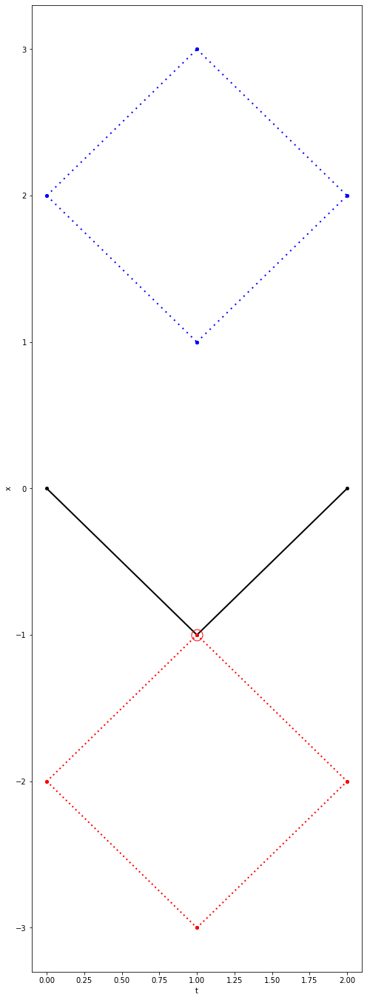

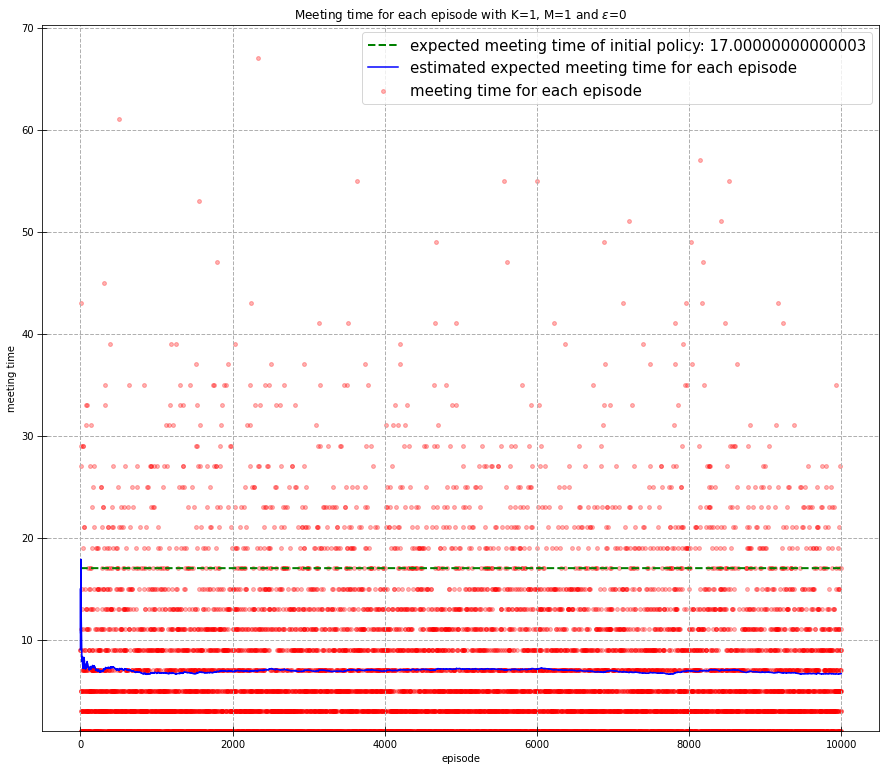

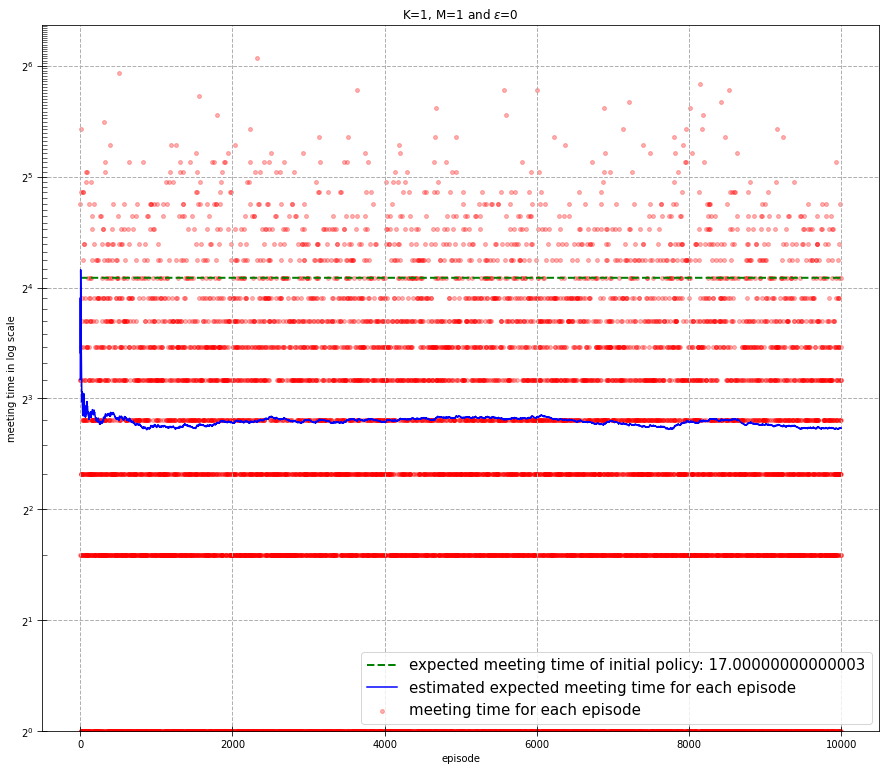

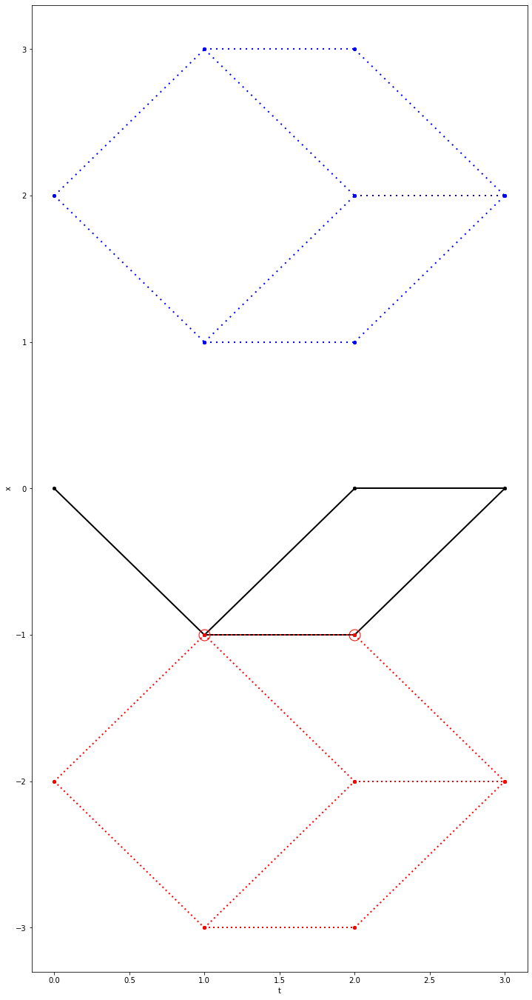

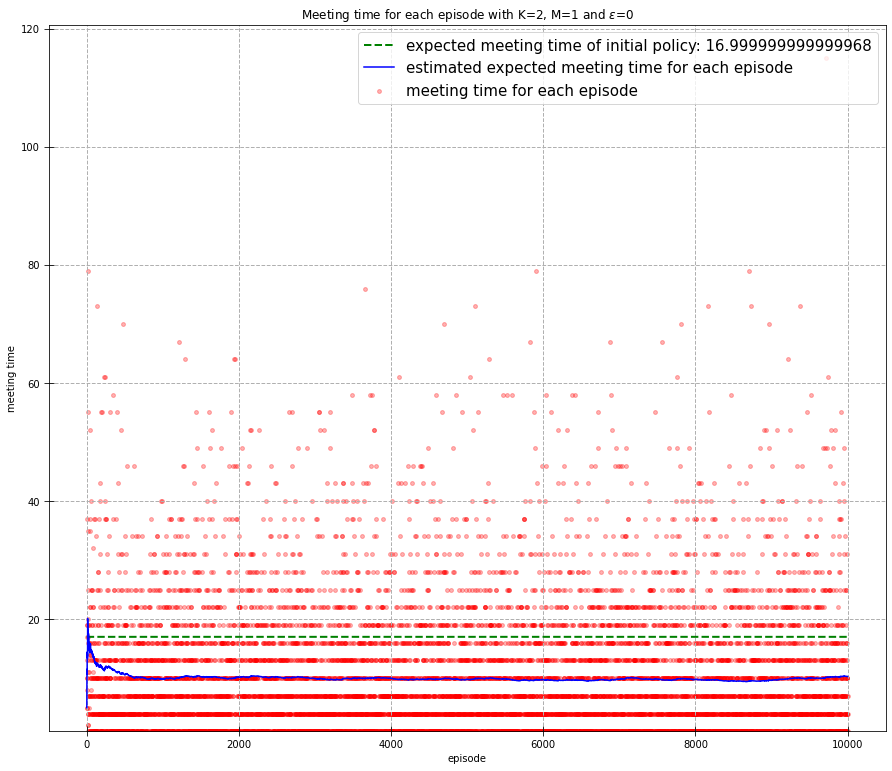

...

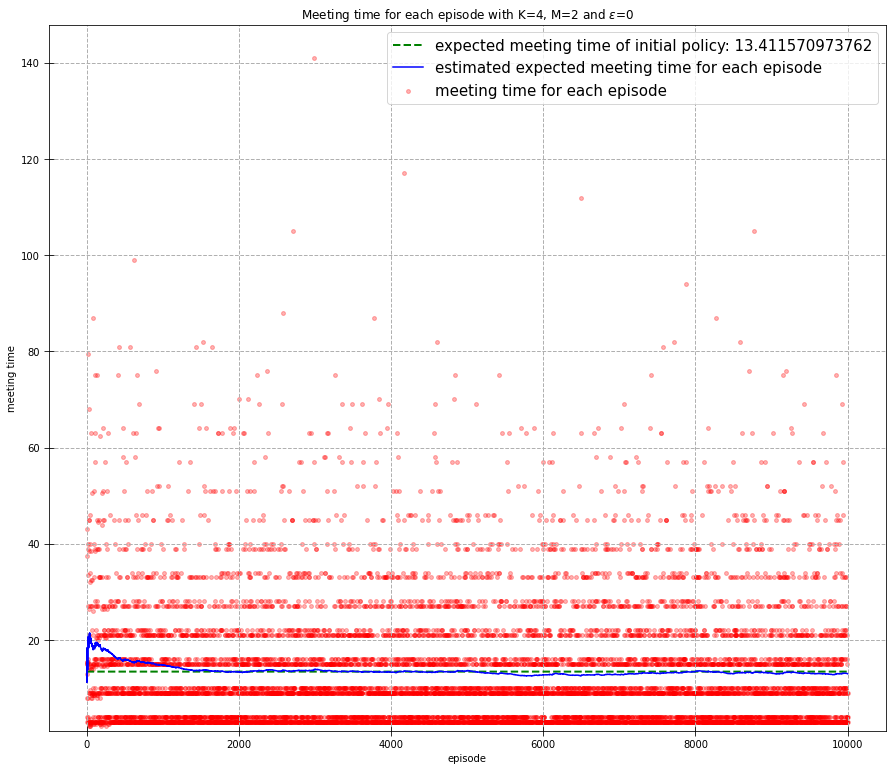

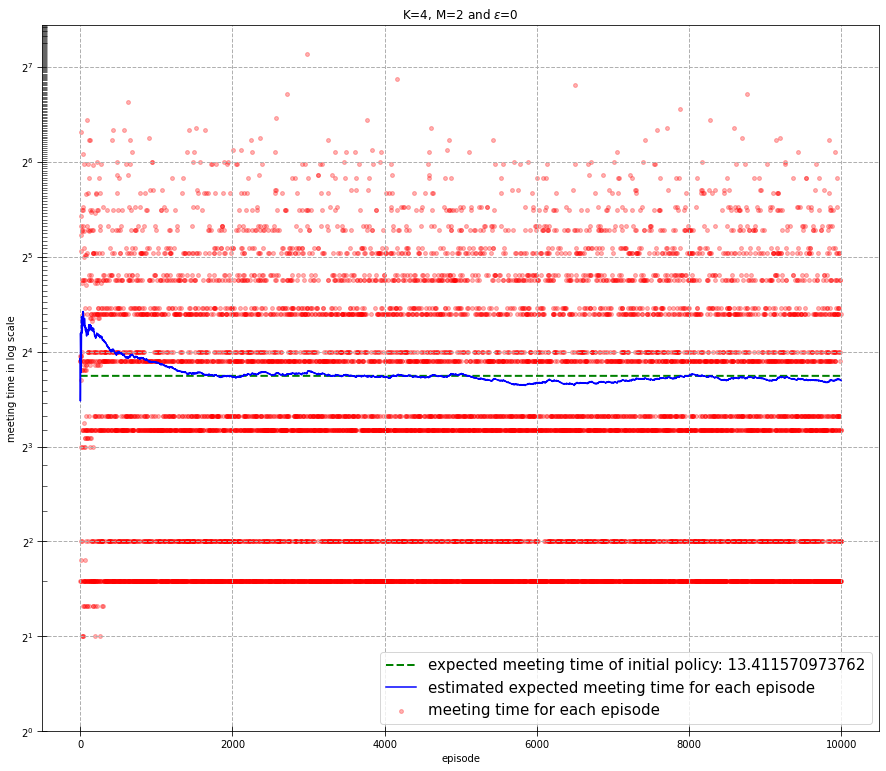

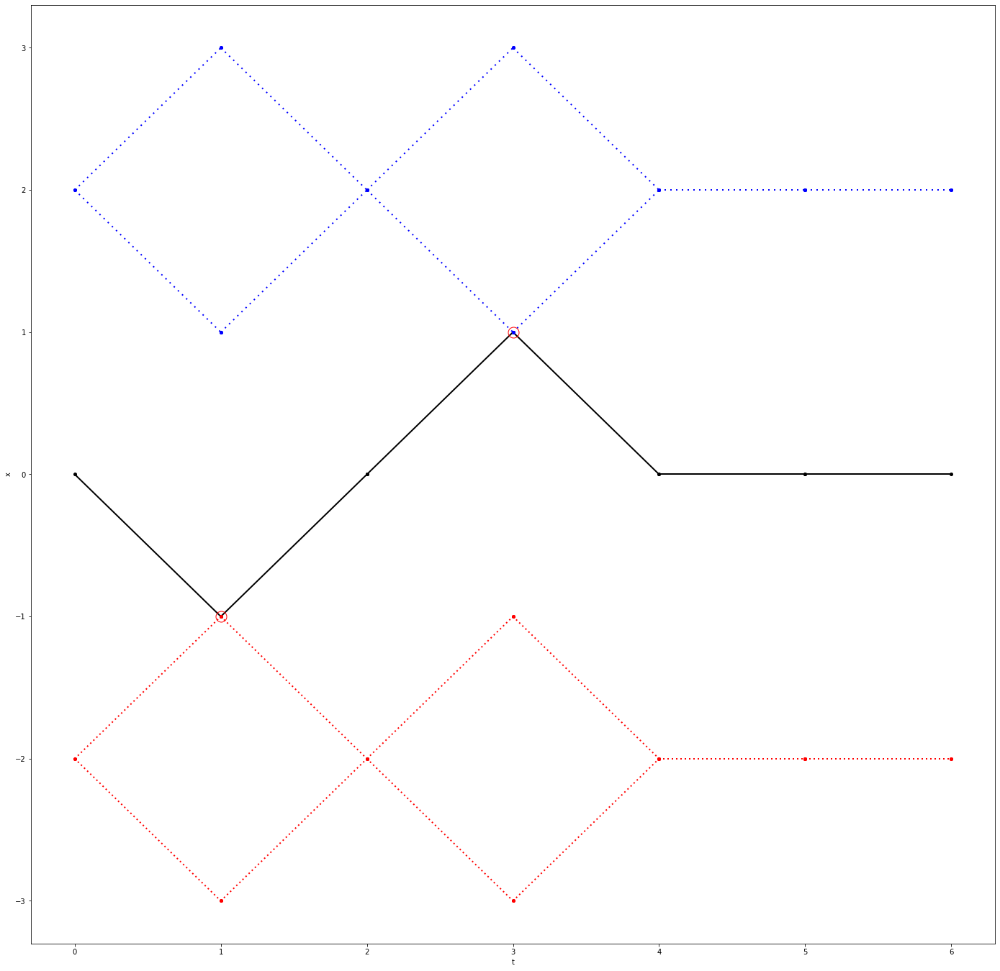

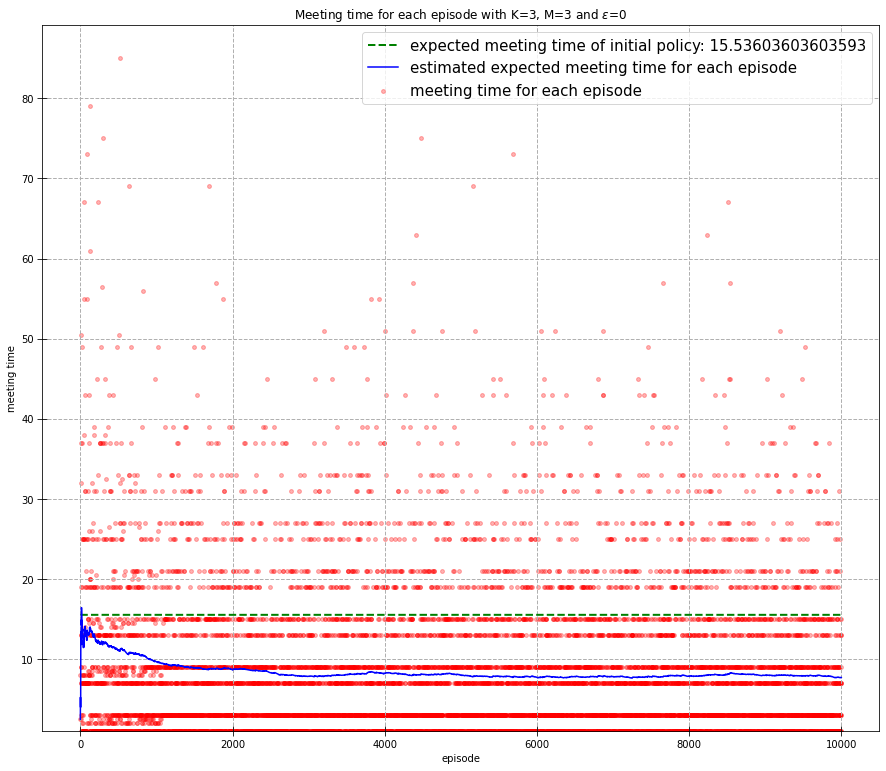

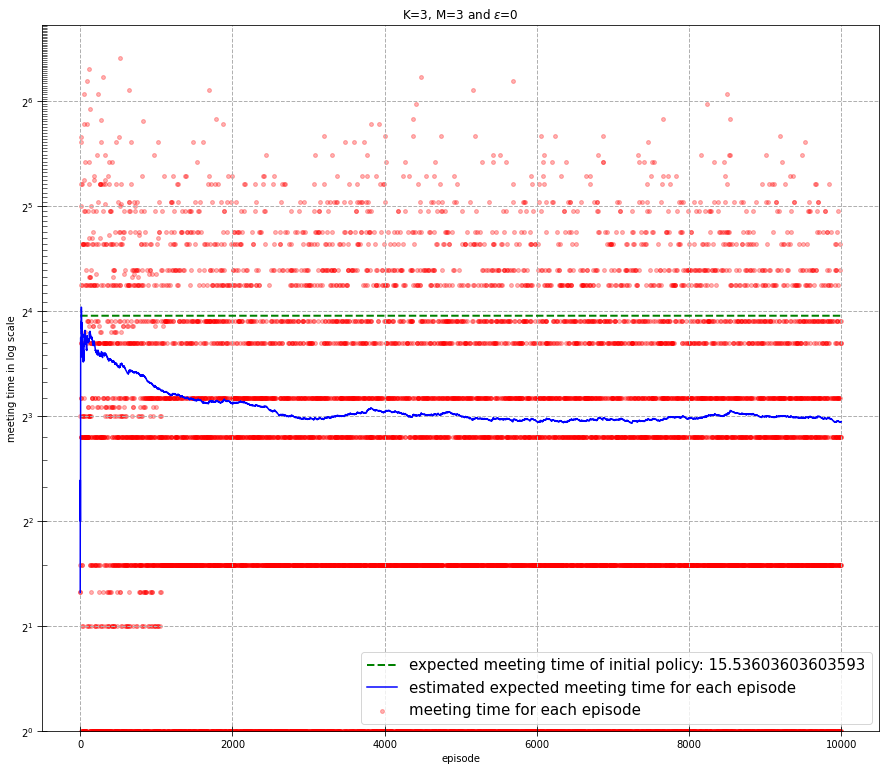

In [ ]:
# -------------------- Two phases strategies --------------------
# load
generator = load_object("all_policies_update_except_K7M1_iter_10001.pkl")
for obj in generator:  # each obj is a tuple containing the output of one simulation
  policyTest, (initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes) = obj  # unpack
  print("-----------------------------------------------------------------------------------")
  print(f"K={K}, M={M}")
  print("-----------------------------------------------------------------------------------")
  policyTest.plot_tree(d=2)
  print(expected_meeting_time(policyTest, K, M))
  for row in policyTest.tree[:K]:
      print("row", row)
      for node in row:
        print(node.observation, node.probability_vector_over_actions)

  plt.savefig(f"images/two_phases/K{K}M{M}.png")
  plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon=epsilon, n_episodes=n_episodes)
  plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon=epsilon, n_episodes=n_episodes, logplot=True)

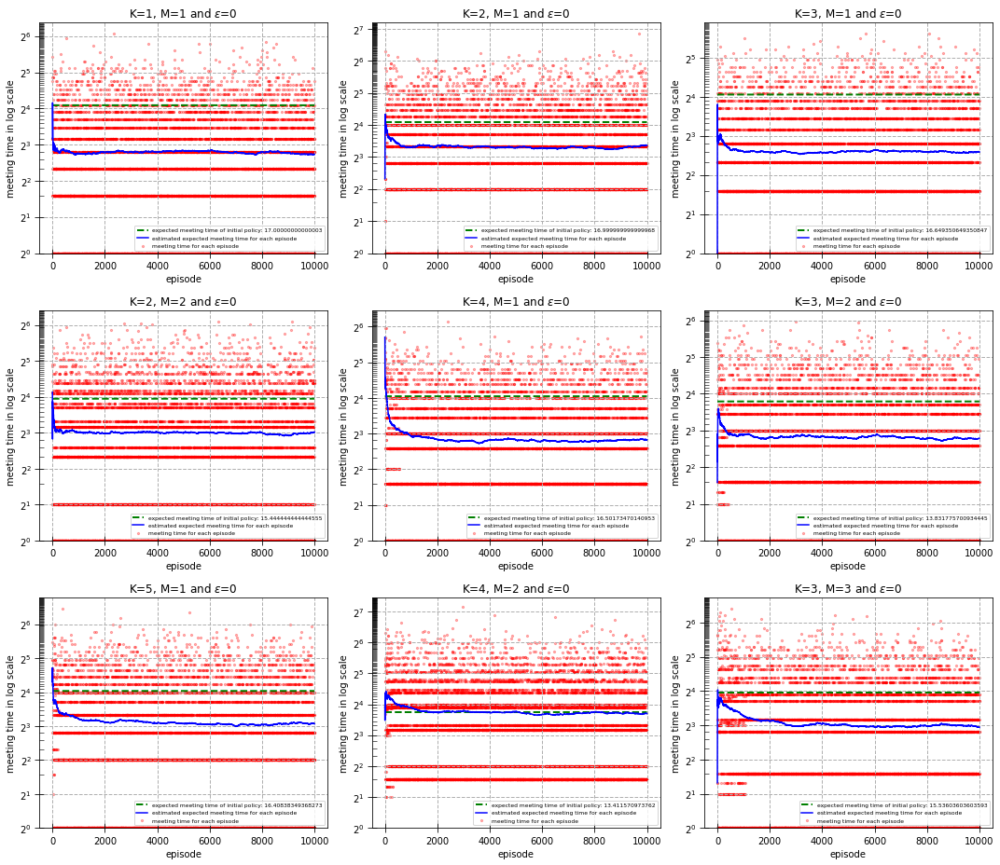

In [ ]:
# Quick way to plot all together except strategies, just the convergence plot
generator = load_object("all_policies_update_except_K7M1_iter_10001.pkl")
out = list(zip(*list(generator)))  # out[0] gives all the policies, out[1] gives all the params_plot, see list(zip(*[(1, [2, 3]), (4, [5, 6]), (7, [8, 9])])) gives [(1, 4, 7), ([2, 3], [5, 6], [8, 9])]
# print(out[1][0]), gives the first params_plot
multiple_plots_one_run(out[1])
mysavefig("general_plots/all_policies_update_except_K7M1_iter_10001.png")

##### No two phases

-----------------------------------------------------------------------------------
K=2
-----------------------------------------------------------------------------------
7.000575948398415
row [<__main__.NodePolicyTree object at 0x7ff275b060d0>]
[] [0.4957577 0.        0.5042423]
row [<__main__.NodePolicyTree object at 0x7ff274f8bdd0>, <__main__.NodePolicyTree object at 0x7ff2772ccad0>, <__main__.NodePolicyTree object at 0x7ff2778c5110>]
[[-1.]] [0. 0. 1.]
[[0.]] [0. 1. 0.]
[[1.]] [1. 0. 0.]
-----------------------------------------------------------------------------------
K=3
-----------------------------------------------------------------------------------
10.000446294236365
row [<__main__.NodePolicyTree object at 0x7ff27a72a610>]
[] [0.49695083 0.         0.50304917]
row [<__main__.NodePolicyTree object at 0x7ff2786704d0>, <__main__.NodePolicyTree object at 0x7ff2772eebd0>, <__main__.NodePolicyTree object at 0x7ff278d1b6d0>]
[[-1.]] [0.         0.66863775 0.33136225]
[[0.]] [0.48

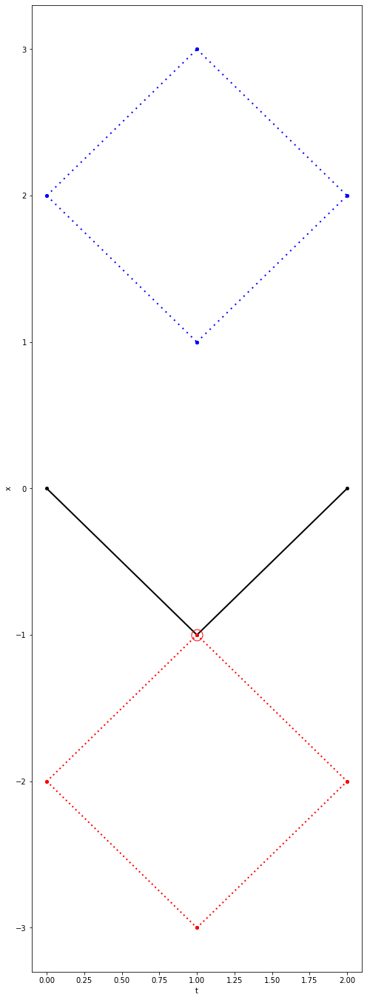

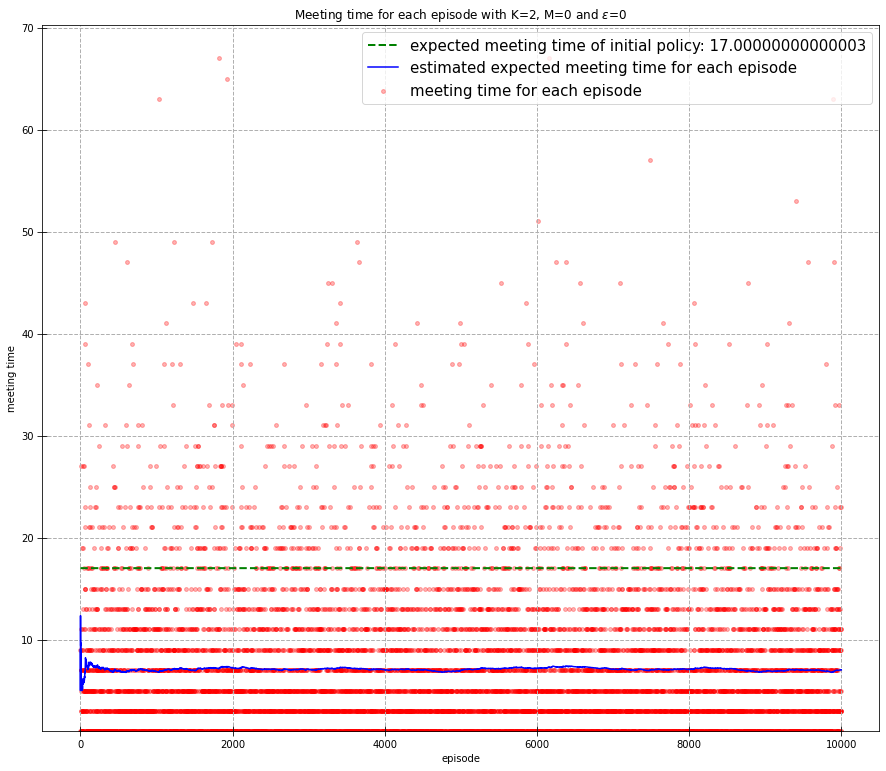

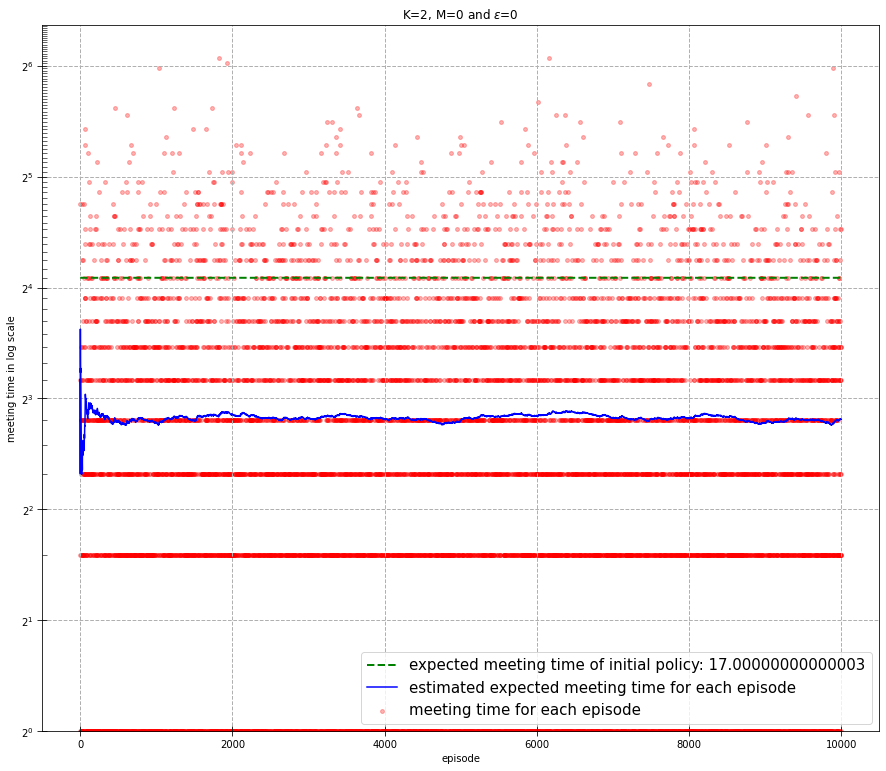

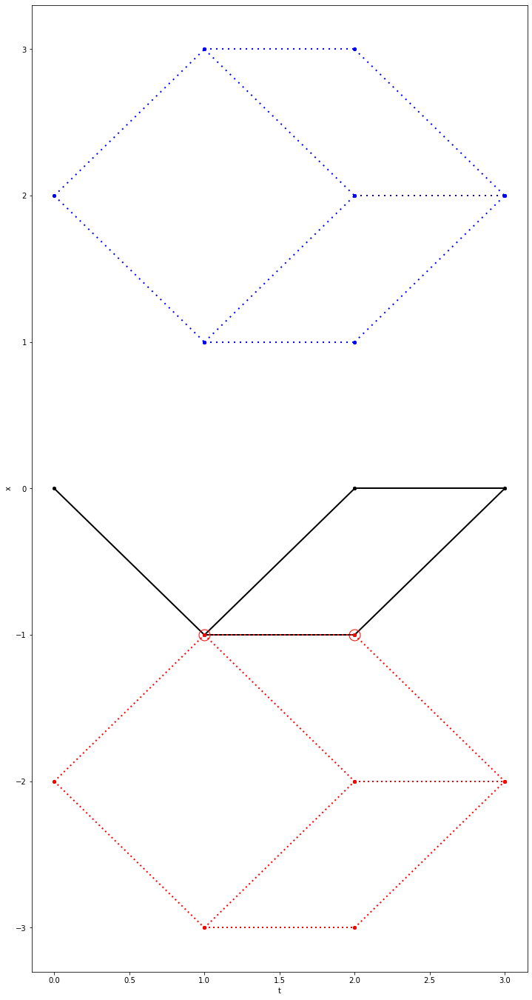

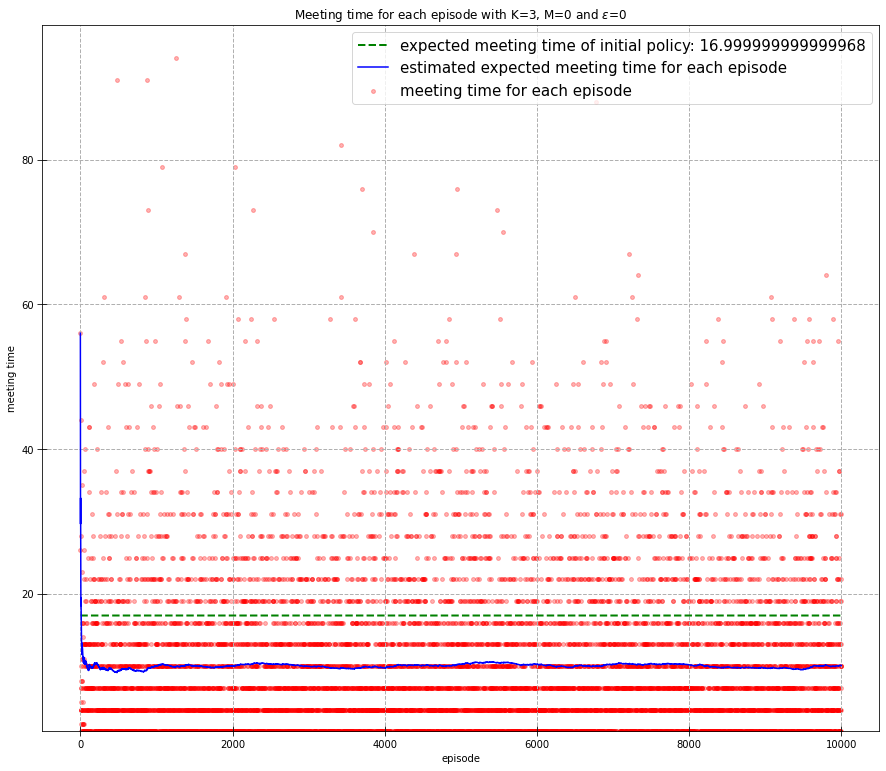

...

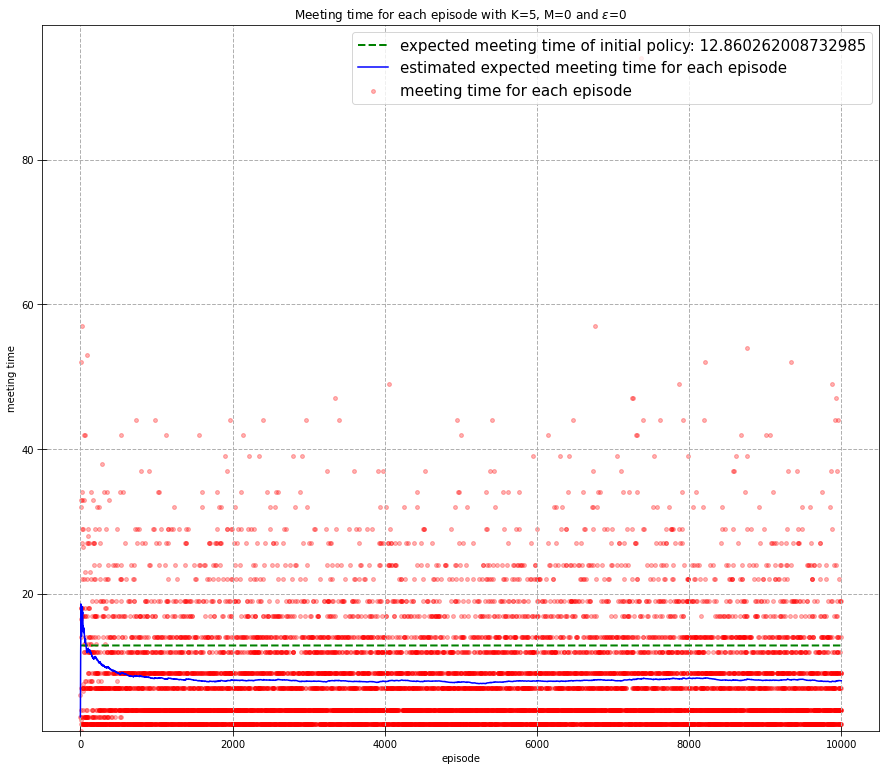

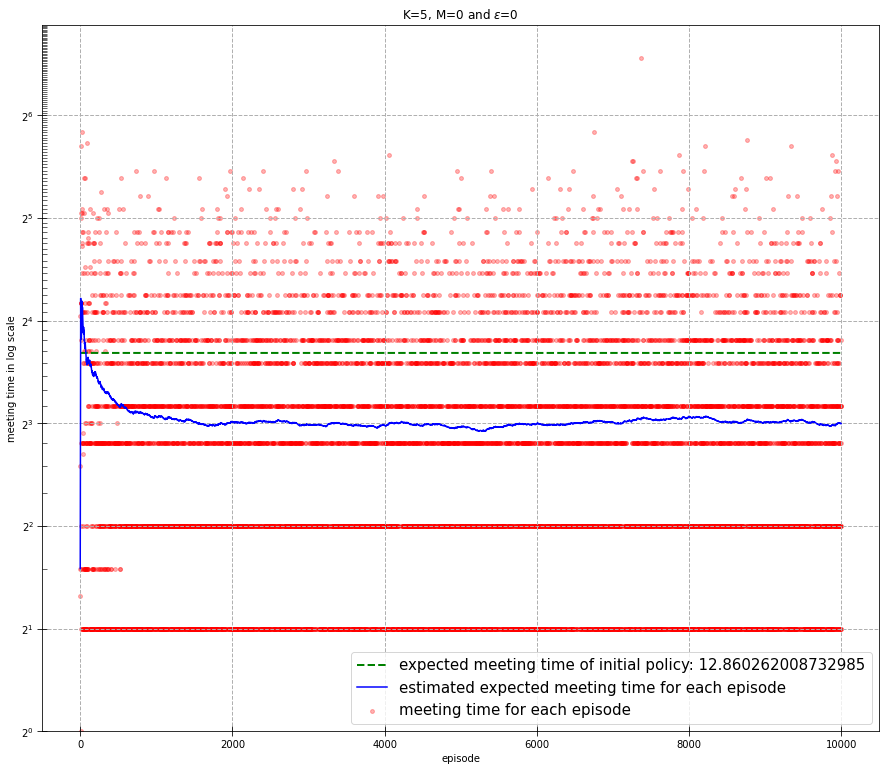

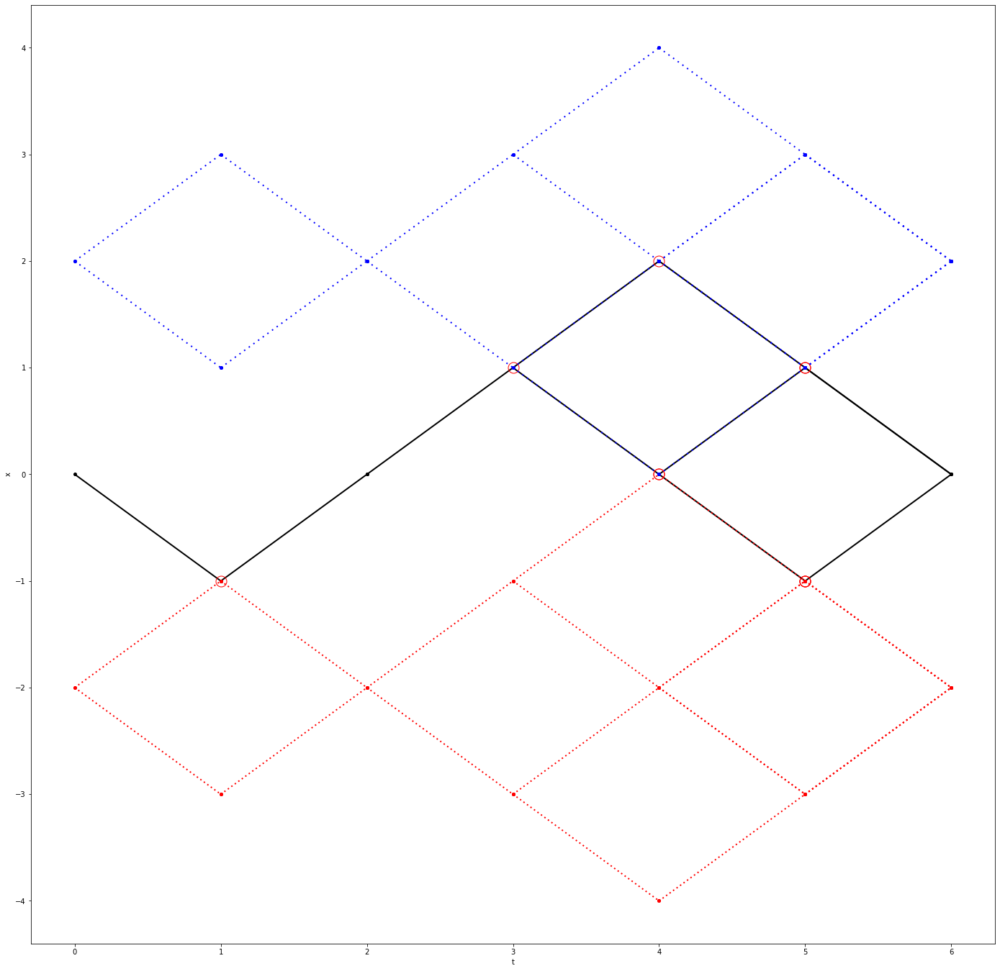

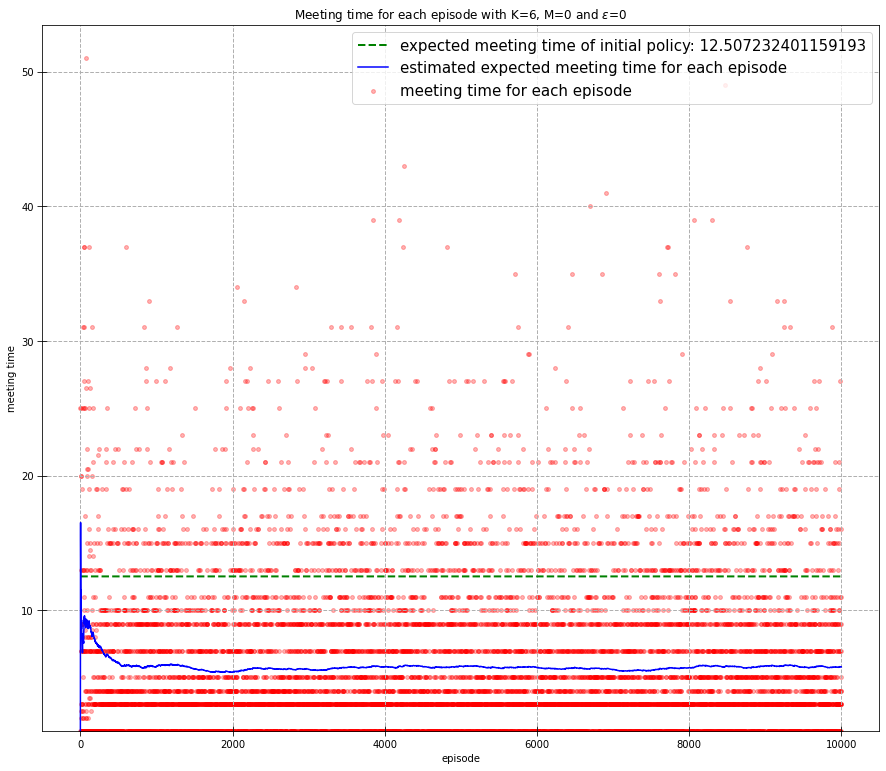

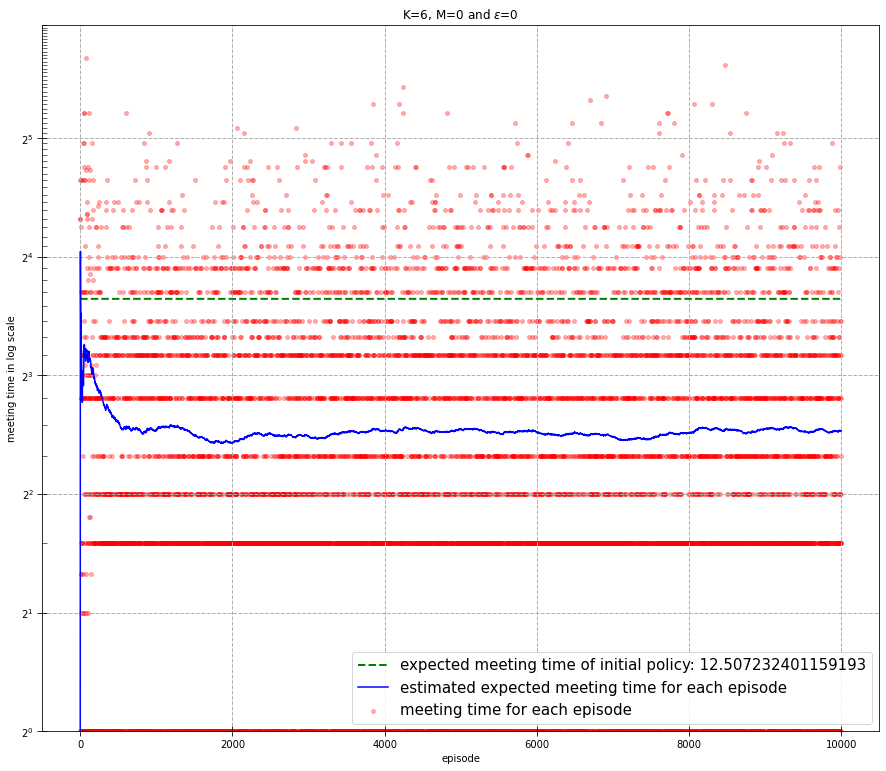

In [ ]:
# -------------------- No two phases strategies --------------------
# load
generator = load_object("all_policies_update_except_K7M1_iter_10001_no_two_phases_reinforcing_last_sub_trajs.pkl")
for obj in generator:  # each obj is a tuple containing the output of one simulation
  policyTest, (initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes) = obj  # unpack

  print("-----------------------------------------------------------------------------------")
  print(f"K={K}")
  print("-----------------------------------------------------------------------------------")
  policyTest.plot_tree(d=2)
  print(expected_meeting_time(policyTest, K, M))
  for row in policyTest.tree[:K]:
      print("row", row)
      for node in row:
        print(node.observation, node.probability_vector_over_actions)

  plt.savefig(f"images/no_two_phases/K{K}M{M}_reinforcing_last_sub_trajs.png")
  plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, n_episodes=n_episodes)
  plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, n_episodes=n_episodes, logplot=True)

-----------------------------------------------------------------------------------
K=2
-----------------------------------------------------------------------------------
8.37847823910456
row [<__main__.NodePolicyTree object at 0x7ff275ebb4d0>]
[] [0.46515888 0.07638655 0.45845457]
row [<__main__.NodePolicyTree object at 0x7ff275ec2a50>, <__main__.NodePolicyTree object at 0x7ff275e5c3d0>, <__main__.NodePolicyTree object at 0x7ff275eaf0d0>]
[[-1.]] [0. 0. 1.]
[[0.]] [0. 1. 0.]
[[1.]] [1. 0. 0.]
-----------------------------------------------------------------------------------
K=3
-----------------------------------------------------------------------------------
11.109656722201349
row [<__main__.NodePolicyTree object at 0x7ff275691290>]
[] [0.45530972 0.09707489 0.44761539]
row [<__main__.NodePolicyTree object at 0x7ff275691910>, <__main__.NodePolicyTree object at 0x7ff275ec6d50>, <__main__.NodePolicyTree object at 0x7ff275a64a50>]
[[-1.]] [0.         0.62379384 0.37620616]
[[0.]] [0.

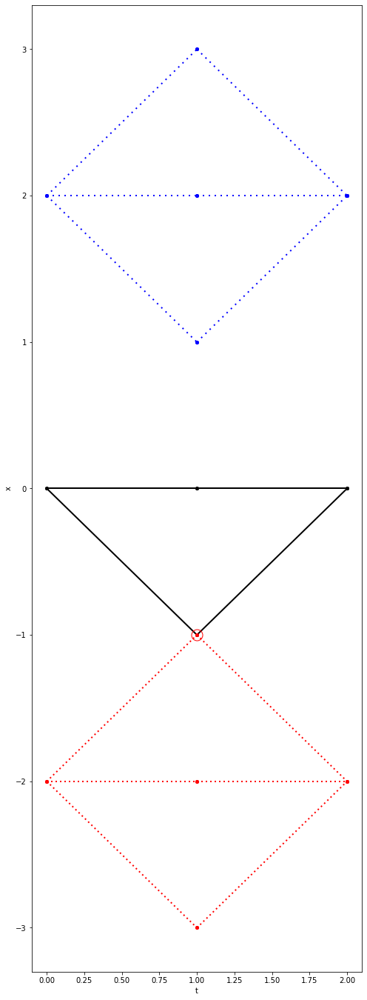

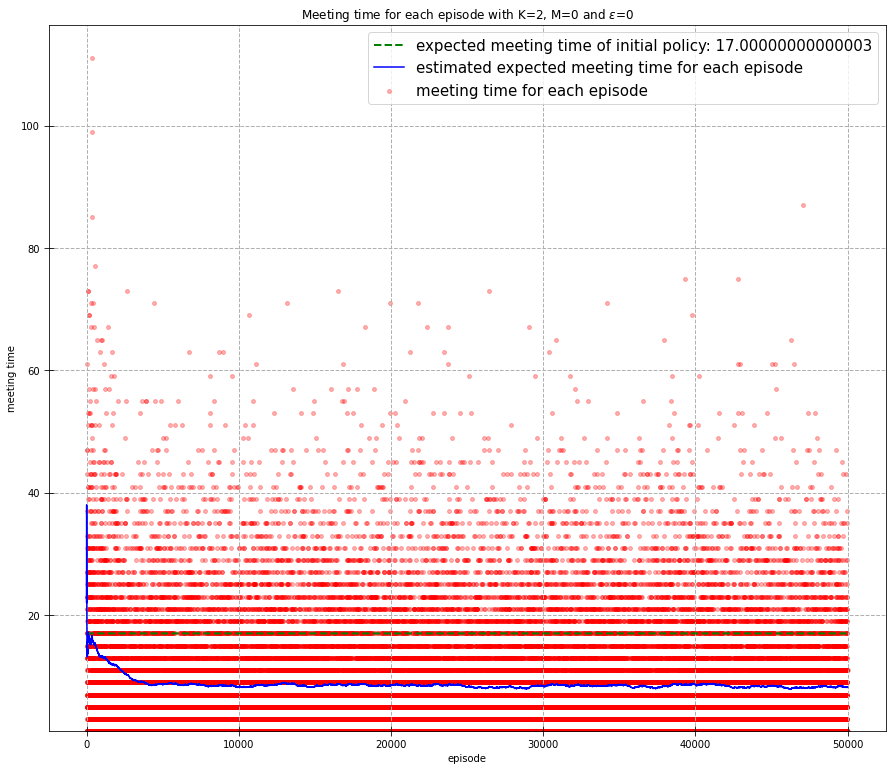

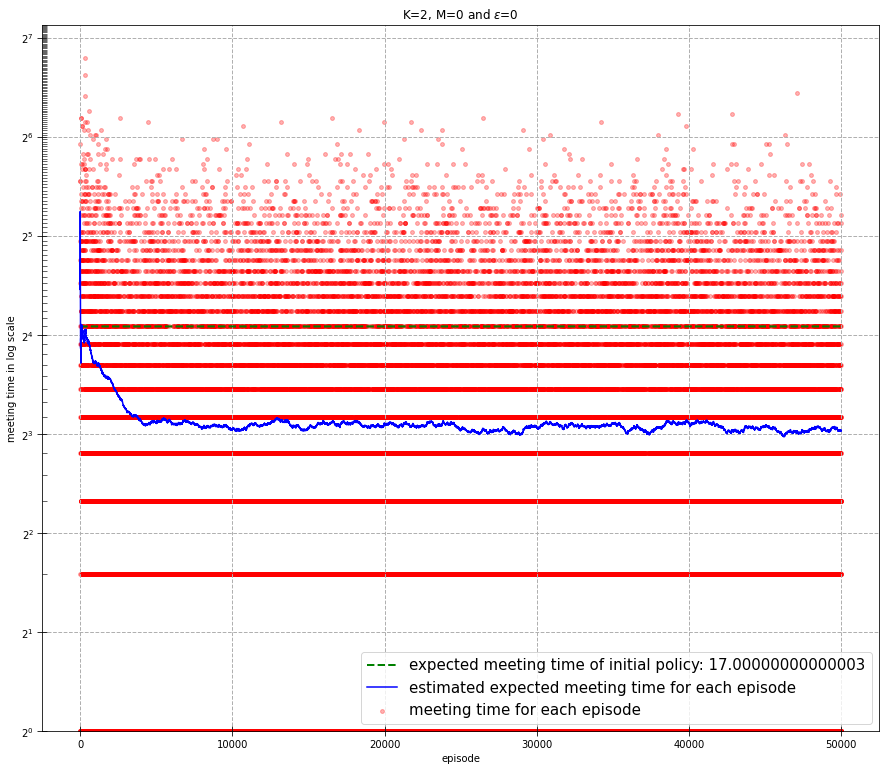

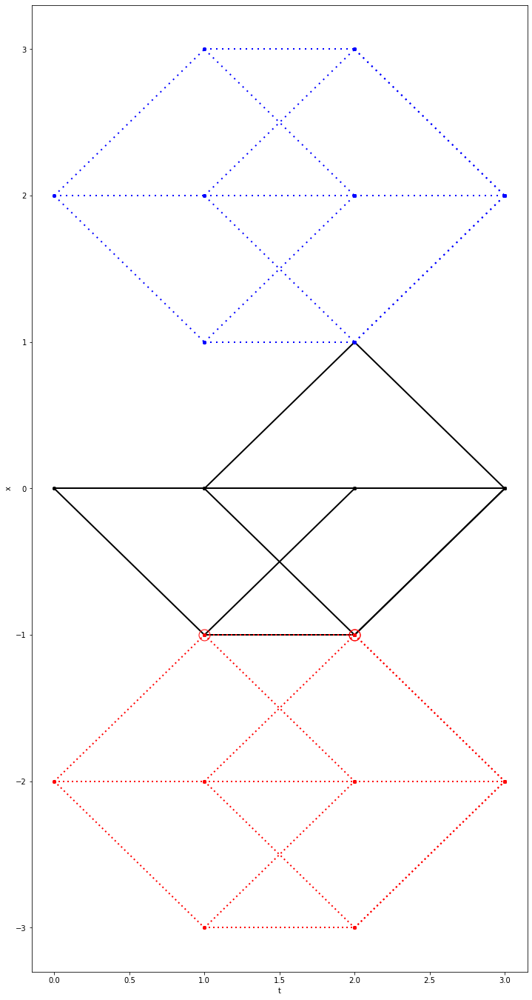

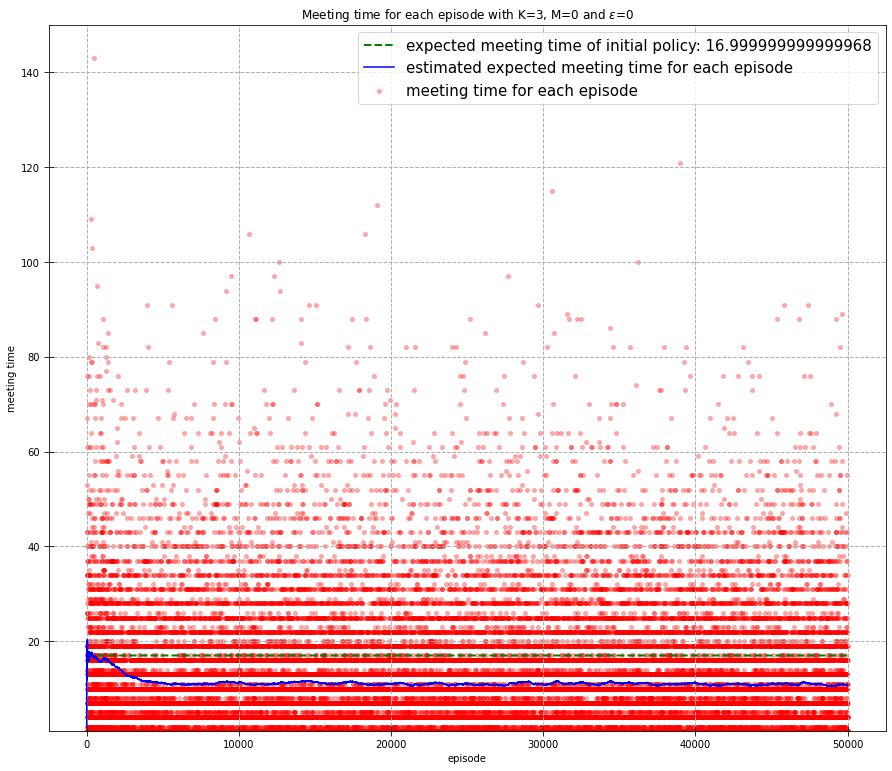

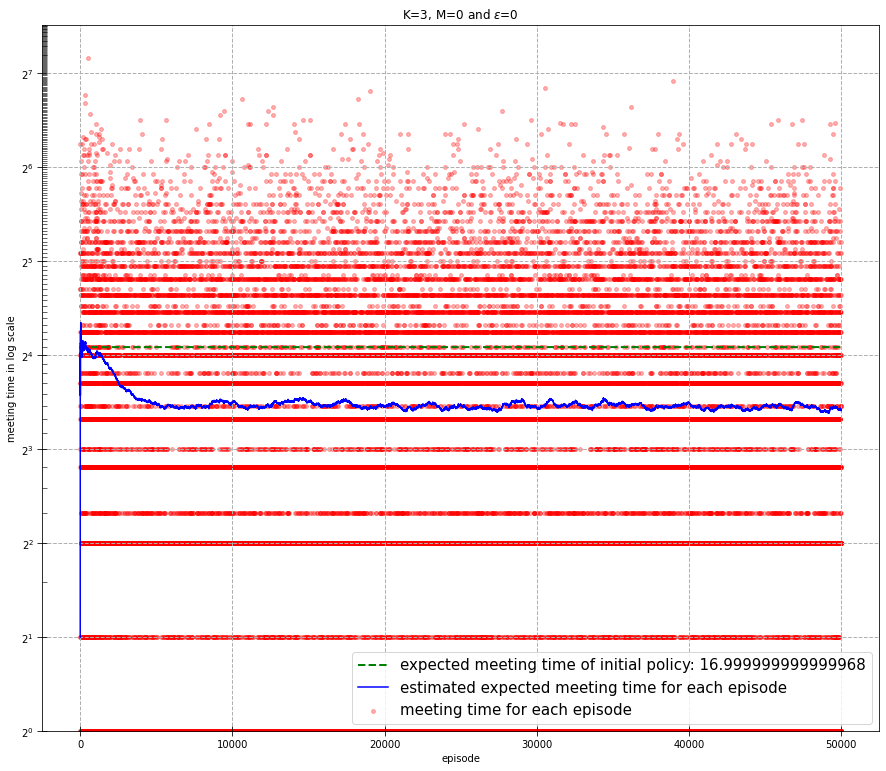

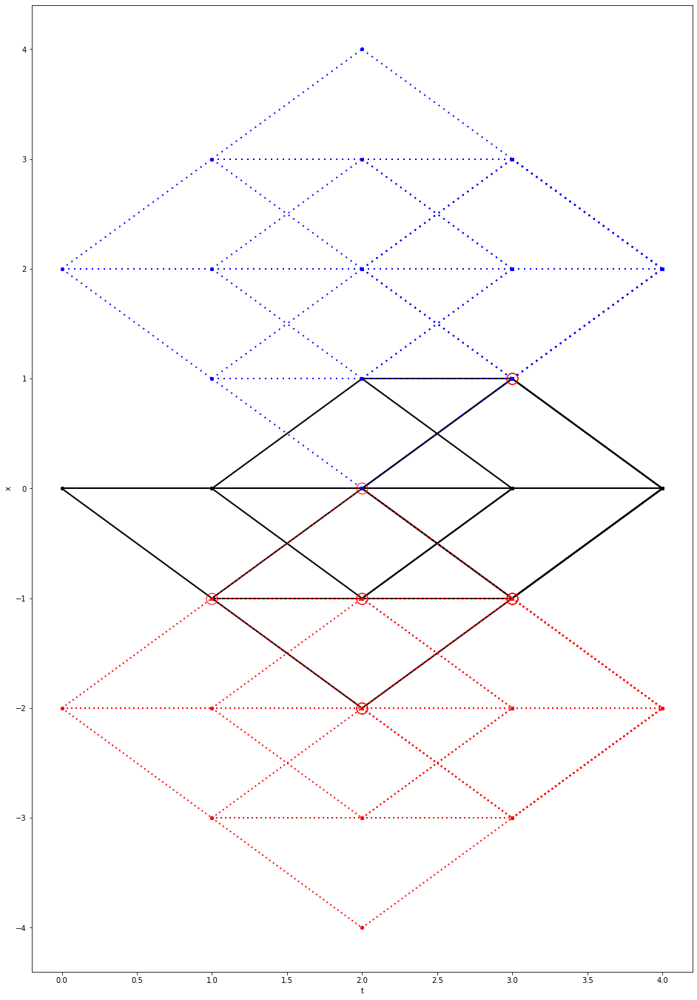

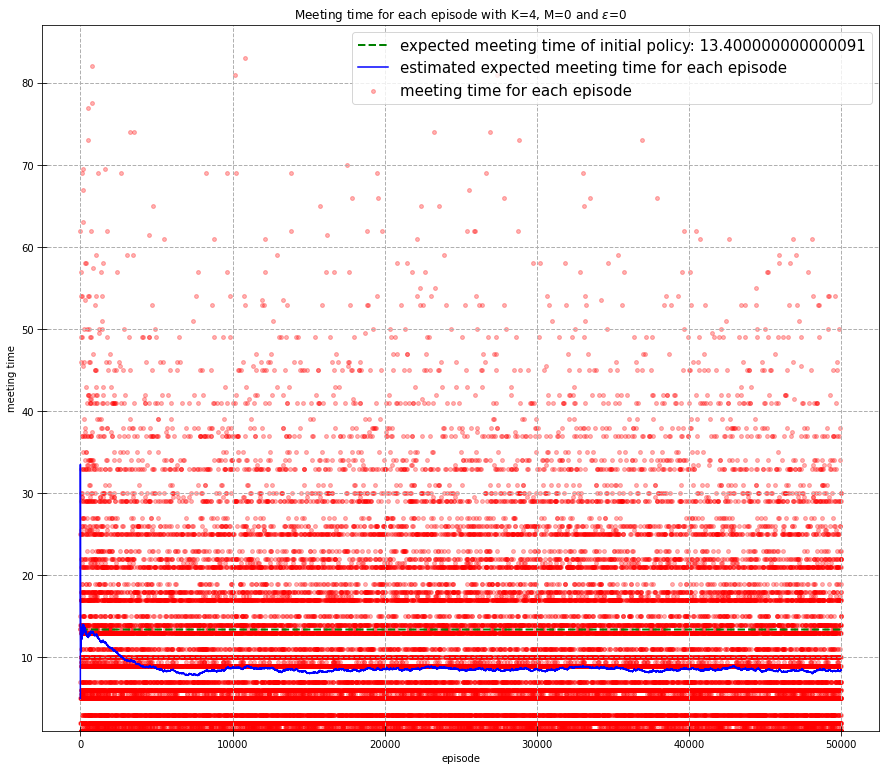

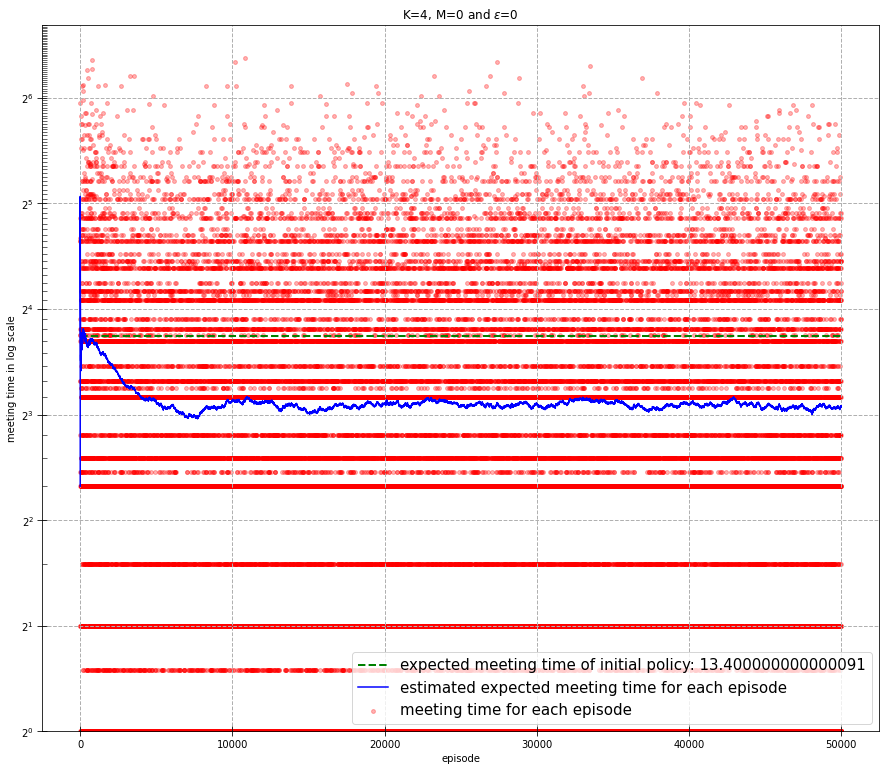

In [ ]:
# -------------------- No two phases strategies - REINFORCE like--------------------
# load
generator = load_object("all_policies_update_except_K7M1_iter_50001_no_two_phases_reinforce_gradient_projection_like.pkl")
for obj in generator:  # each obj is a tuple containing the output of one simulation
  policyTest, (initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes) = obj  # unpack

  print("-----------------------------------------------------------------------------------")
  print(f"K={K}")
  print("-----------------------------------------------------------------------------------")
  policyTest.plot_tree(d=2)  # change eps from 1e-15 to 0.098 to ignore probabilities below 0.098
  print(expected_meeting_time(policyTest, K, M))
  for row in policyTest.tree[:K]:
      print("row", row)
      for node in row:
        print(node.observation, node.probability_vector_over_actions)

  plt.savefig(f"images/no_two_phases/test_K{K}M{M}_reinforce_gradient_projection_like.png")
  plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, n_episodes=n_episodes)
  plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, n_episodes=n_episodes, logplot=True)

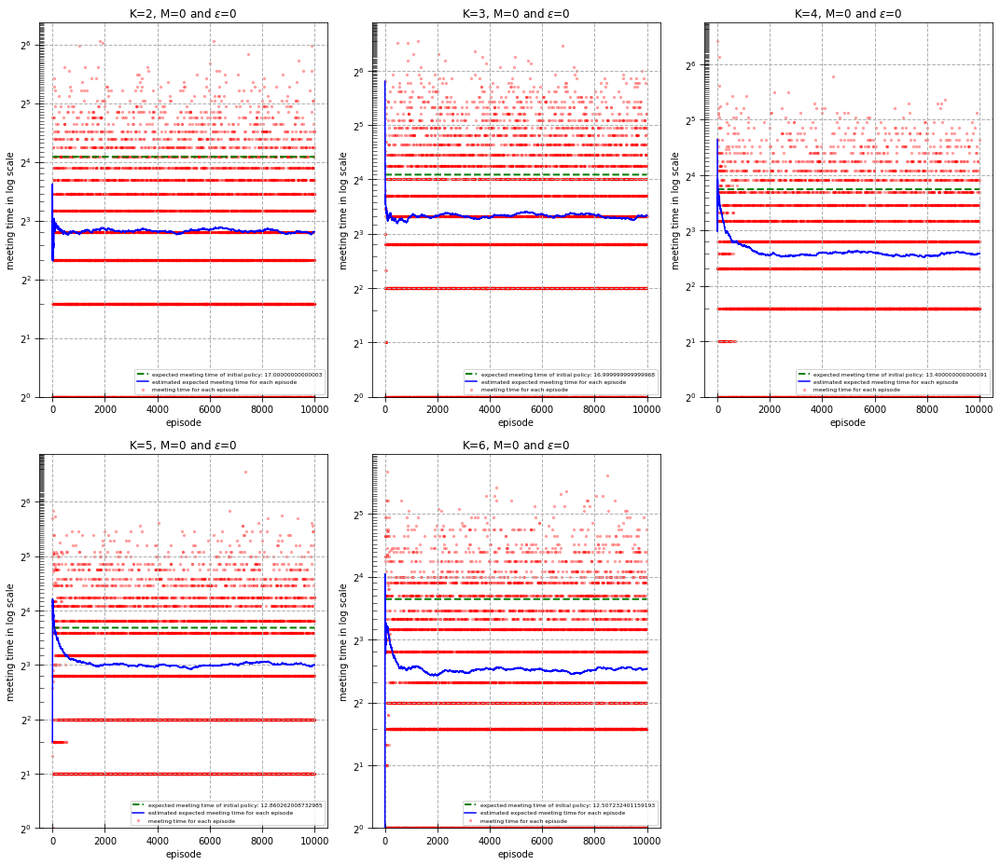

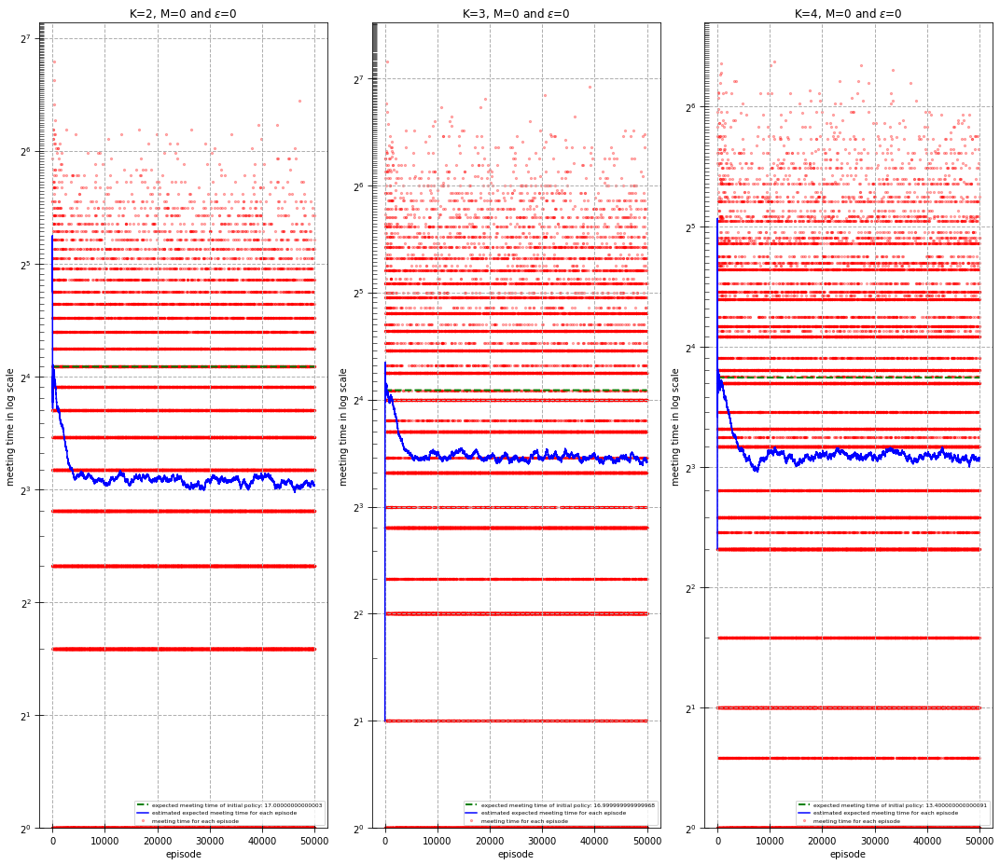

In [ ]:
# Quick way to plot all together except strategies, just the convergence plot
# reinforcing_last_sub_trajs
generator = load_object("all_policies_update_except_K7M1_iter_10001_no_two_phases_reinforcing_last_sub_trajs.pkl")
out = list(zip(*list(generator)))  # out[0] gives all the policies, out[1] gives all the params_plot, see list(zip(*[(1, [2, 3]), (4, [5, 6]), (7, [8, 9])])) gives [(1, 4, 7), ([2, 3], [5, 6], [8, 9])]
# print(out[1][0]), gives the first params_plot
multiple_plots_one_run(out[1])
mysavefig("general_plots/all_policies_update_except_K7M1_iter_10001_no_two_phases_reinforcing_last_sub_trajs.png")

# reinforce_gradient_projection_like
generator = load_object("all_policies_update_except_K7M1_iter_10001_no_two_phases_reinforce_gradient_projection_like.pkl")
out = list(zip(*list(generator)))  # out[0] gives all the policies, out[1] gives all the params_plot, see list(zip(*[(1, [2, 3]), (4, [5, 6]), (7, [8, 9])])) gives [(1, 4, 7), ([2, 3], [5, 6], [8, 9])]
# print(out[1][0]), gives the first params_plot
multiple_plots_one_run(out[1])
mysavefig("general_plots/all_policies_update_except_K7M1_iter_10001_no_two_phases_reinforce_gradient_projection_like.png")

## One run : Only up to $K+M=5$. With `compute_expected_meeting_times=True`

### $\epsilon=0$

#### Simulate with two phases

In [ ]:
KM = np.array([[1, 1], [2, 1], [3, 1], [2, 2], [4, 1], [3, 2]]).T
epsilon = 0  # 0.6

save_object([simulate_basic_update(K=KM[0, j], M=KM[1, j], epsilon=epsilon, n_episodes=2501, compute_expected_meeting_times=True) for j in range(KM.shape[1])], "policies_update_up_to_K3M2_iter_2501_with_expected_meeting_times.pkl")  # when we'll unpickle, we'll have a generator where looping through it gives outputs of simulations

K=1, M=1, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=True

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 25.0 for episode: 0
Estimated meeting time: 25.0 for episode: 0
Computed expected meeting time (not tractable): 14.724612475982315
K=2, M=1, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=True

expected meeting time of the initial policy: 16.999999999999968
Meeting_time 10.0 for episode: 0
Estimated meeting time: 10.0 for episode: 0
Computed expected meeting time (not tractable): 15.555494078538663
K=3, M=1, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=True

expected meeting time of the initial policy: 16.649350649350847
Meeting_time 21.0 for episode: 0
Estimated meeting time: 21.0 for episode: 0
Computed expected meeting time (not tractable): 15.646265359953707
K=2, M=2, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=True

expected meeting time

```
K=1, M=1, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=True

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 25.0 for episode: 0
Estimated meeting time: 25.0 for episode: 0
Computed expected meeting time (not tractable): 14.724612475982315
K=2, M=1, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=True

expected meeting time of the initial policy: 16.999999999999968
Meeting_time 10.0 for episode: 0
Estimated meeting time: 10.0 for episode: 0
Computed expected meeting time (not tractable): 15.555494078538663
K=3, M=1, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=True

expected meeting time of the initial policy: 16.649350649350847
Meeting_time 21.0 for episode: 0
Estimated meeting time: 21.0 for episode: 0
Computed expected meeting time (not tractable): 15.646265359953707
K=2, M=2, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=True

expected meeting time of the initial policy: 15.444444444444555
Meeting_time 9.0 for episode: 0
Estimated meeting time: 9.0 for episode: 0
Computed expected meeting time (not tractable): 14.31742190398712
K=4, M=1, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=True

expected meeting time of the initial policy: 16.50173470140953
Meeting_time 16.0 for episode: 0
Estimated meeting time: 16.0 for episode: 0
Computed expected meeting time (not tractable): 15.596820281744066
K=3, M=2, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=True

expected meeting time of the initial policy: 13.831775700934445
Meeting_time 31.0 for episode: 0
Estimated meeting time: 31.0 for episode: 0
Computed expected meeting time (not tractable): 13.328054643940877
```

#### Load and plot

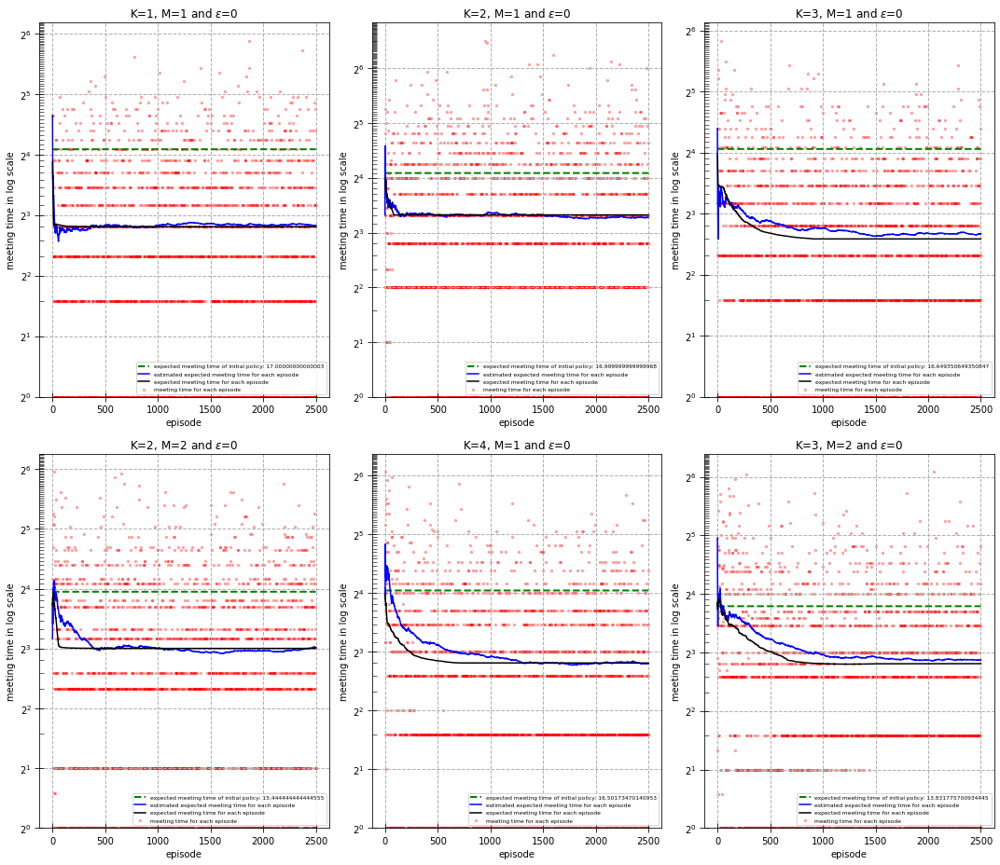

In [ ]:
generator = load_object("policies_update_up_to_K3M2_iter_2501_with_expected_meeting_times.pkl")
out = list(zip(*list(generator)))  # out[0] gives all the policies, out[1] gives all the params_plot, see list(zip(*[(1, [2, 3]), (4, [5, 6]), (7, [8, 9])])) gives [(1, 4, 7), ([2, 3], [5, 6], [8, 9])]
# print(out[1][0]), gives the first params_plot
multiple_plots_one_run(out[1])
mysavefig("general_plots/policies_update_up_to_K3M2_iter_2501_with_expected_meeting_times.png")

## Multiple runs : All at once (except $K=7, M=1$). Only for reinforce last subtraj

### $\epsilon=0$
Here we use $\epsilon=0$. Recall that $K \geq M$

#### Simulate with two phases

In [ ]:
KM = np.array([[1, 1], [2, 1], [3, 1], [2, 2], [4, 1], [3, 2], [5, 1], [4, 2], [3, 3]]).T
epsilon = 0  # 0.6

save_object([simulation_multiple_runs(K=KM[0, j], M=KM[1, j], epsilon=epsilon, n_episodes=2501, n_runs=10) for j in range(KM.shape[1])], "all_policies_update_except_K7M1_iter_2501_multiple_runs.pkl")
# when we'll unpickle, we'll have a generator where looping through it gives outputs of multiple runs..

K=1, M=1, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 9.0 for episode: 0
Estimated meeting time: 9.0 for episode: 0
Computed expected meeting time (not tractable): 14.334597635102924
K=1, M=1, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 11.0 for episode: 0
Estimated meeting time: 11.0 for episode: 0
Computed expected meeting time (not tractable): 14.286494682155695
K=1, M=1, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 17.0 for episode: 0
Estimated meeting time: 17.0 for episode: 0
Computed expected meeting time (not tractable): 14.520408163265317
K=1, M=1, epsilon=0, n_episodes=2501 + version with compute_expected_meeting_times=False

expected meeting time

#### Simulate without the two phases

In [ ]:
KM = np.array([[2, 0], [3, 0], [4, 0], [5, 0], [6, 0]]).T  # M has not anymore same meaning..
epsilon = 0  # 0.6

save_object([simulation_multiple_runs(K=KM[0, j], M=KM[1, j], epsilon=epsilon, n_episodes=10001, n_runs=10, no_two_phases=True) for j in range(KM.shape[1])], "all_policies_update_except_K7M1_iter_2501_multiple_runs_no_two_phases.pkl")
# when we'll unpickle, we'll have a generator where looping through it gives outputs of multiple runs..

K=2, M=0, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 43.0 for episode: 0
Estimated meeting time: 43.0 for episode: 0
Computed expected meeting time (not tractable): 15.067686971557347
Meeting_time 1.0 for episode: 10000
Estimated meeting time: 7.02218379579497 for episode: 10000
Computed expected meeting time (not tractable): 7.000298914388898
K=2, M=0, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_times=False

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 5.0 for episode: 0
Estimated meeting time: 5.0 for episode: 0
Computed expected meeting time (not tractable): 14.18040001054049
Meeting_time 3.0 for episode: 10000
Estimated meeting time: 7.184073646812885 for episode: 10000
Computed expected meeting time (not tractable): 7.001356239339685
K=2, M=0, epsilon=0, n_episodes=10001 + version with compute_expected_meeting_time

In [ ]:
np.finfo(np.float64).eps

#### Load and plot

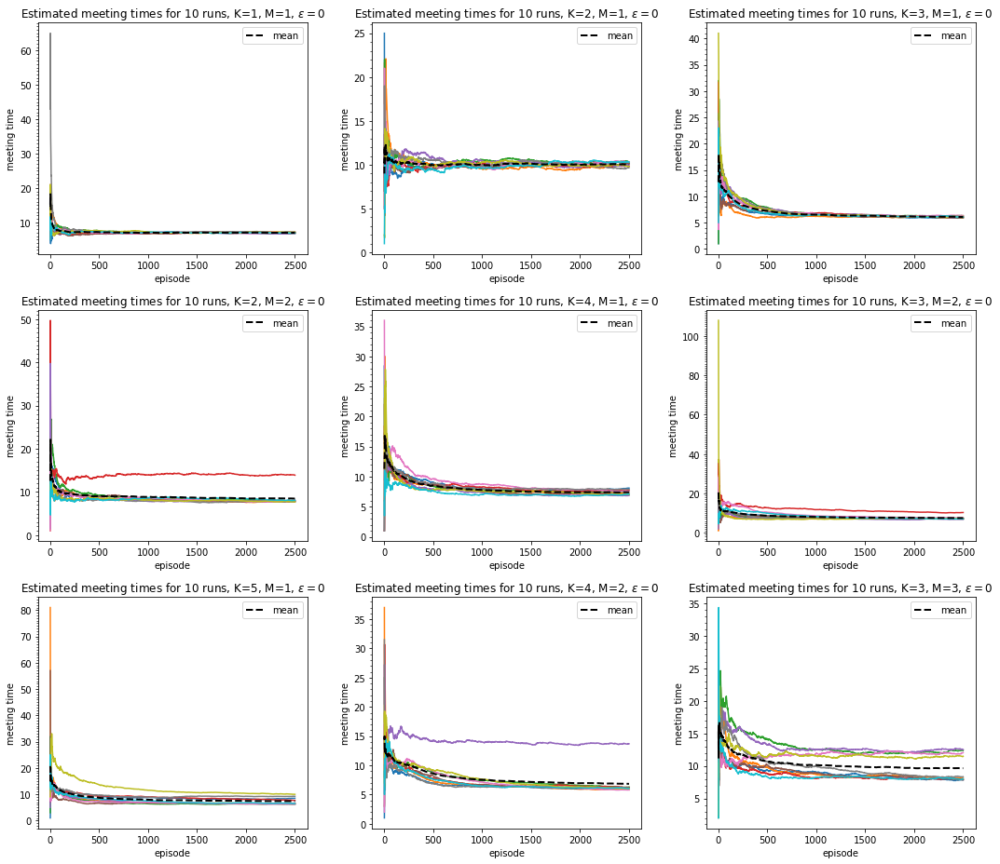

In [ ]:
# -------------------- Two phases strategies --------------------
generator = load_object("all_policies_update_except_K7M1_iter_2501_multiple_runs.pkl")
out = list(zip(*list(generator)))  # out[0] gives all the policies, out[1] gives all the params_plot
# print(out[1][0]), gives the first params_plot
multiple_plots_multiple_runs(out[1])
mysavefig("general_plots/all_policies_update_except_K7M1_iter_2501_multiple_runs.pdf")

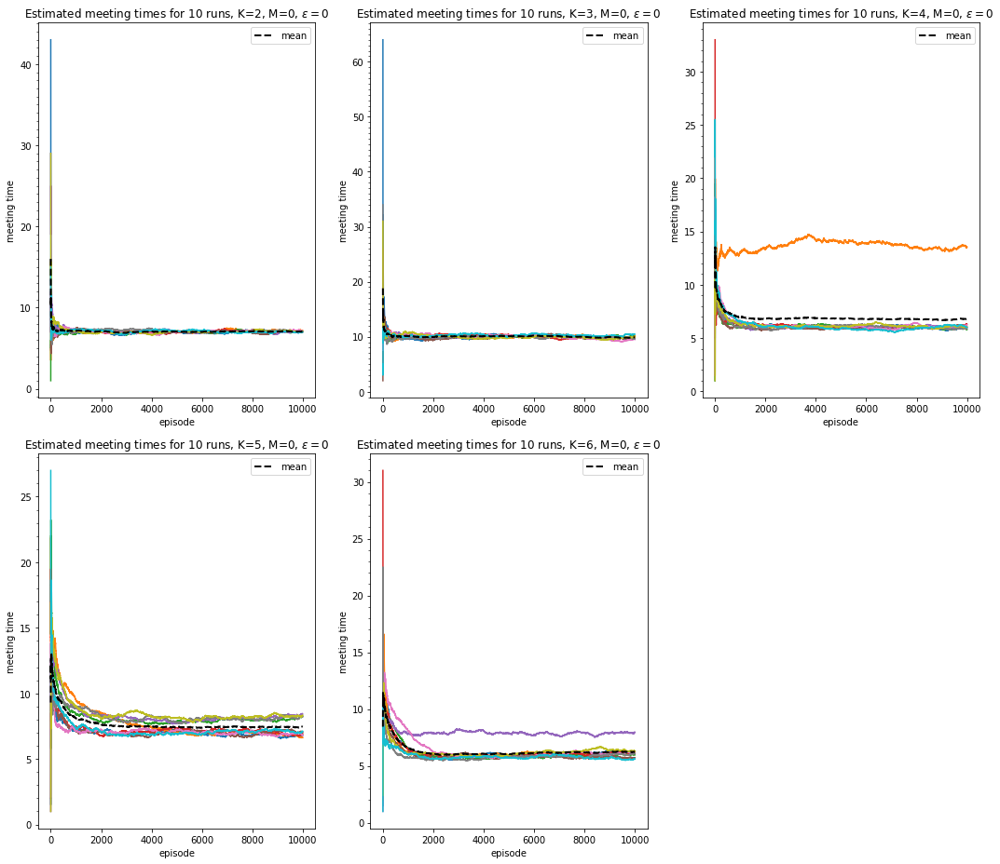

In [ ]:
# -------------------- No two phases strategies --------------------
generator = load_object("all_policies_update_except_K7M1_iter_10001_multiple_runs_no_two_phases.pkl")
out = list(zip(*list(generator)))  # out[0] gives all the policies, out[1] gives all the params_plot
# print(out[1][0]), gives the first params_plot
multiple_plots_multiple_runs(out[1])
mysavefig("general_plots/all_policies_update_except_K7M1_iter_10001_multiple_runs_no_two_phases.pdf")

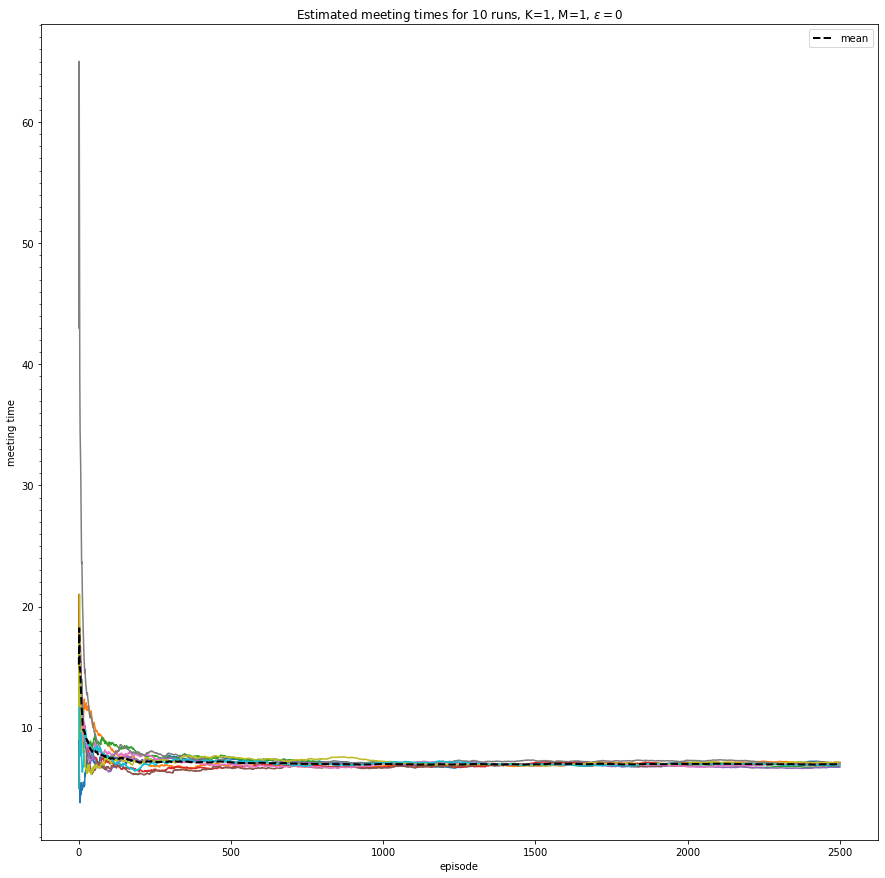

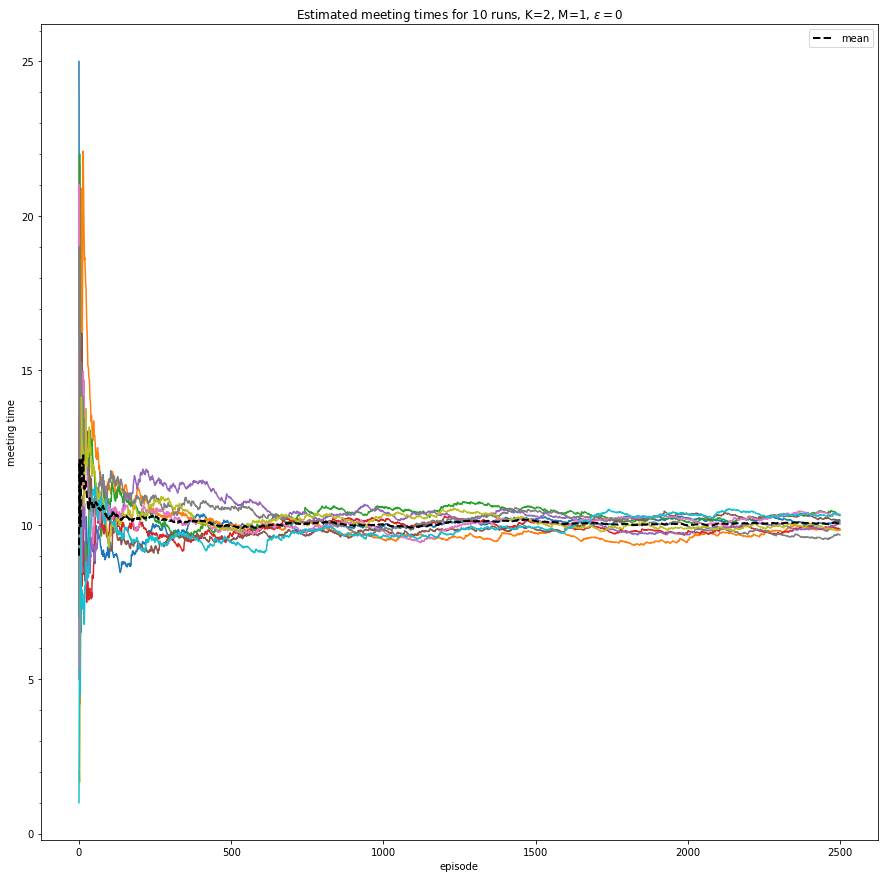

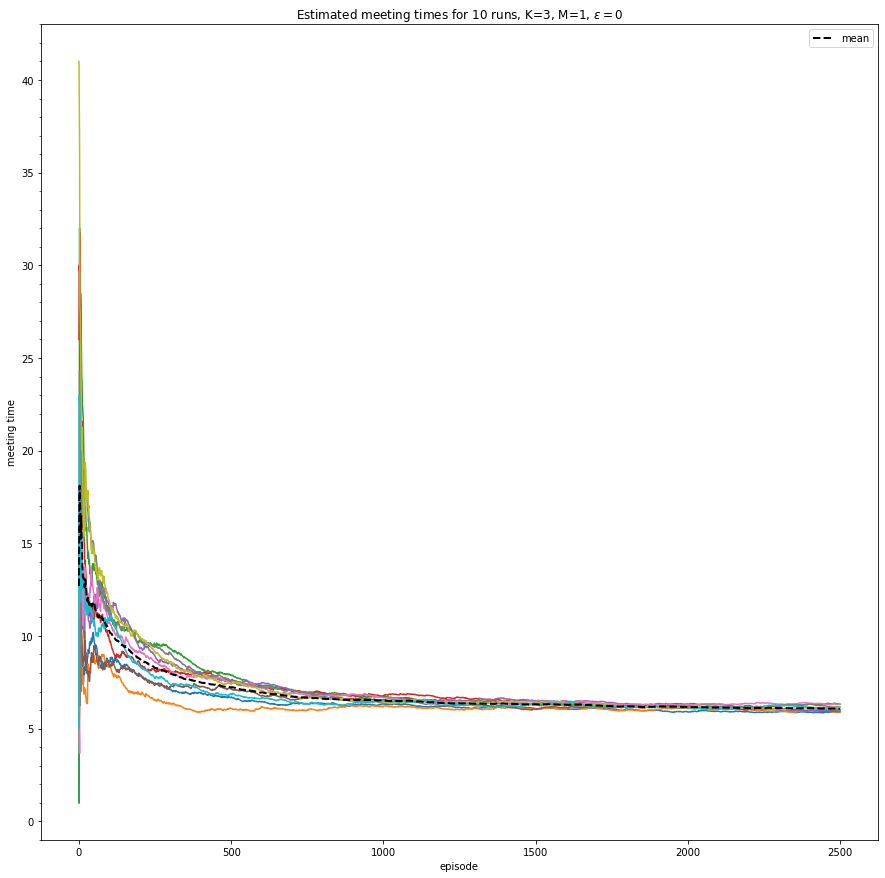

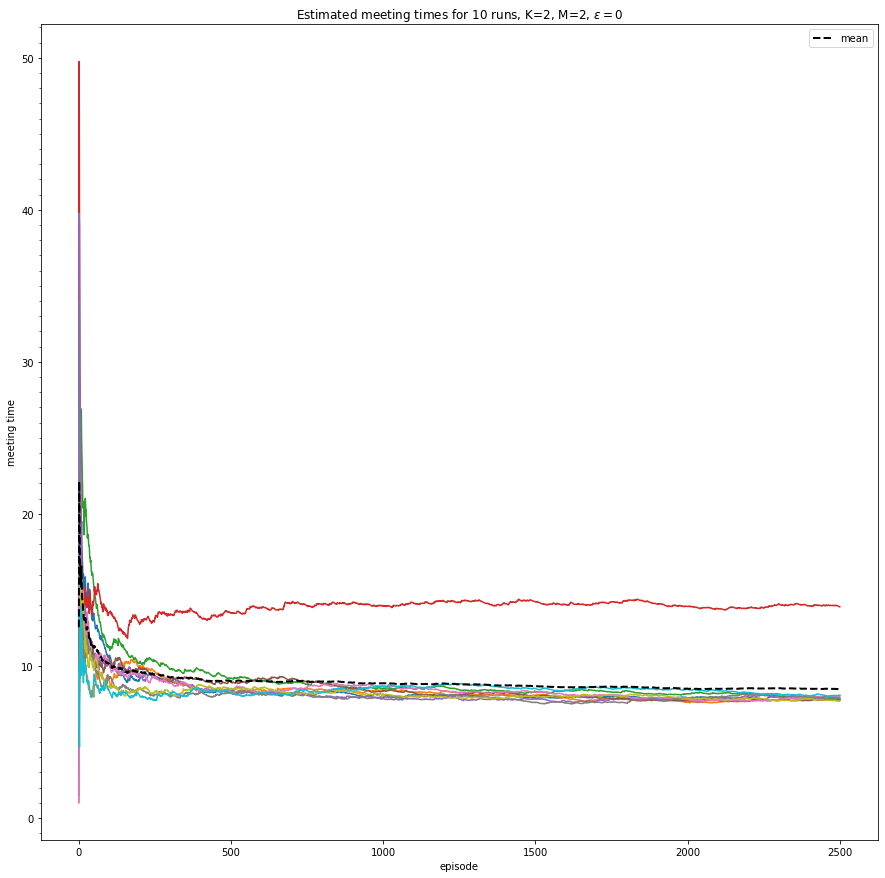

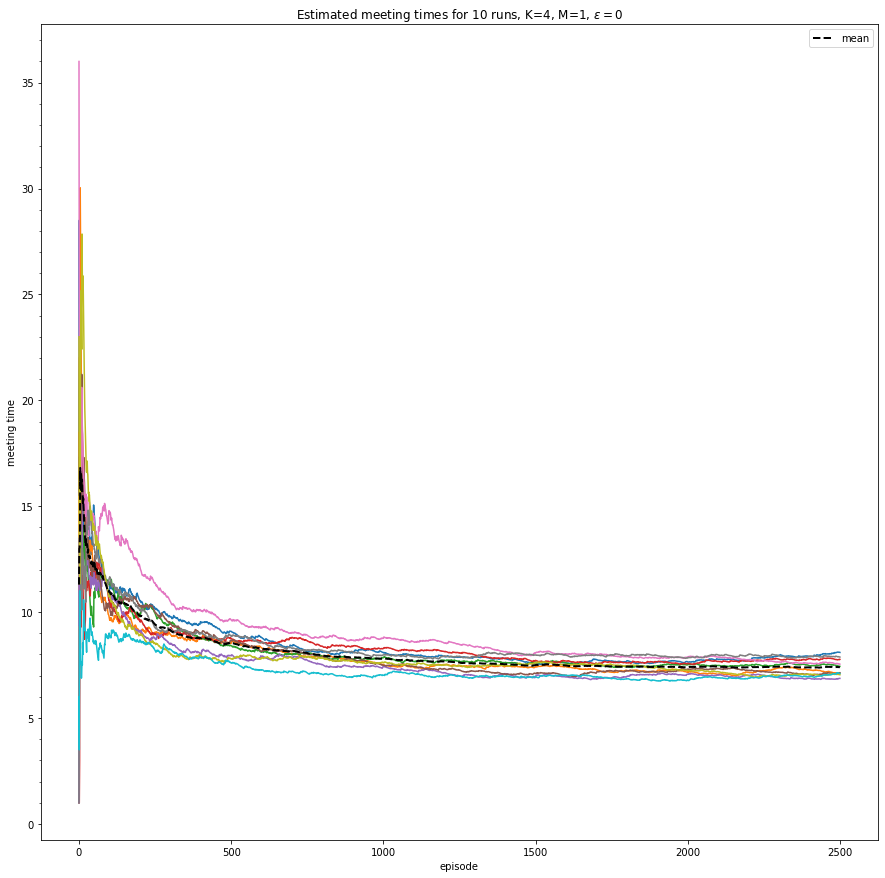

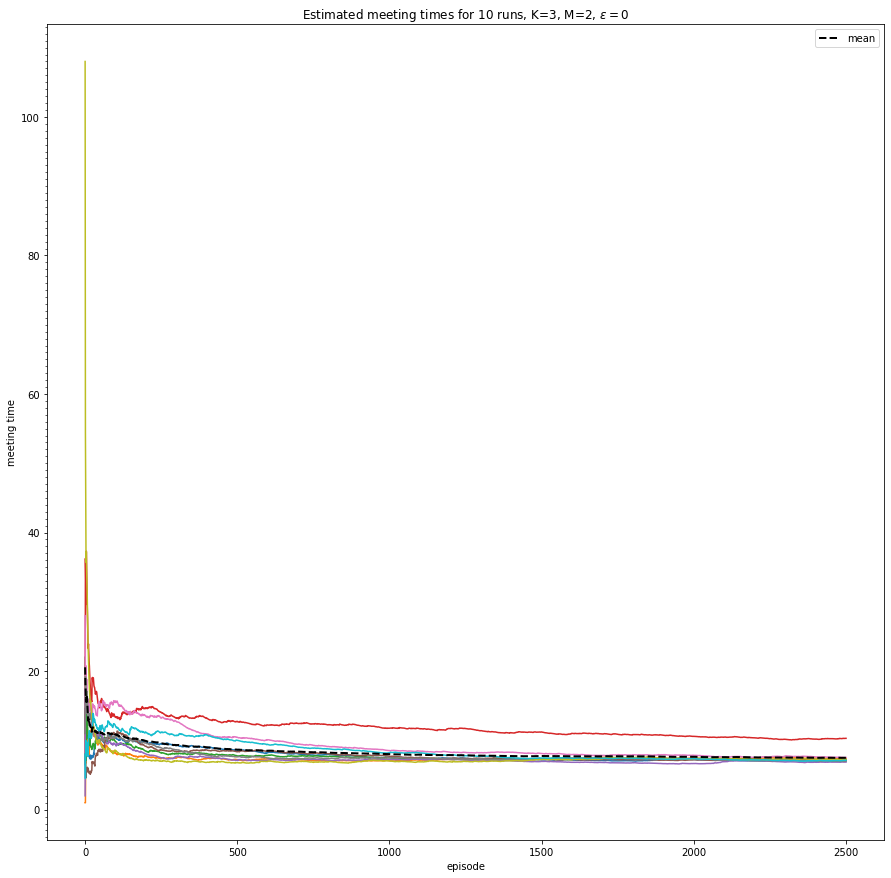

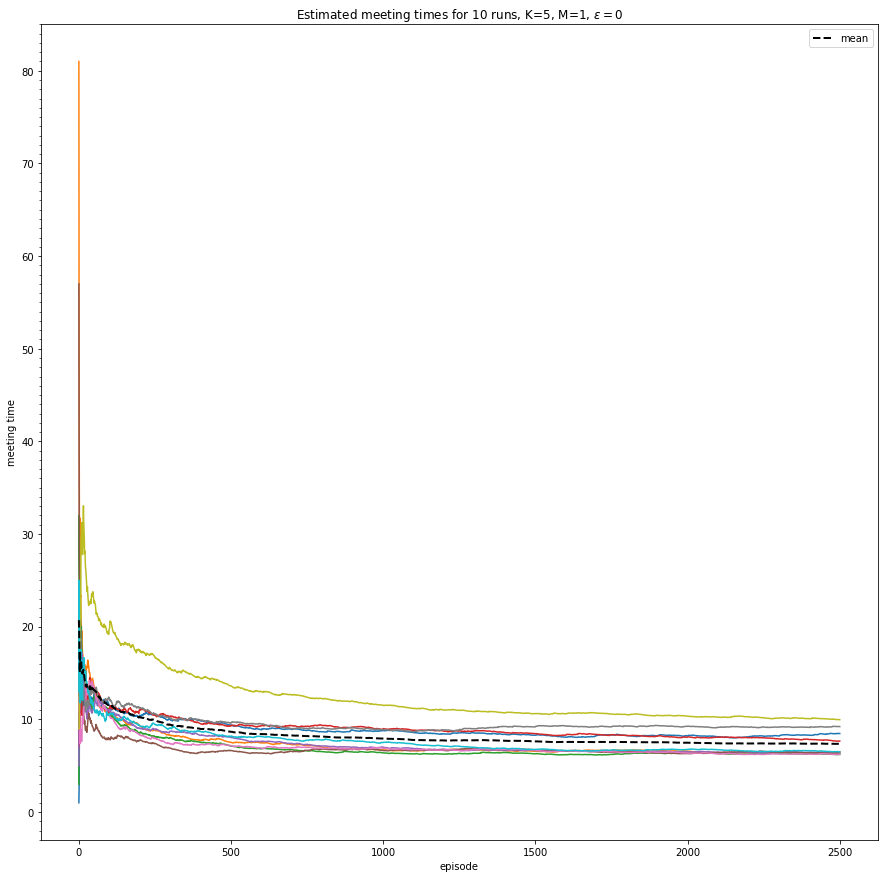

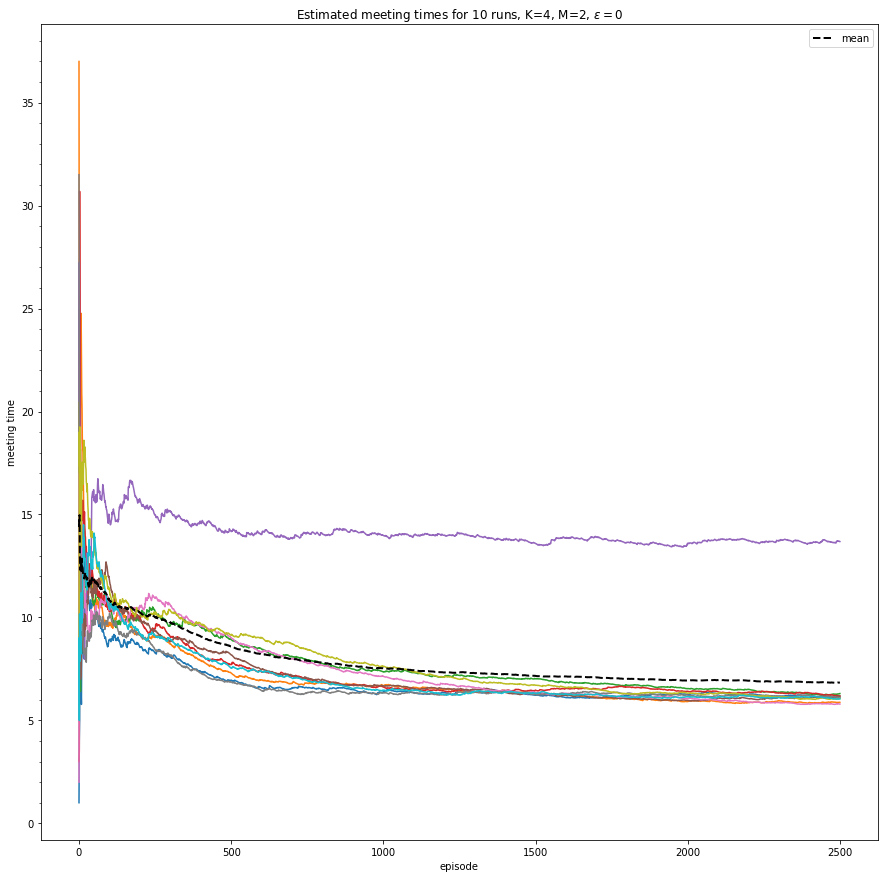

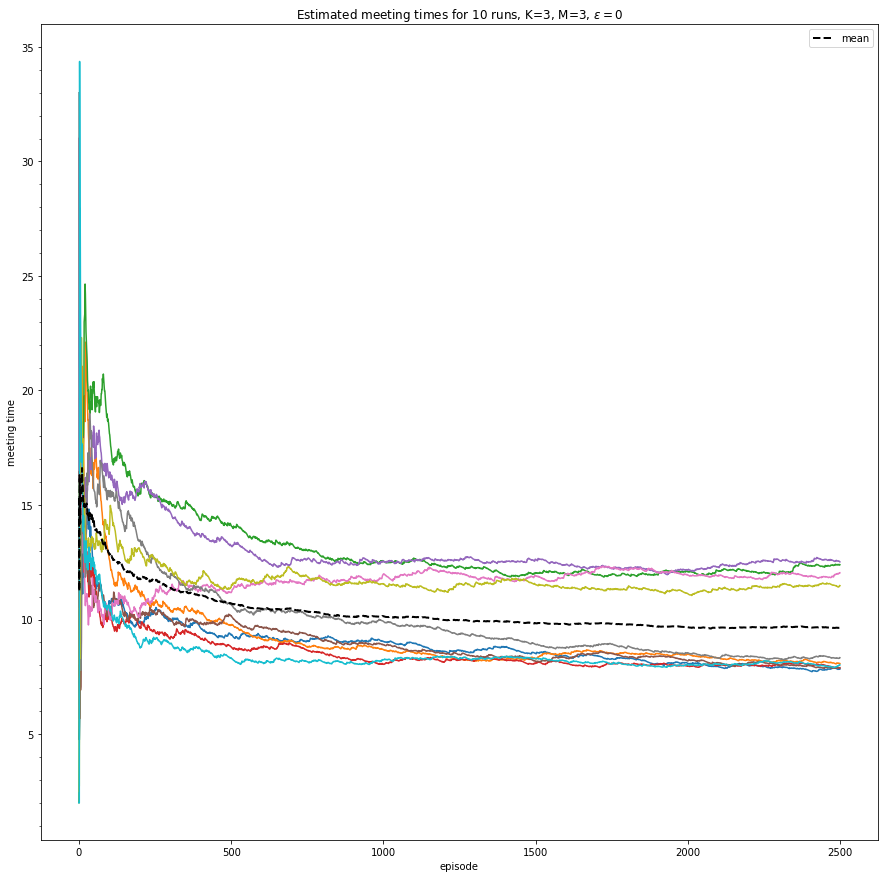

In [ ]:
# load
generator = load_object("all_policies_update_except_K7M1_iter_2501_multiple_runs.pkl")
for obj in generator:  # each obj is a tuple containing the output of one simulation

  policyTests, tmp= obj  # unpack, both are lists/tuples of length 10

  # list of tuples..
  multiple_initial_expected_meeting_time, multiple_episodes_rewards, multiple_meeting_times, multiple_K, multiple_M, multiple_estimated_expected_meeting_times, multiple_epsilon, multiple_n_episodes  = zip(*tmp)

  # print(np.array(multiple_estimated_expected_meeting_times).T.shape, np.mean(np.array(multiple_estimated_expected_meeting_times).T, axis=1).shape)
  # plot all the runs + mean of them
  plot_multiple_runs(n_runs=10, K=multiple_K[0], M=multiple_M[0], epsilon=multiple_epsilon[0], y=np.array(multiple_estimated_expected_meeting_times).T)
  # plot only mean and

  # policyTests[0].plot_tree(d=2)
  # plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, n_episodes=n_episodes)
  # plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, n_episodes=n_episodes, logplot=True)


## Multiple runs : only $K=7, M=1$

In [ ]:
# KM = np.array([[7, 1]]).T
# epsilon = 0  # 0.6

# save_object([simulation_multiple_runs(K=KM[0, j], M=KM[1, j], epsilon=epsilon, n_episodes=2501, n_runs=10) for j in range(KM.shape[1])], "policy_update_K7M1_iter_2501_multiple_runs.pkl")

### $K=7, M=1$
$K=11$ is too much

In [ ]:
K = 7
M = 1
epsilon = 0
policyTest, params_plot = simulate_and_plot(K, M, epsilon=epsilon, n_episodes=20001)

In [ ]:
policyTest.plot_tree(d=2)

In [ ]:
initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes = params_plot  # unpack
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon=epsilon, n_episodes=n_episodes, logplot=True)

The big first spike comes from the first sample meeting time..

In [ ]:
for row in policyTest.tree[:K]:
  print("row", row)
  for node in row:
    print(node.observation, node.probability_vector_over_actions)

In [ ]:
expected_meeting_time(policyTest, K, M)

# Simulations without update (3 actions); default strategies with two phases, no phases and strategies from Improved Bounds article

Strategies with two phases use both $K$ and $M$ for duration of first and duration of second phase respectively. The meaning of $K$ and $M$ can differ.

For strategies from the Improved Bounds article and for the strategies without the two phases, we put the generator length in $K$ in `expected_meeting_time` and $M=0$. Changing $K$ and $M$ but keeping the sum the same changes the expected meeting time computed in the case where policies are updated at the end of each episodes. $M$ won't mean boundary anymore in this case.

## A few default strategies with two phases

### Default strategy for $K=M=1$

expected meeting time of the initial policy: 17.00000000000003
Meeting_time 3.0 for episode: 0
Estimated meeting time: 3.0 for episode: 0
Meeting_time 1.0 for episode: 10000
Estimated meeting time: 16.816218378162212 for episode: 10000
Meeting_time 37.0 for episode: 20000
Estimated meeting time: 16.900204989750442 for episode: 20000


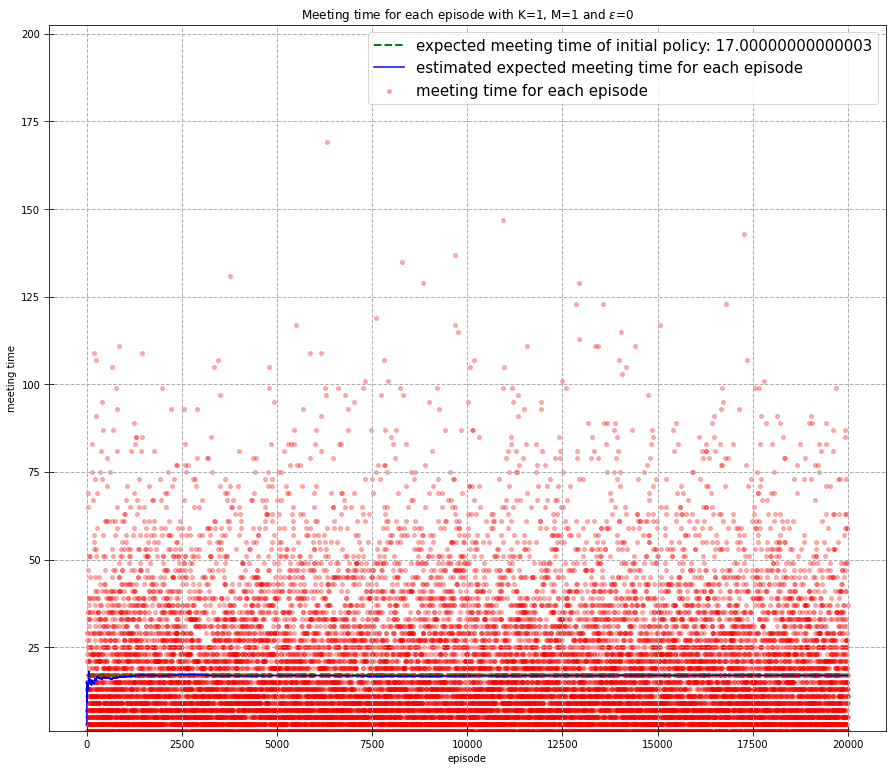

In [ ]:
K = 1
M = 1
policyTest, params_plot = simulate_no_update_and_plot(K, M, n_episodes=20001)

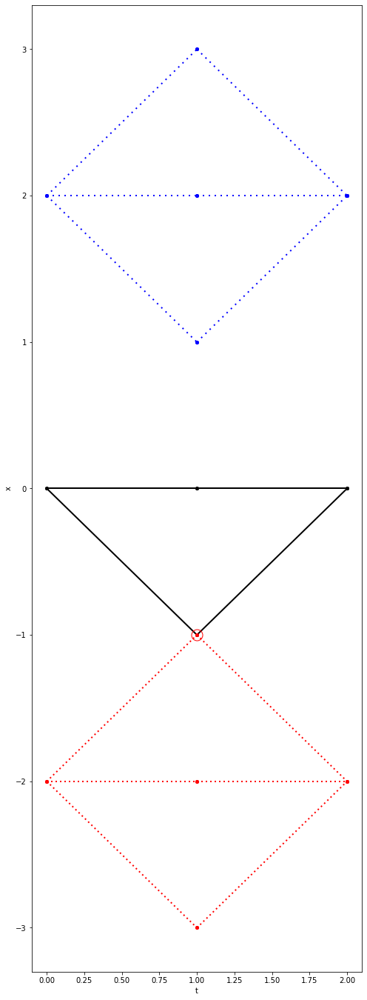

In [ ]:
policyTest.plot_tree(d=2)

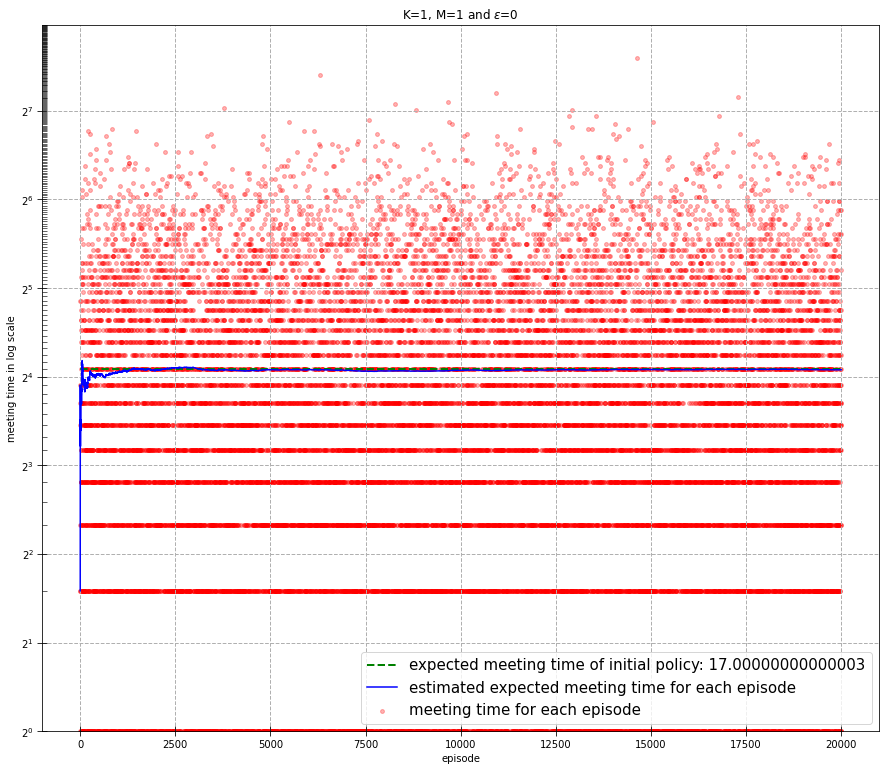

In [ ]:
initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes = params_plot  # unpack
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, n_episodes=20001, logplot=True)

```
expected meeting time of the initial policy: 17.00000000000003
Meeting_time 1.0 for episode: 0
Estimated meeting time: 1.0 for episode: 0
Meeting_time 11.0 for episode: 10000
Estimated meeting time: 17.02479752024797 for episode: 10000
Meeting_time 9.0 for episode: 20000
Estimated meeting time: 17.081295935203148 for episode: 20000
```

### Default strategy for $K=M=2$

expected meeting time of the initial policy: 15.444444444444555
Meeting_time 5.5 for episode: 0
Estimated meeting time: 5.5 for episode: 0
Meeting_time 1.0 for episode: 10000
Estimated meeting time: 15.350664933506701 for episode: 10000
Meeting_time 73.0 for episode: 20000
Estimated meeting time: 15.295685215739162 for episode: 20000


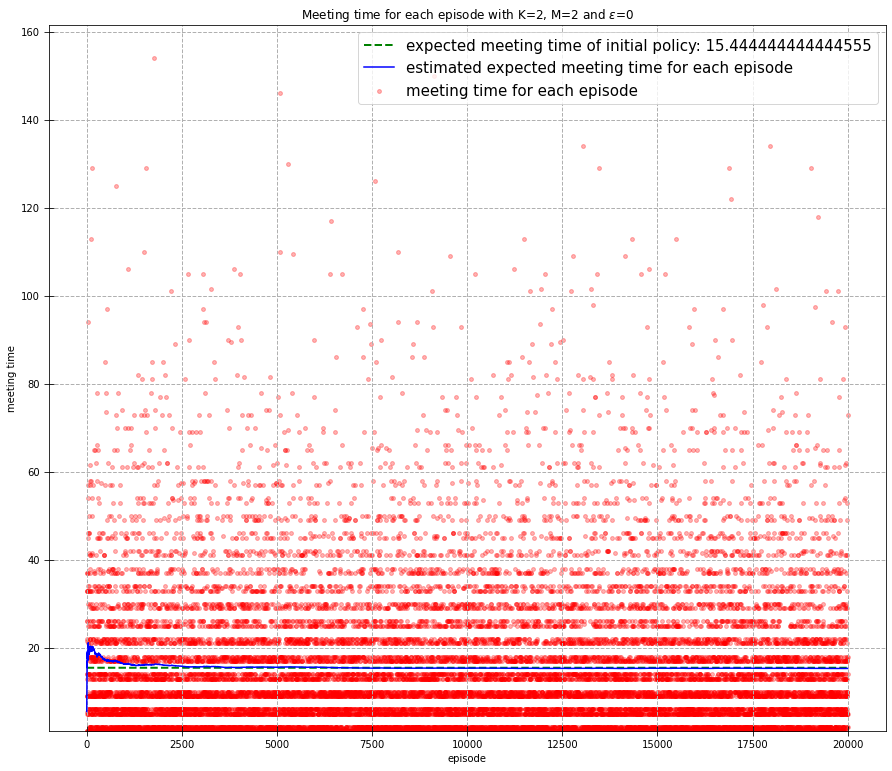

In [ ]:
K = 2
M = 2
policyTest, params_plot = simulate_no_update_and_plot(K, M, n_episodes=20001)

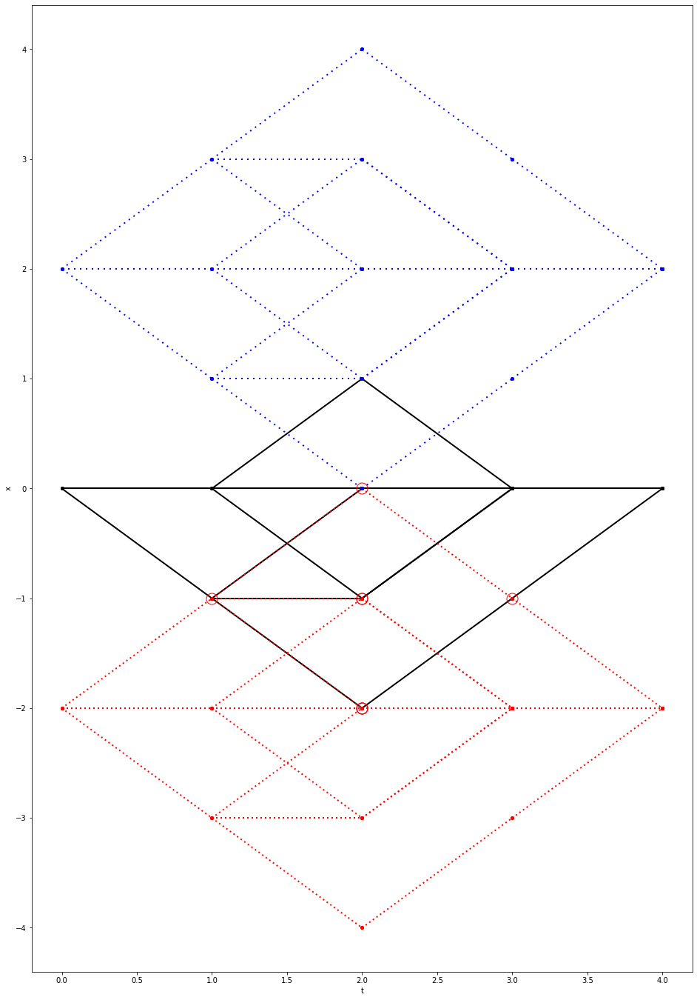

In [ ]:
policyTest.plot_tree(d=2)

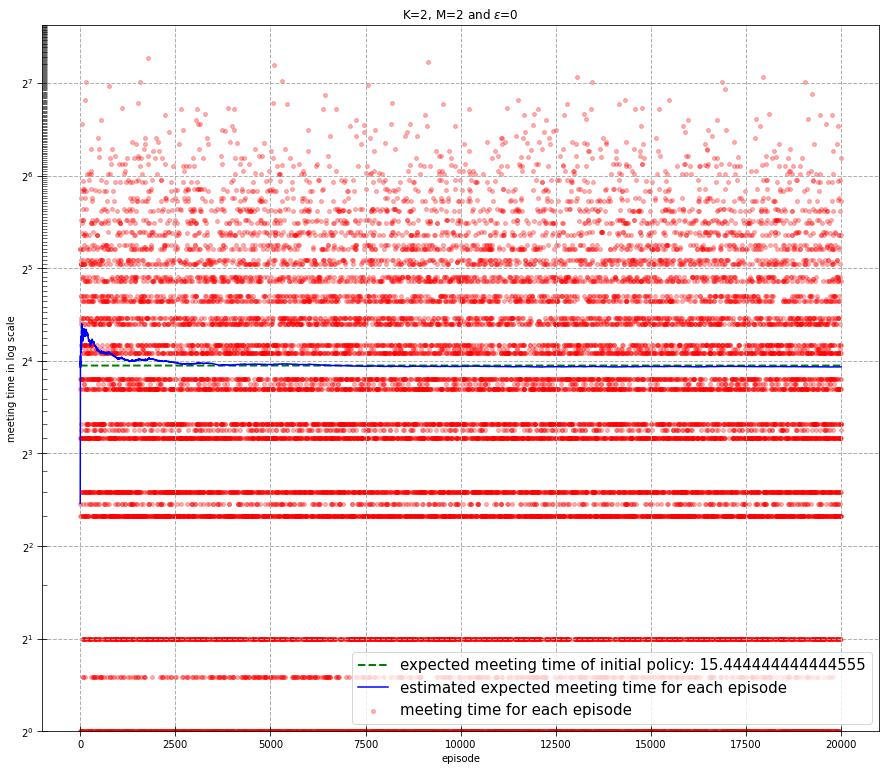

In [ ]:
initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes = params_plot  # unpack
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, n_episodes=20001, logplot=True)

```
expected meeting time of the initial policy: 15.444444444444555
Meeting_time 5.0 for episode: 0
Estimated meeting time: 5.0 for episode: 0
Meeting_time 49.0 for episode: 10000
Estimated meeting time: 15.678282171782813 for episode: 10000
Meeting_time 13.0 for episode: 20000
Estimated meeting time: 15.751737413129256 for episode: 20000
```

## Policy with $R=5$ : {-1,1,1}, {1,-1,-1} (proba $1/2$ of choosing one of them)

Maybe modify a bit my function to not use $K$ and $M$. We put the generator length in $K$ in `expected_meeting_time` and the simulation so as exception $M=0$ and does not affect anything because it's only used for other policies. No boundary.

p1=1/2, p-1=1/2, p1,-1=1, p-1,1 = 1 p1,-1,-1=1, p-1,1,1=1 and the rest are 0 proba

In [ ]:
def PolicyTree5():
  """
  {1, -1, -1}, {-1, 1, 1} from Improved Bounds articl
  """

  # Recall tree_depth is the time limit
  policyTreeDataStructure = PolicyTree(np.array([]), np.array([-1, 0, 1]), tree_depth=3)

  # Need to define for all actions otherwise, we might have weird results
  # first action
  policyTreeDataStructure.root.probability_vector_over_actions = np.array([1/2, 0, 1/2])  # 1 for p_{-1}, same for p_1
  # last action : Left and Right
  policyTreeDataStructure.root.children[0].probability_vector_over_actions = np.array([0, 0, 1])  # 0 for p_{-1,-1}, 1 for p_{-1,1}
  policyTreeDataStructure.root.children[2].probability_vector_over_actions = np.array([1, 0, 0])  # 0 for p_{1,-1}, 1 for p_{1,1}

  # Third/last action
  # Left Left : Not reachable
  # Left Right
  policyTreeDataStructure.root.children[0].children[2].probability_vector_over_actions = np.array([0, 0, 1])  # 1 for p_{-1,1,1}

  # Right Right : Not reachable
  # Right Left
  policyTreeDataStructure.root.children[2].children[0].probability_vector_over_actions = np.array([1, 0, 0])  # 1 for p_{1,-1,-1}

  return policyTreeDataStructure

In [ ]:
K = 3
M = 0
policyTest = PolicyTree5()
initial_expected_meeting_time = expected_meeting_time(policyTest, K, M)
print(f"expected meeting time of the policy: {initial_expected_meeting_time}")

expected meeting time of the policy: 5.0


We must get : `5.0`


In [ ]:
episodes_rewards, meeting_times, estimated_expected_meeting_times = simulate_no_update_helper(policyTest, d=2, K=K, M=M, n_episodes=20001)

Meeting_time 1.0 for episode: 0
Estimated meeting time: 1.0 for episode: 0
Meeting_time 4.0 for episode: 10000
Estimated meeting time: 4.951604839516054 for episode: 10000
Meeting_time 1.0 for episode: 20000
Estimated meeting time: 5.007149642517875 for episode: 20000


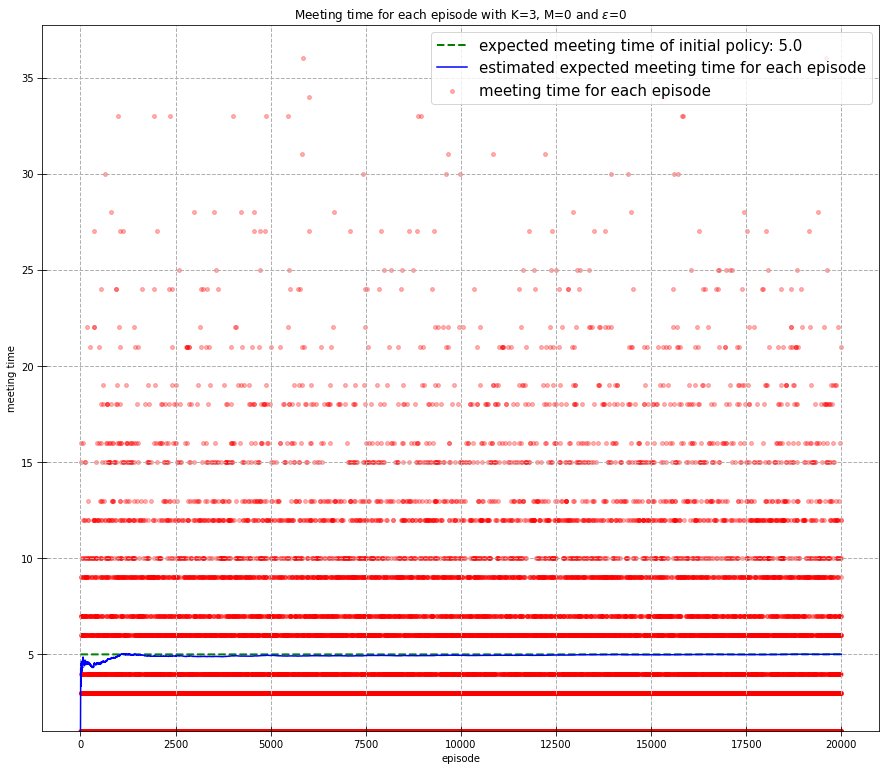

In [ ]:
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes)

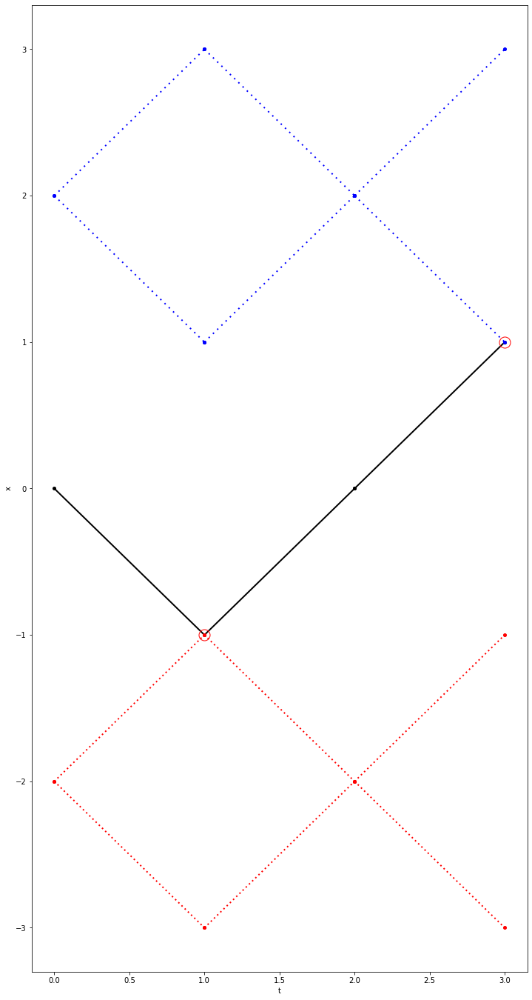

In [ ]:
policyTest.plot_tree(d=2)

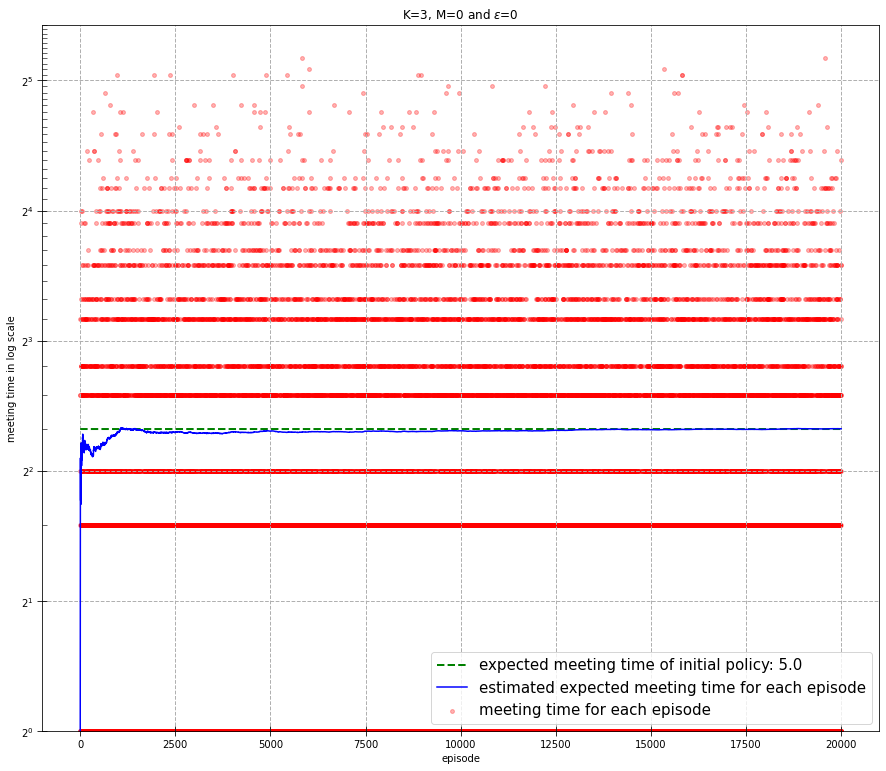

In [ ]:
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes, logplot=True)

```
Meeting_time 1 for episode: 0
Estimated meeting time: 1.0 for episode: 0
Meeting_time 6 for episode: 10000
Estimated meeting time: 5.019698030196995 for episode: 10000
Meeting_time 3 for episode: 20000
Estimated meeting time: 5.017199140042973 for episode: 20000
Meeting_time 4 for episode: 30000
Estimated meeting time: 5.009066364454504 for episode: 30000
Meeting_time 9 for episode: 40000
Estimated meeting time: 4.996175095622607 for episode: 40000
```

## Policy with $R=7$ : {-1,1}, {1,-1} (proba $1/2$ of choosing one of them)

p1=1/2, p-1=1/2, p1,-1=1, p-1,1 = 1 and the rest are 0 proba

In [ ]:
def PolicyTree7():
  """
  {1, -1}, {-1, 1} from Improved Bounds article
  """
  # Recall tree_depth is the time limit
  policyTreeDataStructure = PolicyTree(np.array([]),  np.array([-1, 0, 1]), tree_depth=2)

  # Need to define for all actions otherwise, we might have weird results
  # first action
  policyTreeDataStructure.root.probability_vector_over_actions = np.array([1/2, 0, 1/2])  # 1 for p_{-1}, same for p_1
  # last action : Left and Right
  policyTreeDataStructure.root.children[0].probability_vector_over_actions = np.array([0, 0, 1])  # 0 for p_{-1,-1}, 1 for p_{-1,1}
  policyTreeDataStructure.root.children[2].probability_vector_over_actions = np.array([1, 0, 0])  # 0 for p_{1,-1}, 1 for p_{1,1}

  return policyTreeDataStructure

In [ ]:
K = 2
M = 0
policyTest = PolicyTree7()
initial_expected_meeting_time = expected_meeting_time(policyTest, K, M)
print(f"expected meeting time of the policy: {initial_expected_meeting_time}")

expected meeting time of the policy: 7.0


We must get : `7.0`


In [ ]:
episodes_rewards, meeting_times, estimated_expected_meeting_times = simulate_no_update_helper(policyTest, d=2, K=K, M=M, n_episodes=20001)

Meeting_time 1.0 for episode: 0
Estimated meeting time: 1.0 for episode: 0
Meeting_time 13.0 for episode: 10000
Estimated meeting time: 6.931206879312029 for episode: 10000
Meeting_time 3.0 for episode: 20000
Estimated meeting time: 6.925303734813199 for episode: 20000


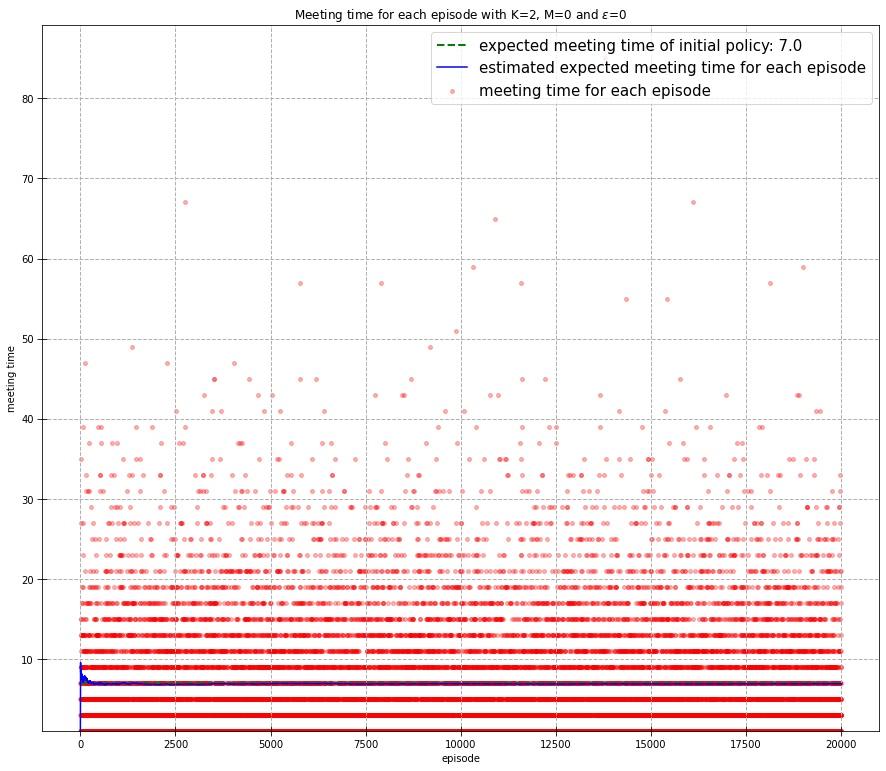

In [ ]:
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes)

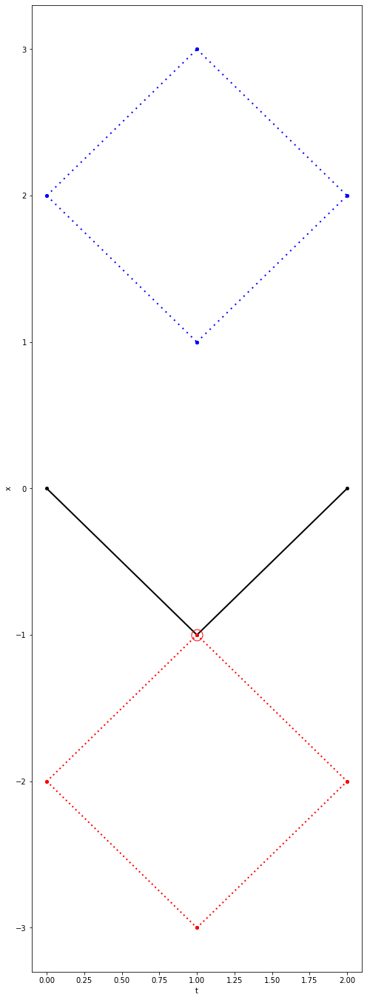

In [ ]:
policyTest.plot_tree(d=2)

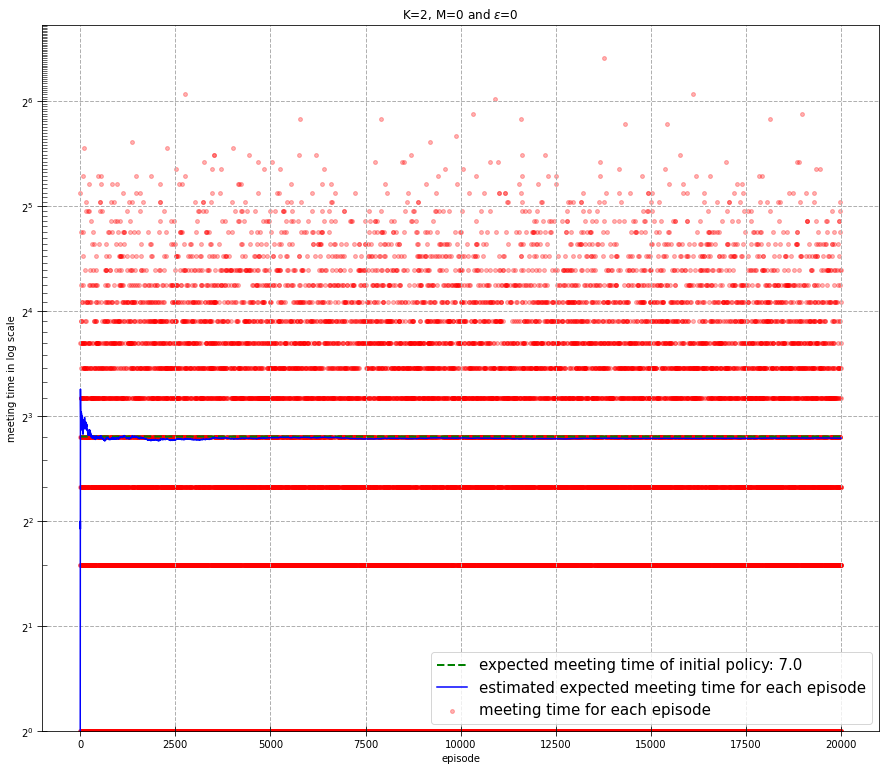

In [ ]:
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes, logplot=True)

```
Meeting_time 3 for episode: 0
Estimated meeting time: 3.0 for episode: 0
Meeting_time 3 for episode: 10000
Estimated meeting time: 6.944405559444025 for episode: 10000
Meeting_time 1 for episode: 20000
Estimated meeting time: 7.004099795010181 for episode: 20000
Meeting_time 1 for episode: 30000
Estimated meeting time: 6.9764007866403706 for episode: 30000
Meeting_time 47 for episode: 40000
Estimated meeting time: 6.988450288742739 for episode: 40000
Meeting_time 5 for episode: 50000
Estimated meeting time: 6.988960220795569 for episode: 50000
```

## Policy with $R=5.9441$ : {1,1,-1,-1}, {1,-1,-1,1} with proba $0.1118$ and $0.8882$ respectively

### First test

p1=1

p-1=0

p11=0.1118

p1-1=0.8882

p11-1=1

p1-1-1=1

p11-1-1=1

p1-1-11=1

and the rest are 0 proba.

**Normally we can also do {-1,-1,1,1}, {-1,1,1,-1} but we ignored the $F$ (forward) changing at each "repetitions". It might give a different result than with $F$ changing (see my old code):**

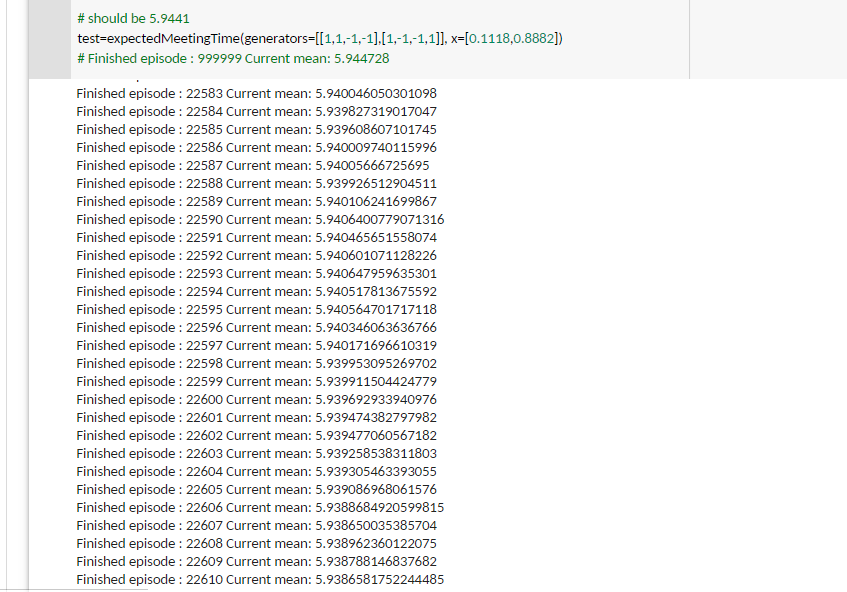

In [ ]:
def PolicyTreeNot5dot9441():
  """
  {1, 1, -1, -1}, {1, -1, -1,1} without "F"  changing
  """
  # Recall tree_depth is the time limit
  policyTreeDataStructure = PolicyTree(np.array([]), np.array([-1, 0, 1]), tree_depth=4)

  # first action --------------------------------------------------------------------------------------------------------------
  policyTreeDataStructure.root.probability_vector_over_actions = np.array([0, 0, 1])  # 1 for p_1
  # second action --------------------------------------------------------------------------------------------------------------
  # Left : not reachable : policyTreeDataStructure.root.children[0]
  # Right
  policyTreeDataStructure.root.children[2].probability_vector_over_actions = np.array([0.8882, 0, 0.1118])  # 0.8882 for p_{1,-1}, 0.1118 for p_{1,1}

  # Third action
  # Left -etc.- : Not reachable

  # Right Right
  policyTreeDataStructure.root.children[2].children[2].probability_vector_over_actions = np.array([1, 0, 0])  # 1 for p_{1,1,-1}
  # Right Left
  policyTreeDataStructure.root.children[2].children[0].probability_vector_over_actions = np.array([1, 0, 0])  # 1 for p_{1,-1,-1}

  # Fourth/Last action
  # Right Right Left
  policyTreeDataStructure.root.children[2].children[2].children[0].probability_vector_over_actions = np.array([1, 0, 0])  # p11-1-1=1
  # Right Left Left
  policyTreeDataStructure.root.children[2].children[0].children[0].probability_vector_over_actions = np.array([0, 0, 1])  # p1-1-11=1

  return policyTreeDataStructure

In [ ]:
K = 4
M = 0
policyTest = PolicyTreeNot5dot9441()
initial_expected_meeting_time = expected_meeting_time(policyTest, K, M)
print(f"expected meeting time of the policy: {initial_expected_meeting_time}")

expected meeting time of the policy: 38.281665517967845


We must get : `5.9441`  but we got `38.281665517967845` and it's normal because we do not flip $F$ or do not have $1/2$ for p1, p-1 (see second test)


We put the generator length in $K$ in `expected_meeting_time` and the simulation so as exception $M=0$ and does not affect anything because it's only used for other policies. No boundary.

In [ ]:
episodes_rewards, meeting_times, estimated_expected_meeting_times = simulate_no_update_helper(policyTest, d=2, K=K, M=M, n_episodes=20001)

Meeting_time 10.0 for episode: 0
Estimated meeting time: 10.0 for episode: 0
Meeting_time 2.0 for episode: 10000
Estimated meeting time: 38.058394160583795 for episode: 10000
Meeting_time 2.0 for episode: 20000
Estimated meeting time: 38.388580570971364 for episode: 20000


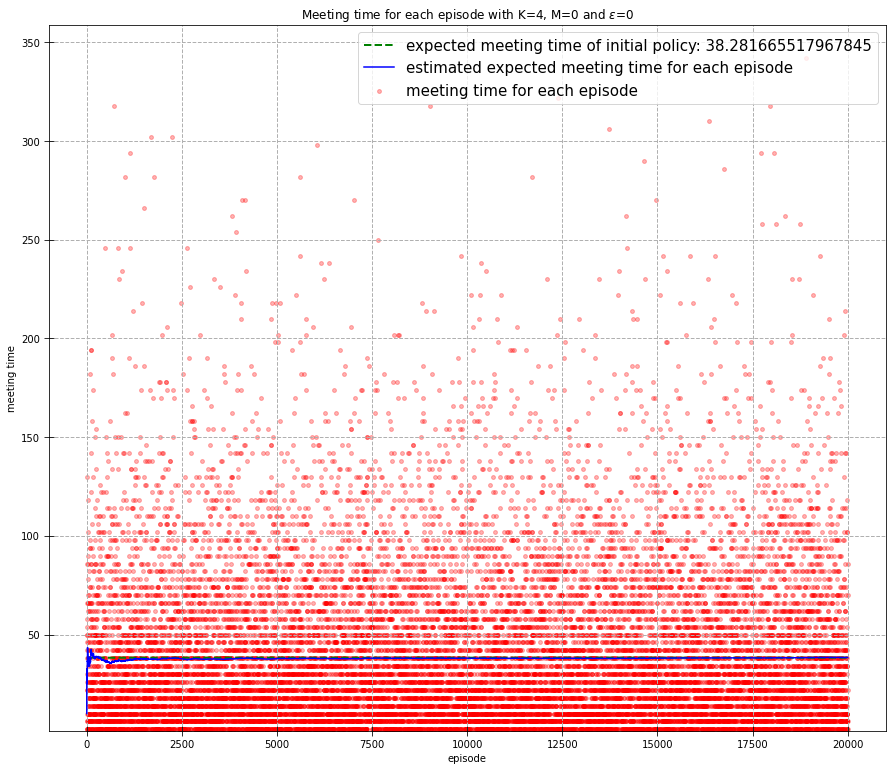

In [ ]:
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes)

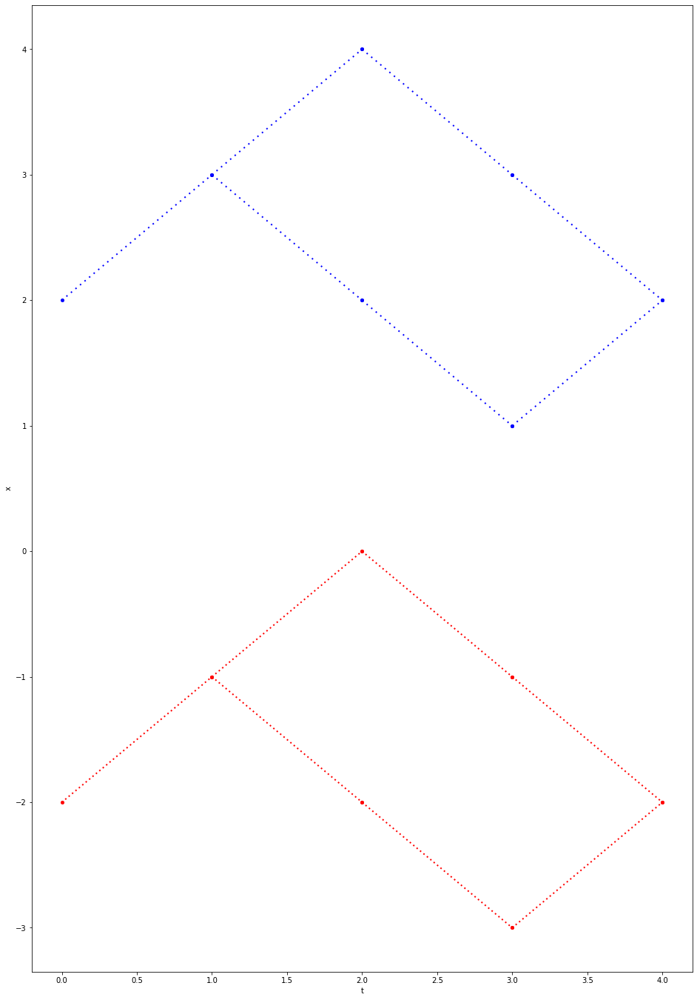

In [ ]:
policyTest.plot_tree(d=2)

**No plot of the black line because it's not a symmetric policy**

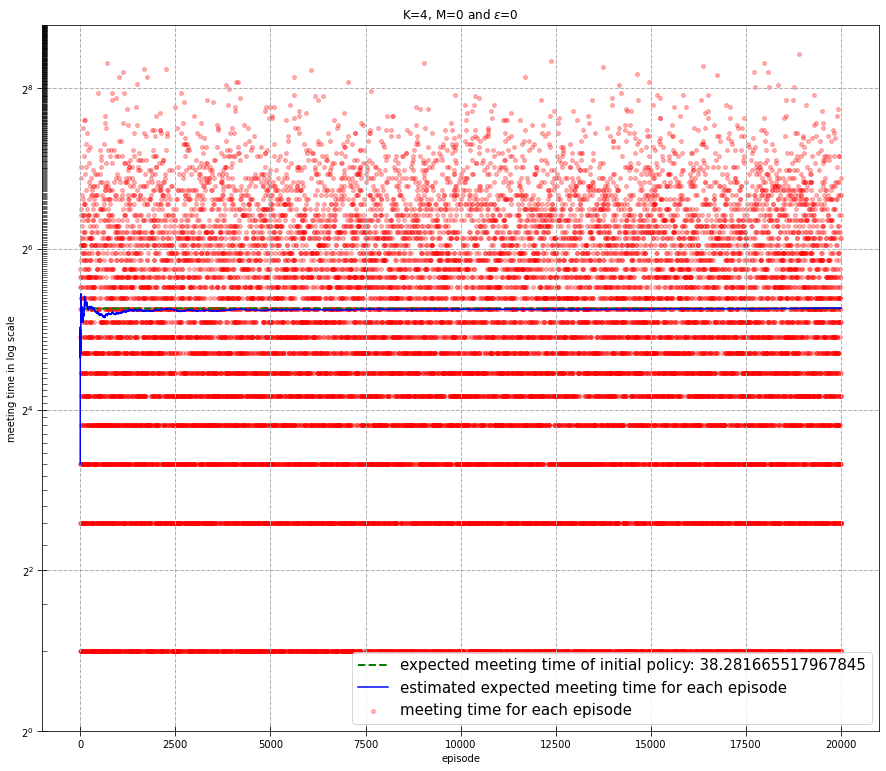

In [ ]:
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes, logplot=True)

```
Meeting_time 82 for episode: 0
Estimated meeting time: 82.0 for episode: 0
Meeting_time 22 for episode: 10000
Estimated meeting time: 38.061993800619796 for episode: 10000
Meeting_time 50 for episode: 20000
Estimated meeting time: 38.1953902304886 for episode: 20000
Meeting_time 14 for episode: 30000
Estimated meeting time: 38.26479117362715 for episode: 30000
Meeting_time 10 for episode: 40000
Estimated meeting time: 38.172995675107806 for episode: 40000
Meeting_time 2 for episode: 50000
Estimated meeting time: 38.24015519689591 for episode: 50000
Meeting_time 14 for episode: 60000
Estimated meeting time: 38.229196180063546 for episode: 60000
Meeting_time 42 for episode: 70000
Estimated meeting time: 38.14788360166303 for episode: 70000
Meeting_time 110 for episode: 80000
Estimated meeting time: 38.125098436269795 for episode: 80000
Meeting_time 42 for episode: 90000
Estimated meeting time: 38.18435350718338 for episode: 90000
Meeting_time 10 for episode: 100000
Estimated meeting time: 38.216157838421694 for episode: 100000
Meeting_time 6 for episode: 110000
Estimated meeting time: 38.26567031208821 for episode: 110000
Meeting_time 14 for episode: 120000
Estimated meeting time: 38.210731577236956 for episode: 120000
Meeting_time 6 for episode: 130000
Estimated meeting time: 38.21316759101899 for episode: 130000
Meeting_time 30 for episode: 140000
Estimated meeting time: 38.262369554503714 for episode: 140000
Meeting_time 6 for episode: 150000
Estimated meeting time: 38.289091406057885 for episode: 150000
Meeting_time 90 for episode: 160000
Estimated meeting time: 38.24999843751015 for episode: 160000
Meeting_time 26 for episode: 170000
Estimated meeting time: 38.27352780277817 for episode: 170000
Meeting_time 18 for episode: 180000
Estimated meeting time: 38.239065338526274 for episode: 180000
Meeting_time 26 for episode: 190000
Estimated meeting time: 38.22456723912035 for episode: 190000
Meeting_time 70 for episode: 200000
Estimated meeting time: 38.25001874990657 for episode: 200000
Meeting_time 38 for episode: 210000
Estimated meeting time: 38.25497021442749 for episode: 210000
Meeting_time 10 for episode: 220000
Estimated meeting time: 38.24007163603784 for episode: 220000
Meeting_time 34 for episode: 230000
Estimated meeting time: 38.224190329607126 for episode: 230000
Meeting_time 6 for episode: 240000
Estimated meeting time: 38.22934904437889 for episode: 240000
Meeting_time 18 for episode: 250000
Estimated meeting time: 38.226991092035725 for episode: 250000
Meeting_time 14 for episode: 260000
Estimated meeting time: 38.235583709293614 for episode: 260000
```

### Second test

**p1=1/2
, p-1=1/2**

(p11=0.1118

p1-1=0.8882

p11-1=1

p1-1-1=1

p11-1-1=1

p1-1-11=1) similar for the flipped signs

and the rest are 0 proba.

In [ ]:
def PolicyTree5dot9441():
  """
  {1, 1, -1, -1}, {1, -1, -1,1} from Improved Bounds article (1/2 proba of doing -1*(what I wrote on the left))
  """
  # Recall tree_depth is the time limit
  policyTreeDataStructure = PolicyTree(np.array([]), np.array([-1, 0, 1]), tree_depth=4)

  # first action --------------------------------------------------------------------------------------------------------------
  policyTreeDataStructure.root.probability_vector_over_actions = np.array([1/2, 0, 1/2])  # 1/2 for p_1
  # second action --------------------------------------------------------------------------------------------------------------
  ##########################################
  # Left
  policyTreeDataStructure.root.children[0].probability_vector_over_actions = np.array([0.1118, 0, 0.8882])  # flipped the one below # 0.8882 for p_{-1,1}, 0.1118 for p_{-1,-1}
  ##########################################
  #  -----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
  # Right
  policyTreeDataStructure.root.children[2].probability_vector_over_actions = np.array([0.8882, 0, 0.1118])  # 0.8882 for p_{1,-1}, 0.1118 for p_{1,1}

  # Third action
  ##########################################
  # Left -etc.- : flipped the Right -etc.-
  # Left Left
  policyTreeDataStructure.root.children[0].children[0].probability_vector_over_actions = np.array([0, 0, 1])  # 1 for p_{-1,-1, 1}
  # Left Right
  policyTreeDataStructure.root.children[0].children[2].probability_vector_over_actions = np.array([0, 0, 1])  # 1 for p_{-1,1,1}

  # Fourth/Last action
  # Left Left Right
  policyTreeDataStructure.root.children[0].children[0].children[2].probability_vector_over_actions = np.array([0, 0, 1])  # p1-1-11=1
  # Left Right Right
  policyTreeDataStructure.root.children[0].children[2].children[2].probability_vector_over_actions = np.array([1, 0, 0])  # p-111-1=1
  ##########################################

  #  -----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
  # Right Right
  policyTreeDataStructure.root.children[2].children[2].probability_vector_over_actions = np.array([1, 0, 0])  # 1 for p_{1,1,-1}
  # Right Left
  policyTreeDataStructure.root.children[2].children[0].probability_vector_over_actions = np.array([1, 0, 0])  # 1 for p_{1,-1,-1}

  # Fourth/Last action
  # Right Right Left
  policyTreeDataStructure.root.children[2].children[2].children[0].probability_vector_over_actions = np.array([1, 0, 0])  # p11-1-1=1
  # Right Left Left
  policyTreeDataStructure.root.children[2].children[0].children[0].probability_vector_over_actions = np.array([0, 0, 1])  # p1-1-11=1

  return policyTreeDataStructure

In [ ]:
test = PolicyTree5dot9441()
test.print_tree()

row [<__main__.NodePolicyTree object at 0x7f64c77c6990>]
[] [0.5 0.  0.5]
row [<__main__.NodePolicyTree object at 0x7f64c77c64d0>, <__main__.NodePolicyTree object at 0x7f64c77c6e10>, <__main__.NodePolicyTree object at 0x7f64c77c6ad0>]
[[-1.]] [0.1118 0.     0.8882]
[[0.]] [0.33333333 0.33333333 0.33333333]
[[1.]] [0.8882 0.     0.1118]
row [<__main__.NodePolicyTree object at 0x7f64c77c6750>, <__main__.NodePolicyTree object at 0x7f64c77c6290>, <__main__.NodePolicyTree object at 0x7f64c77c61d0>, <__main__.NodePolicyTree object at 0x7f64c77c6a10>, <__main__.NodePolicyTree object at 0x7f64c77c6510>, <__main__.NodePolicyTree object at 0x7f64c77c6810>, <__main__.NodePolicyTree object at 0x7f64c77c6dd0>, <__main__.NodePolicyTree object at 0x7f64c6f88a10>, <__main__.NodePolicyTree object at 0x7f64c6f88f10>]
[[-1. -1.]] [0 0 1]
[[-1.  0.]] [0.33333333 0.33333333 0.33333333]
[[-1.  1.]] [0 0 1]
[[ 0. -1.]] [0.33333333 0.33333333 0.33333333]
[[0. 0.]] [0.33333333 0.33333333 0.33333333]
[[0. 1.]] 

In [ ]:
K = 4
M = 0
policyTest = PolicyTree5dot9441()
initial_expected_meeting_time = expected_meeting_time(policyTest, K, M)
print(f"expected meeting time of the policy: {initial_expected_meeting_time}")

expected meeting time of the policy: 5.944097208798049


We must get about: `5.9441`

We put the generator length in $K$ in `expected_meeting_time` and the simulation so as exception $M=0$ and does not affect anything because it's only used for other policies. No boundary.

In [ ]:
episodes_rewards, meeting_times, estimated_expected_meeting_times = simulate_no_update_helper(policyTest, d=2, K=K, M=M, n_episodes=20001)

Meeting_time 3.0 for episode: 0
Estimated meeting time: 3.0 for episode: 0
Meeting_time 2.0 for episode: 10000
Estimated meeting time: 5.936006399360048 for episode: 10000
Meeting_time 9.0 for episode: 20000
Estimated meeting time: 5.928653567321568 for episode: 20000


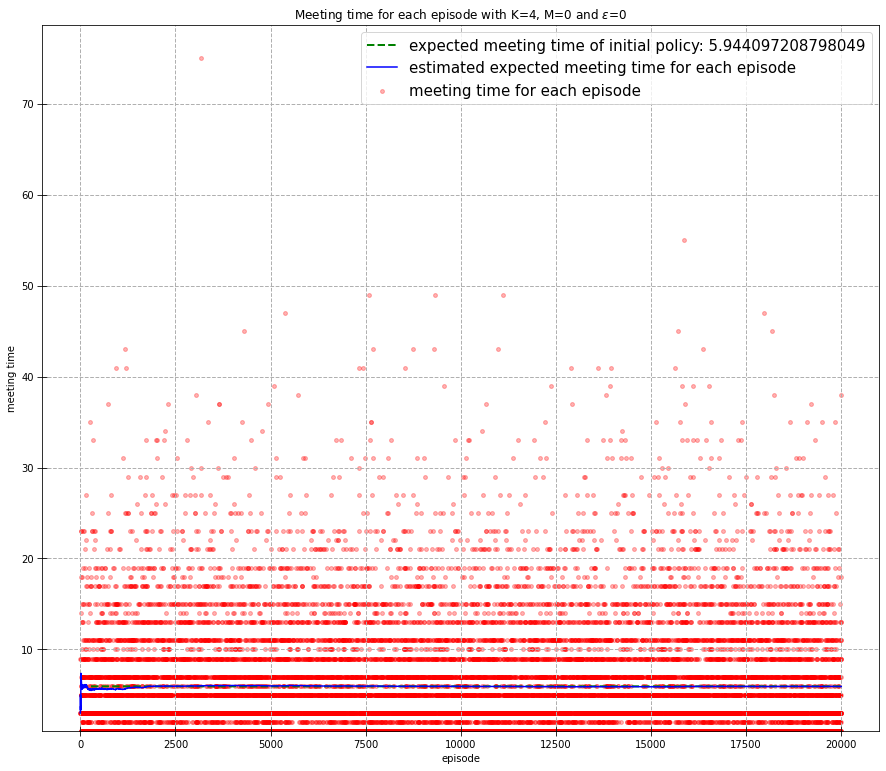

In [ ]:
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes)

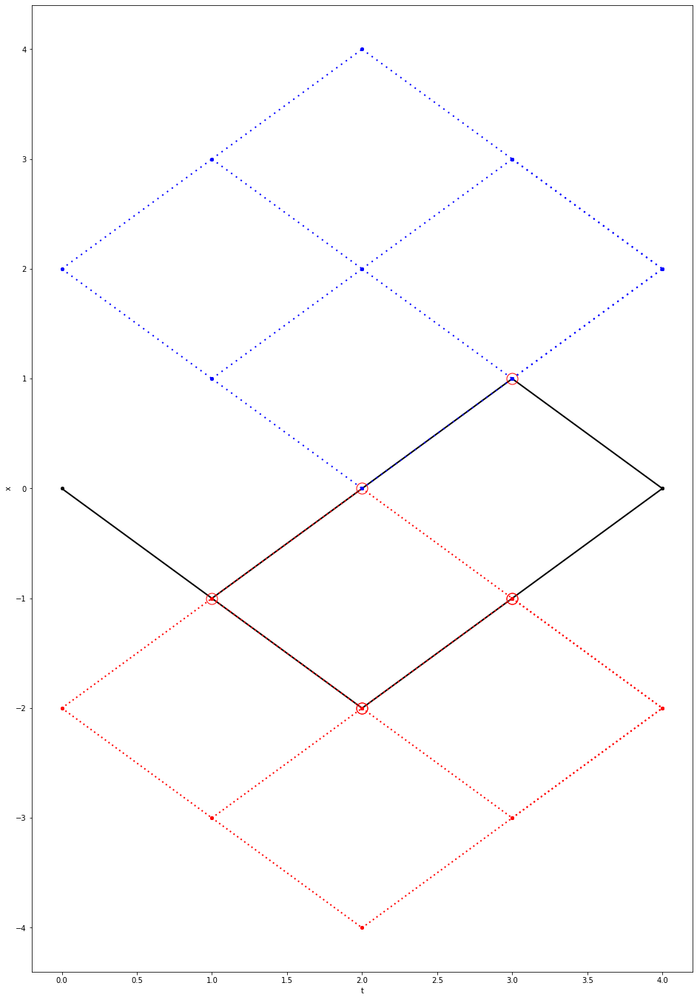

In [ ]:
policyTest.plot_tree(d=2)

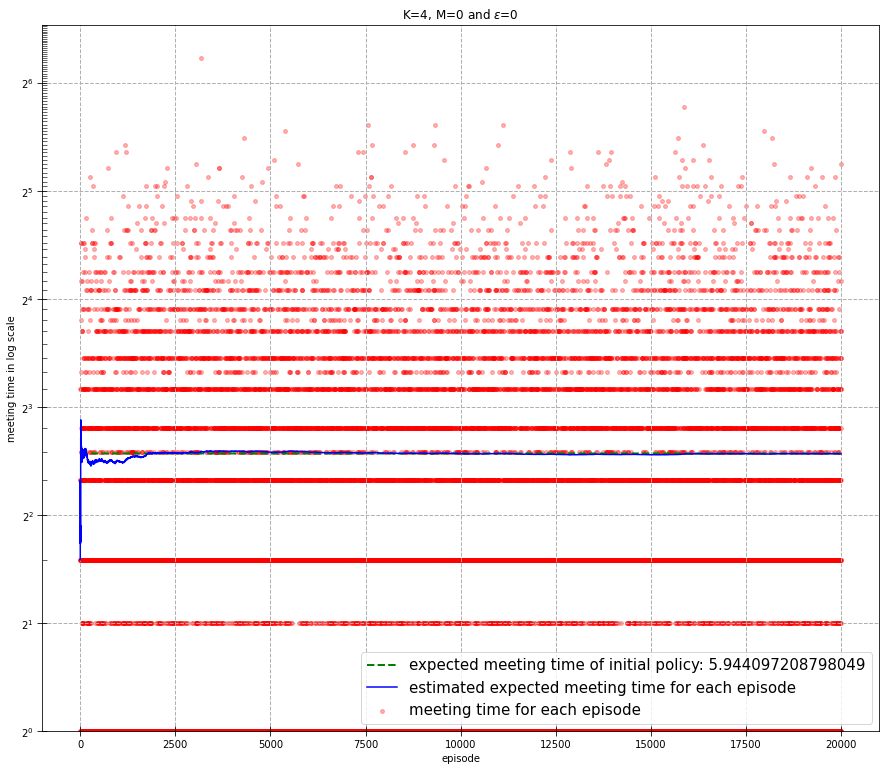

In [ ]:
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes, logplot=True)

```
Meeting_time 3 for episode: 0
Estimated meeting time: 3.0 for episode: 0
Meeting_time 3 for episode: 10000
Estimated meeting time: 5.95020497950204 for episode: 10000
Meeting_time 3 for episode: 20000
Estimated meeting time: 5.939303034848258 for episode: 20000
Meeting_time 3 for episode: 30000
Estimated meeting time: 5.925702476584104 for episode: 30000
Meeting_time 2 for episode: 40000
Estimated meeting time: 5.940501487462839 for episode: 40000
Meeting_time 1 for episode: 50000
Estimated meeting time: 5.929381412371781 for episode: 50000
```

## (3 actions) Policy with $R = 10$ : {1,-1,0}, {-1,1,0} (proba $1/2$ of choosing one of them) (not in Improved Bounds article)

Si la stratégie mixe distance preserving utilise {1,-1,0} (pas dans l'article), on a $E[T]=10$.
On peut le calculer directement car c'est un *3Markovian* (car $m=M=1$ et $K=2$)et distance preserving.
On a (probablement avec abus de notations..):
$$E[T]=\frac{1}{2}E[T | action_1(t=1)=1] +\frac{1}{2} E[T | action_1(t=1)=-1]=  E[T | action_1(t=1)=-1]$$

$$E[T | action_1(t=1)=-1]=P(\textrm{RDV t=1}) \cdot 1 + P(\textrm{RDV t > 3}) \cdot ( 3 +E[T] )=\frac{1}{2} \cdot \frac{1}{2} \cdot 1 + \frac{3}{4} \cdot (3 + E[T])$$

$$E[T] (1-\frac{3}{4})=\frac{E[T]}{4}=\frac{1}{4} + \frac{9}{4}$$

Et donc on voit que juste avec un seul pas de temps avec "0" comme action, on augmente considérablement le temps moyen de rencontre (de $7$ (voir article) à $10$)


In [ ]:
def PolicyTree10():
  """
  {1, -1, 0}, {-1, 1, 0}
  """
  # Recall tree_depth is the time limit
  policyTreeDataStructure = PolicyTree(np.array([]), np.array([-1, 0, 1]), tree_depth=3)  # 3 actions

  # careful about the indexes due to the number of actions available
  # first action
  policyTreeDataStructure.root.probability_vector_over_actions = np.array([1/2, 0, 1/2])  # 1 for p_{-1}, same for p_1
  # second action : Left and Right
  policyTreeDataStructure.root.children[0].probability_vector_over_actions = np.array([0, 0, 1])  # 0 for p_{-1,-1}, 1 for p_{-1,1}
  policyTreeDataStructure.root.children[2].probability_vector_over_actions = np.array([1, 0, 0])  # 0 for p_{1,-1}, 1 for p_{1,1}

  # Third/last action
  # Left Left : Not reachable
  # Left Right
  policyTreeDataStructure.root.children[0].children[2].probability_vector_over_actions = np.array([0, 1, 0])  # 1 for p_{-1,1,0}

  # Right Right : Not reachable
  # Right Left
  policyTreeDataStructure.root.children[2].children[0].probability_vector_over_actions = np.array([0, 1, 0])  # 1 for p_{1,-1,0}

  return policyTreeDataStructure

In [ ]:
K = 3
M = 0
policyTest = PolicyTree10()
initial_expected_meeting_time = expected_meeting_time(policyTest, K, M)
print(f"expected meeting time of the policy: {initial_expected_meeting_time}")

expected meeting time of the policy: 10.0


We must get : `10`

We put the generator length in $K$ in `expected_meeting_time` and the simulation so as exception $M=0$ and does not affect anything because it's only used for other policies. No boundary.

In [ ]:
episodes_rewards, meeting_times, estimated_expected_meeting_times = simulate_no_update_helper(policyTest, d=2, K=K, M=M, n_episodes=20001)

Meeting_time 4.0 for episode: 0
Estimated meeting time: 4.0 for episode: 0
Meeting_time 7.0 for episode: 10000
Estimated meeting time: 9.99550044995507 for episode: 10000
Meeting_time 1.0 for episode: 20000
Estimated meeting time: 10.050547472626407 for episode: 20000


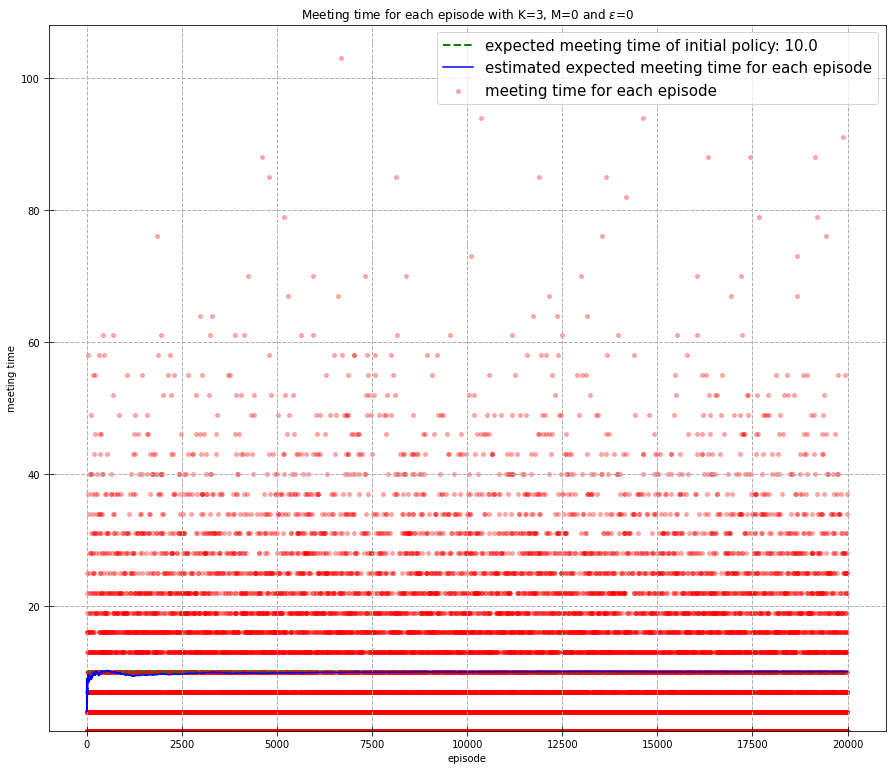

In [ ]:
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes)

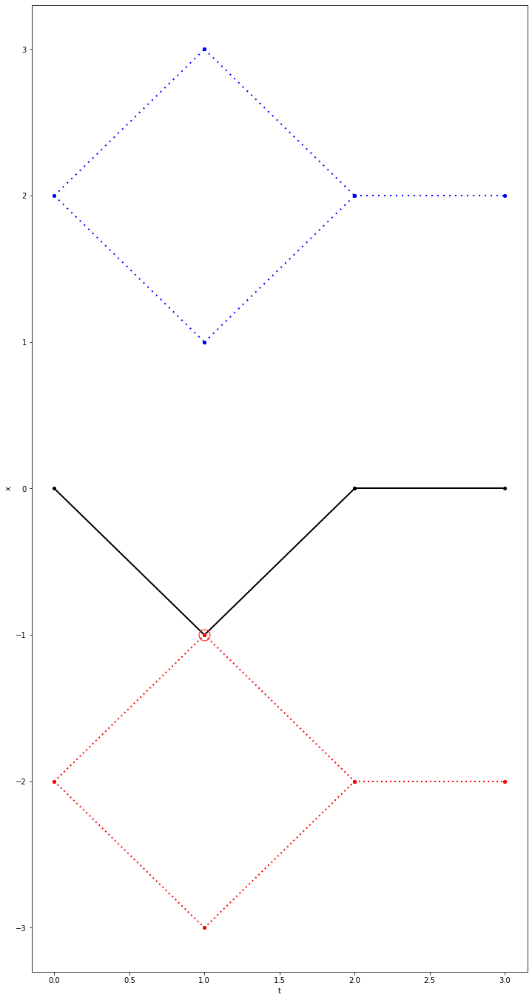

In [ ]:
policyTest.plot_tree(d=2)

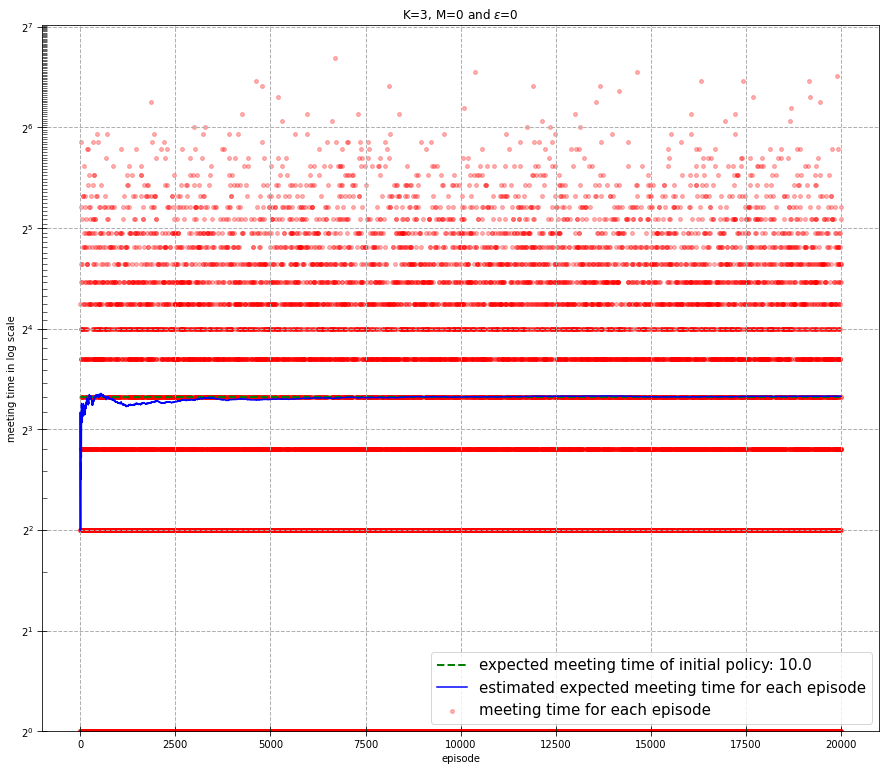

In [ ]:
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes, logplot=True)

```
Meeting_time 4 for episode: 0
Estimated meeting time: 4.0 for episode: 0
Meeting_time 7 for episode: 10000
Estimated meeting time: 9.89891010898906 for episode: 10000
Meeting_time 19 for episode: 20000
Estimated meeting time: 9.912704364781712 for episode: 20000
Meeting_time 4 for episode: 30000
Estimated meeting time: 9.897303423219102 for episode: 30000
Meeting_time 4 for episode: 40000
Estimated meeting time: 9.977125571860654 for episode: 40000
Meeting_time 31 for episode: 50000
Estimated meeting time: 9.968560628787541 for episode: 50000
Meeting_time 1 for episode: 60000
Estimated meeting time: 9.982400293328457 for episode: 60000
Meeting_time 7 for episode: 70000
Estimated meeting time: 9.967086184483236 for episode: 70000
Meeting_time 7 for episode: 80000
Estimated meeting time: 9.971012862339341 for episode: 80000
Meeting_time 1 for episode: 90000
Estimated meeting time: 9.992433417406524 for episode: 90000
Meeting_time 7 for episode: 100000
Estimated meeting time: 9.988540114598953 for episode: 100000
Meeting_time 1 for episode: 110000
Estimated meeting time: 9.992472795701943 for episode: 110000
Meeting_time 10 for episode: 120000
Estimated meeting time: 9.991400071666042 for episode: 120000
```

## (3 actions) Default Policy with $R \approx 17$ : {-1,1}, {1,-1}, {0,0} ( proba $1/3$ of choosing one of them) (not in Improved Bounds article)


In [ ]:
K = 1
M = 1
policyTest = BoundedDistancePreservingPolicyTree(np.array([]), np.array([-1, 0, 1]), K+M, M, K)
initial_expected_meeting_time = expected_meeting_time(policyTest, K, M)
print(f"expected meeting time of the policy: {initial_expected_meeting_time}")

expected meeting time of the policy: 17.00000000000003


We must get about: `17`

In [ ]:
episodes_rewards, meeting_times, estimated_expected_meeting_times = simulate_no_update_helper(policyTest, d=2, K=K, M=M, n_episodes=20001)

Meeting_time 7.0 for episode: 0
Estimated meeting time: 7.0 for episode: 0
Meeting_time 9.0 for episode: 10000
Estimated meeting time: 16.844215578442185 for episode: 10000
Meeting_time 13.0 for episode: 20000
Estimated meeting time: 17.005299735013224 for episode: 20000


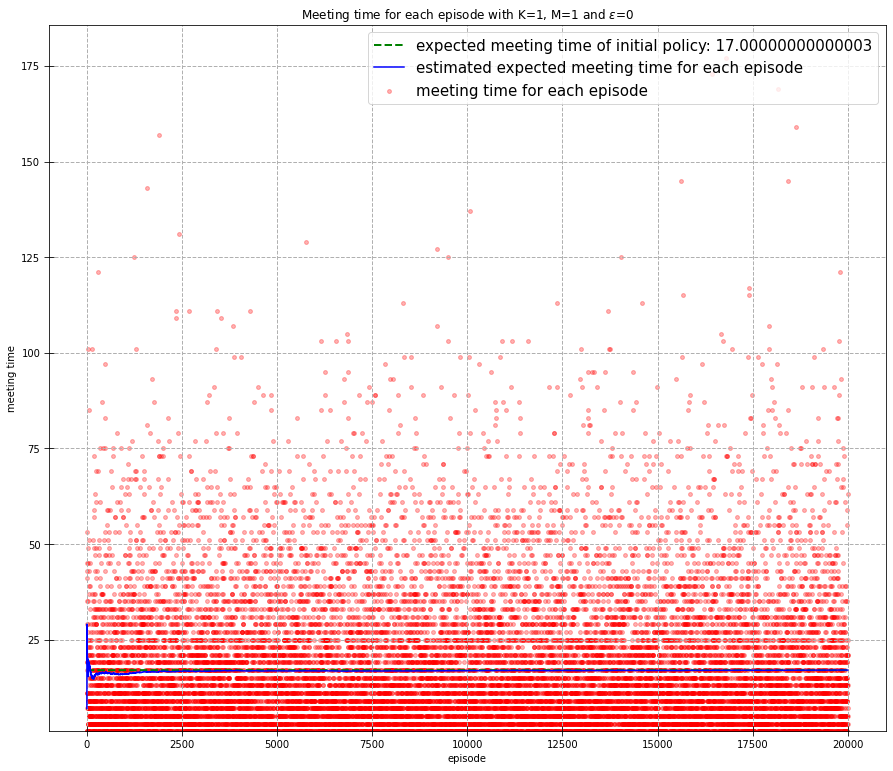

In [ ]:
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes)

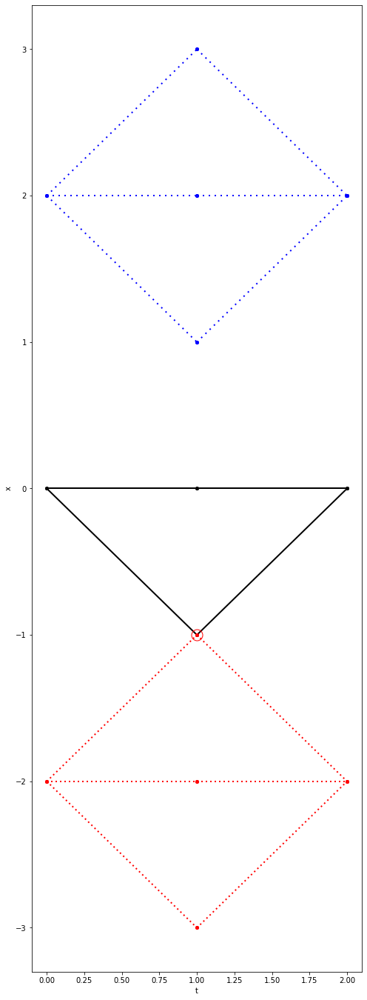

In [ ]:
policyTest.plot_tree(d=2)

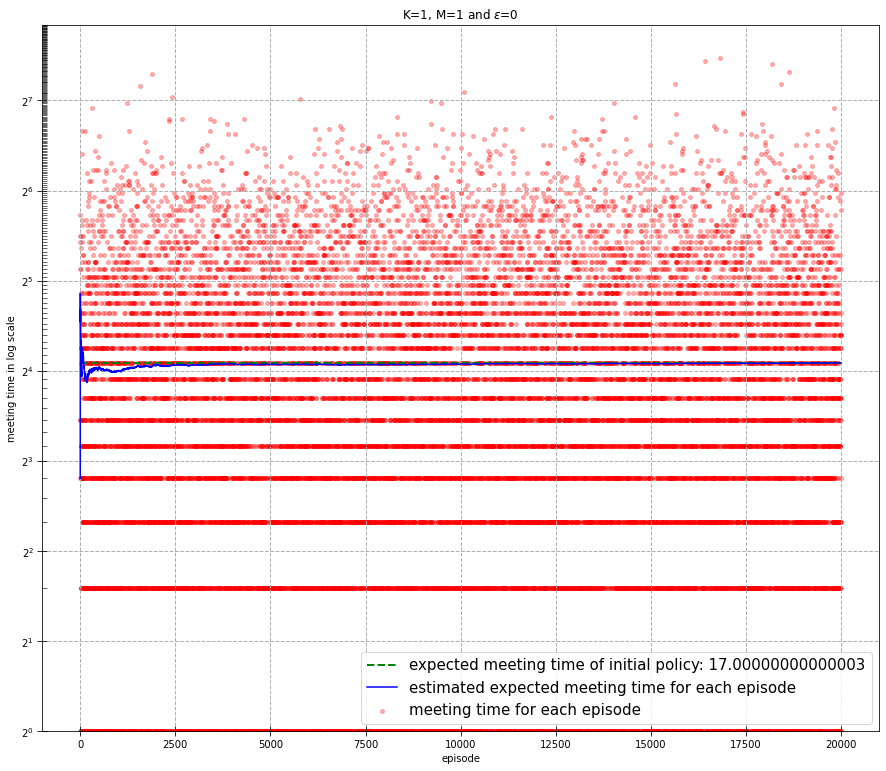

In [ ]:
plot_informations(initial_expected_meeting_time, episodes_rewards, meeting_times, K, M, estimated_expected_meeting_times, epsilon, n_episodes=n_episodes, logplot=True)